In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
import scipy as sp

## Data Collection

In [2]:
application_data = pd.read_csv(r"C:\Users\samba\Downloads\application_data.csv")

In [3]:
previous_application_data = pd.read_csv(r"C:\Users\samba\Downloads\Telegram Desktop\previous_application.csv")

## Data Transformation

In [4]:
application_data.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

## Here So many (122) Columns is there. Some columns not valid for our analysis so i want to drop some of columns So I use correlation between Variables
## Method = 'Pearson'

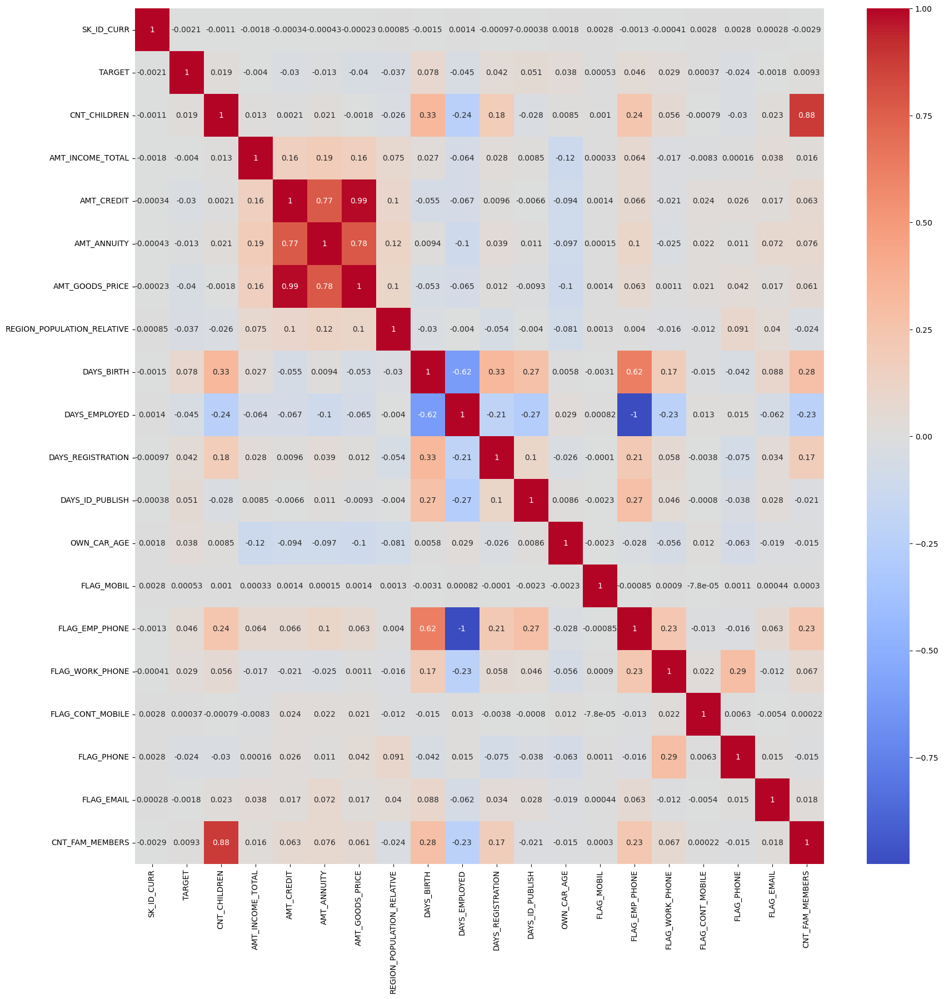

In [5]:
plt.figure(figsize = (20,20))
sns.heatmap(application_data.iloc[:,:30].corr(method = 'pearson'),cmap = 'coolwarm',annot = True)
plt.show()

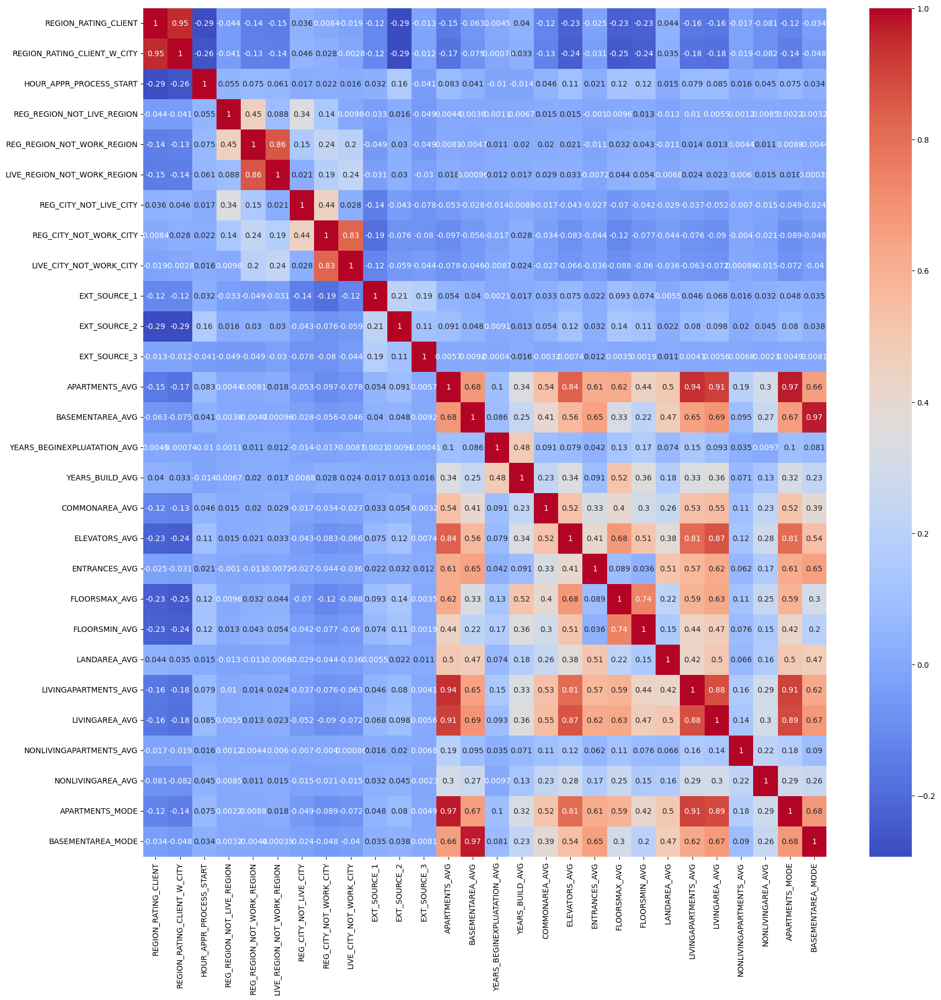

In [6]:
plt.figure(figsize = (20,20))
sns.heatmap(application_data.iloc[:,30:60].corr(),cmap = 'coolwarm',annot = True)
plt.show()

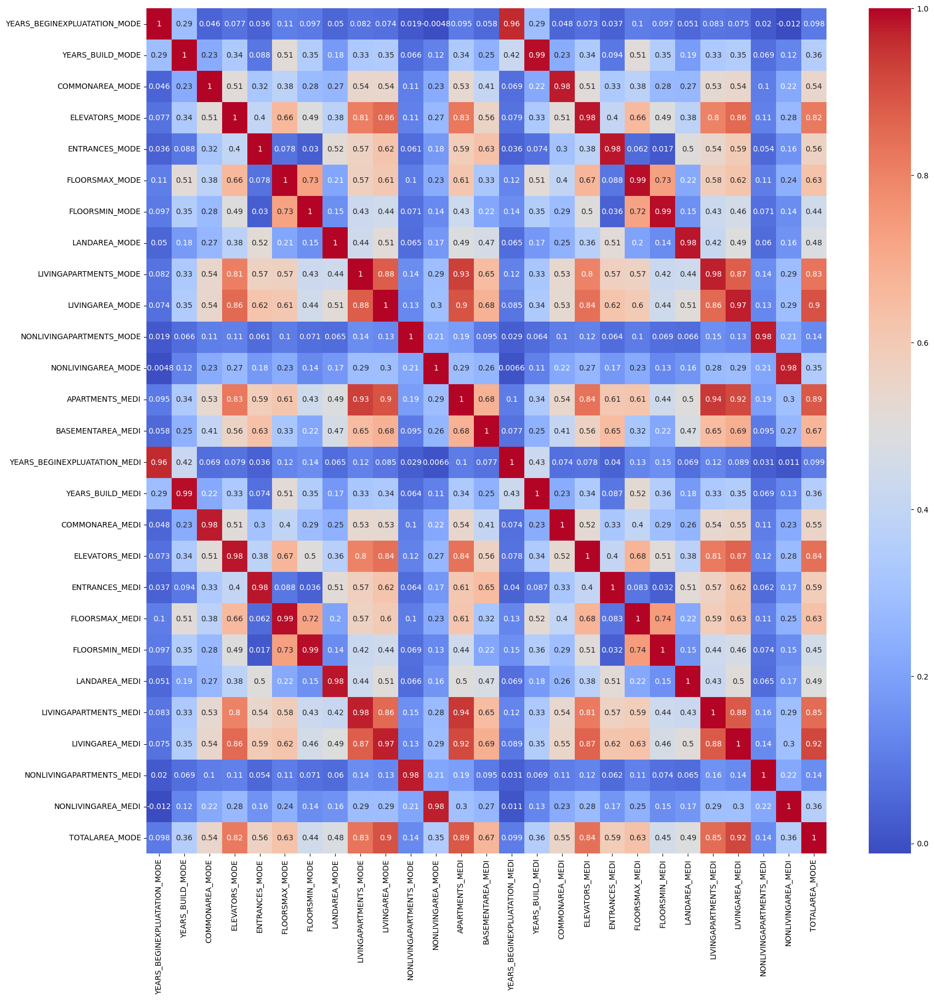

In [7]:
plt.figure(figsize = (20,20))
sns.heatmap(application_data.iloc[:,60:90].corr(method = 'pearson'),cmap = 'coolwarm',annot = True)
plt.show()

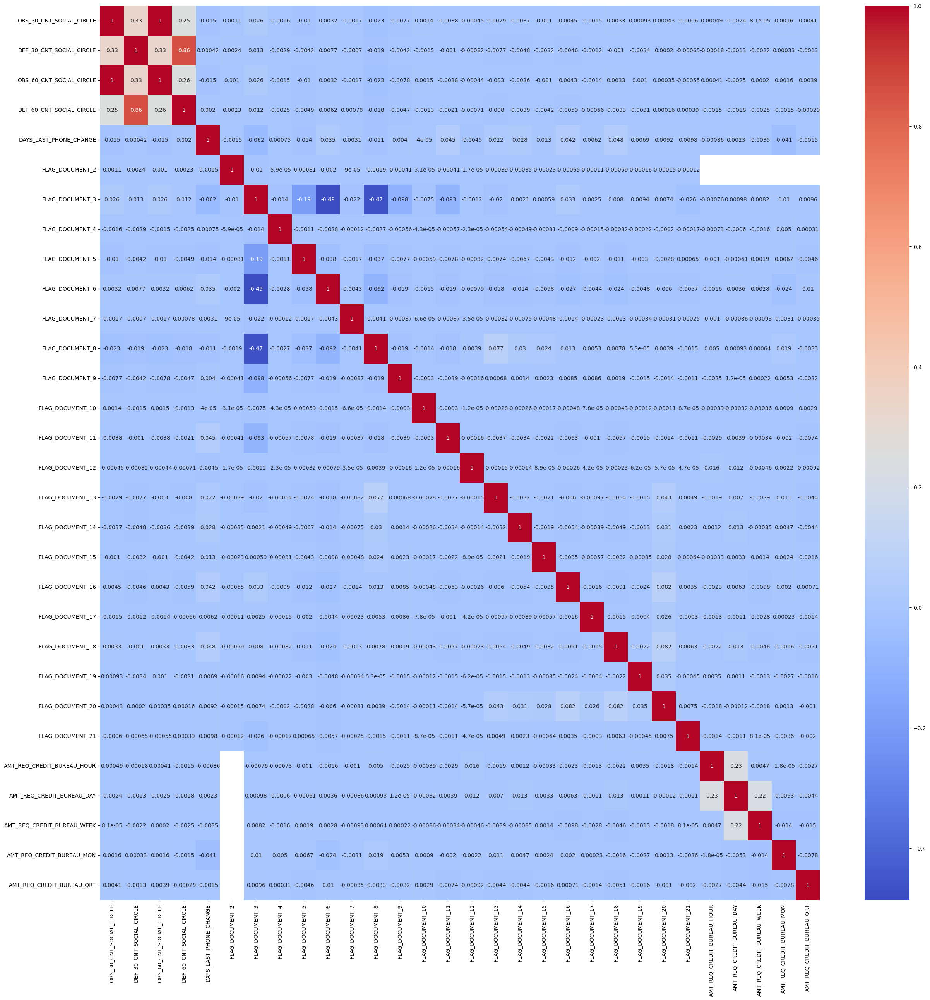

In [8]:
plt.figure(figsize = (30,30))
sns.heatmap(application_data.iloc[:,90:121].corr(method = 'pearson'),cmap = 'coolwarm',annot = True)
plt.show()

In [9]:
columns = application_data.columns.to_list()

In [10]:
Numerical_Columns = application_data.select_dtypes(include = [float,int])

In [11]:
columns_imp = []
for i in Numerical_Columns:
    print(i,application_data[i].corr(application_data['TARGET'],method = 'pearson'))
    if application_data[i].corr(application_data['TARGET'],method = 'pearson') >0.5 and application_data[i].corr(application_data['TARGET'],method = 'pearson')<-0.5:
        columns_imp.append(i)
        

SK_ID_CURR -0.002108469018197723
TARGET 1.0
CNT_CHILDREN 0.01918713359627005
AMT_INCOME_TOTAL -0.003981865601205666
AMT_CREDIT -0.030369286461429768
AMT_ANNUITY -0.012816561515413596
AMT_GOODS_PRICE -0.03964528116954426
REGION_POPULATION_RELATIVE -0.037227148542445354
DAYS_BIRTH 0.07823930830982712
DAYS_EMPLOYED -0.044931662657738784
DAYS_REGISTRATION 0.0419748628314172
DAYS_ID_PUBLISH 0.05145717260705751
OWN_CAR_AGE 0.03761156427516556
FLAG_MOBIL 0.0005343955790282348
FLAG_EMP_PHONE 0.0459822197165926
FLAG_WORK_PHONE 0.028524322363217617
FLAG_CONT_MOBILE 0.0003701268023489059
FLAG_PHONE -0.023806272330357297
FLAG_EMAIL -0.0017583834312546156
CNT_FAM_MEMBERS 0.009307784396531136
REGION_RATING_CLIENT 0.05889901494571248
REGION_RATING_CLIENT_W_CITY 0.060892667564823706
HOUR_APPR_PROCESS_START -0.024165831430094438
REG_REGION_NOT_LIVE_REGION 0.00557594452090834
REG_REGION_NOT_WORK_REGION 0.006941907545371692
LIVE_REGION_NOT_WORK_REGION 0.0028194791841589946
REG_CITY_NOT_LIVE_CITY 0.044395

In [12]:
columns_imp

[]

## So Target column could not be best positive or negative realtionship with all variables.
## So we can proceed to find all Variables correletion

In [13]:
columns_imp = []
for i in Numerical_Columns:
    for j in Numerical_Columns:
        if i!=j:
            #print(i,':',j,application_data[i].corr(application_data[j],method = 'pearson')
            if application_data[i].corr(application_data[j],method = 'pearson') >0.5 or application_data[i].corr(application_data['TARGET'],method = 'pearson')<-0.5:
                columns_imp.append(i)

In [14]:
columns_imp = set(columns_imp)

In [15]:
columns_imp.add('TARGET')
columns_imp.add('SK_ID_CURR')

In [16]:
Categorical_Columns = application_data.select_dtypes(exclude = [float,int])

In [17]:
Numerical_Columns

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775,365243,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
Categorical_Columns

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,Sales staff,THURSDAY,Services,reg oper account,block of flats,"Stone, brick",No
307507,Cash loans,F,N,Y,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,NaN,MONDAY,XNA,reg oper account,block of flats,"Stone, brick",No
307508,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,Managers,THURSDAY,School,reg oper account,block of flats,Panel,No
307509,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 1,NaN,block of flats,"Stone, brick",No


In [19]:
Total_Columns = list(columns_imp)+list(Categorical_Columns)

In [20]:
New_Application_data = application_data[Total_Columns]

## Exploratory Data Analysis Starts

## Descriptive Statistics

In [21]:
New_Application_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 80 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   LIVE_REGION_NOT_WORK_REGION   307511 non-null  int64  
 1   COMMONAREA_AVG                92646 non-null   float64
 2   LIVINGAREA_MODE               153161 non-null  float64
 3   APARTMENTS_MEDI               151450 non-null  float64
 4   LIVINGAPARTMENTS_MEDI         97312 non-null   float64
 5   LANDAREA_MODE                 124921 non-null  float64
 6   LIVINGAREA_AVG                153161 non-null  float64
 7   TARGET                        307511 non-null  int64  
 8   ENTRANCES_MEDI                152683 non-null  float64
 9   CNT_FAM_MEMBERS               307509 non-null  float64
 10  YEARS_BUILD_MEDI              103023 non-null  float64
 11  CNT_CHILDREN                  307511 non-null  int64  
 12  DEF_30_CNT_SOCIAL_CIRCLE      306490 non-nul

In [22]:
New_Application_data.describe()

,LIVE_REGION_NOT_WORK_REGION,COMMONAREA_AVG,LIVINGAREA_MODE,APARTMENTS_MEDI,LIVINGAPARTMENTS_MEDI,LANDAREA_MODE,LIVINGAREA_AVG,TARGET,ENTRANCES_MEDI,CNT_FAM_MEMBERS,...,APARTMENTS_AVG,NONLIVINGAPARTMENTS_MODE,REG_REGION_NOT_WORK_REGION,NONLIVINGAPARTMENTS_AVG,COMMONAREA_MEDI,ELEVATORS_AVG,NONLIVINGAREA_MEDI,FLAG_DOCUMENT_6,REG_CITY_NOT_WORK_CITY,FLAG_EMP_PHONE
count,307511.000000,92646.000000,153161.000000,151450.000000,97312.000000,124921.000000,153161.000000,307511.000000,152683.000000,307509.000000,...,151450.00000,93997.000000,307511.000000,93997.000000,92646.000000,143620.000000,137829.000000,307511.000000,307511.000000,307511.000000
mean,0.040659,0.044621,0.105975,0.117850,0.101954,0.064958,0.107399,0.080729,0.149213,2.152665,...,0.11744,0.008076,0.050769,0.008809,0.044595,0.078942,0.028236,0.088055,0.230454,0.819889
std,0.197499,0.076036,0.111845,0.109076,0.093642,0.081750,0.110565,0.272419,0.100368,0.910682,...,0.10824,0.046276,0.219526,0.047732,0.076144,0.134576,0.070166,0.283376,0.421124,0.384280
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.007800,0.042700,0.058300,0.051300,0.016600,0.045300,0.000000,0.069000,2.000000,...,0.05770,0.000000,0.000000,0.000000,0.007900,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.000000,0.021100,0.073100,0.086400,0.076100,0.045800,0.074500,0.000000,0.137900,2.000000,...,0.08760,0.000000,0.000000,0.000000,0.020800,0.000000,0.003100,0.000000,0.000000,1.000000
75%,0.000000,0.051500,0.125200,0.148900,0.123100,0.084100,0.129900,0.000000,0.206900,3.000000,...,0.14850,0.003900,0.000000,0.003900,0.051300,0.120000,0.026600,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,20.000000,...,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [23]:
for i in Categorical_Columns:
    New_Application_data[i].map(str)
    

In [24]:
a =(New_Application_data.isna().sum()/len(New_Application_data))*100
a.reset_index()
a[0:30]

LIVE_REGION_NOT_WORK_REGION      0.000000
COMMONAREA_AVG                  69.872297
LIVINGAREA_MODE                 50.193326
APARTMENTS_MEDI                 50.749729
LIVINGAPARTMENTS_MEDI           68.354953
LANDAREA_MODE                   59.376738
LIVINGAREA_AVG                  50.193326
TARGET                           0.000000
ENTRANCES_MEDI                  50.348768
CNT_FAM_MEMBERS                  0.000650
YEARS_BUILD_MEDI                66.497784
CNT_CHILDREN                     0.000000
DEF_30_CNT_SOCIAL_CIRCLE         0.332021
FLOORSMAX_AVG                   49.760822
YEARS_BEGINEXPLUATATION_MEDI    48.781019
DEF_60_CNT_SOCIAL_CIRCLE         0.332021
YEARS_BUILD_MODE                66.497784
ELEVATORS_MODE                  53.295980
AMT_ANNUITY                      0.003902
FLOORSMIN_MEDI                  67.848630
TOTALAREA_MODE                  48.268517
YEARS_BUILD_AVG                 66.497784
REGION_RATING_CLIENT             0.000000
ENTRANCES_AVG                   50

In [25]:
a[30:72]

YEARS_BEGINEXPLUATATION_AVG     48.781019
REGION_RATING_CLIENT_W_CITY      0.000000
ENTRANCES_MODE                  50.348768
BASEMENTAREA_AVG                58.515956
AMT_GOODS_PRICE                  0.090403
BASEMENTAREA_MODE               58.515956
FLOORSMAX_MEDI                  49.760822
LIVINGAREA_MEDI                 50.193326
LANDAREA_MEDI                   59.376738
DAYS_BIRTH                       0.000000
LIVINGAPARTMENTS_AVG            68.354953
BASEMENTAREA_MEDI               58.515956
LANDAREA_AVG                    59.376738
FLOORSMIN_AVG                   67.848630
OBS_60_CNT_SOCIAL_CIRCLE         0.332021
SK_ID_CURR                       0.000000
LIVINGAPARTMENTS_MODE           68.354953
YEARS_BEGINEXPLUATATION_MODE    48.781019
ELEVATORS_MEDI                  53.295980
DAYS_EMPLOYED                    0.000000
APARTMENTS_MODE                 50.749729
FLOORSMIN_MODE                  67.848630
NONLIVINGAPARTMENTS_MEDI        69.432963
FLOORSMAX_MODE                  49

In [26]:
more_missing_values_columns = a[a > 50].index.tolist()

In [27]:
print(more_missing_values_columns)
print(len(more_missing_values_columns))

['COMMONAREA_AVG', 'LIVINGAREA_MODE', 'APARTMENTS_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LANDAREA_MODE', 'LIVINGAREA_AVG', 'ENTRANCES_MEDI', 'YEARS_BUILD_MEDI', 'YEARS_BUILD_MODE', 'ELEVATORS_MODE', 'FLOORSMIN_MEDI', 'YEARS_BUILD_AVG', 'ENTRANCES_AVG', 'NONLIVINGAREA_MODE', 'NONLIVINGAREA_AVG', 'COMMONAREA_MODE', 'ENTRANCES_MODE', 'BASEMENTAREA_AVG', 'BASEMENTAREA_MODE', 'LIVINGAREA_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_AVG', 'BASEMENTAREA_MEDI', 'LANDAREA_AVG', 'FLOORSMIN_AVG', 'LIVINGAPARTMENTS_MODE', 'ELEVATORS_MEDI', 'APARTMENTS_MODE', 'FLOORSMIN_MODE', 'NONLIVINGAPARTMENTS_MEDI', 'APARTMENTS_AVG', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_AVG', 'COMMONAREA_MEDI', 'ELEVATORS_AVG', 'NONLIVINGAREA_MEDI', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE']
39


In [28]:
more_than_50_Numerical = []
for i in Numerical_Columns:
    if i in more_missing_values_columns:more_than_50_Numerical.append(i)     

In [29]:
for i in more_than_50_Numerical:
    # Perform Mean imputation
    New_Application_data[i].fillna(New_Application_data[i].mean(),inplace = True)

C:\Users\samba\AppData\Local\Temp\ipykernel_9036\827270974.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i].fillna(New_Application_data[i].mean(),inplace = True)


In [30]:
more_than_50_Categorical = []
for i in Categorical_Columns:
    if i in more_missing_values_columns:more_than_50_Categorical.append(i)

In [31]:
for i in more_than_50_Categorical:
    # Perform mode imputation
    New_Application_data[i].fillna(New_Application_data[i].mode(),inplace = True)


C:\Users\samba\AppData\Local\Temp\ipykernel_9036\2127718343.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i].fillna(New_Application_data[i].mode(),inplace = True)
C:\Users\samba\AppData\Local\Temp\ipykernel_9036\2127718343.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i].fillna(New_Application_data[i].mode(),inplace = True)
C:\Users\samba\AppData\Local\Temp\ipykernel_9036\2127718343.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_

In [32]:
a = (New_Application_data.isna().sum() / len(New_Application_data)) * 100
ten_50_missing = a[(a < 50) & (a < 10)].index.tolist()

In [33]:
ten_50_missing_Numerical = []
for i in ten_50_missing:
    if i in Numerical_Columns:
        ten_50_missing_Numerical.append(i)

In [34]:
ten_50_missing_Categorical = []
for i in ten_50_missing:
    if i in Categorical_Columns:
        ten_50_missing_Categorical.append(i)

In [35]:
imputer = KNNImputer(n_neighbors=2)

for i in ten_50_missing_Numerical:
    # Perform KNN imputation
    New_Application_data[i] = imputer.fit_transform(New_Application_data[[i]])


C:\Users\samba\AppData\Local\Temp\ipykernel_9036\199594036.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i] = imputer.fit_transform(New_Application_data[[i]])
C:\Users\samba\AppData\Local\Temp\ipykernel_9036\199594036.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i] = imputer.fit_transform(New_Application_data[[i]])
C:\Users\samba\AppData\Local\Temp\ipykernel_9036\199594036.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

C:\Users\samba\AppData\Local\Temp\ipykernel_9036\199594036.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i] = imputer.fit_transform(New_Application_data[[i]])
C:\Users\samba\AppData\Local\Temp\ipykernel_9036\199594036.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i] = imputer.fit_transform(New_Application_data[[i]])
C:\Users\samba\AppData\Local\Temp\ipykernel_9036\199594036.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

C:\Users\samba\AppData\Local\Temp\ipykernel_9036\199594036.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i] = imputer.fit_transform(New_Application_data[[i]])
C:\Users\samba\AppData\Local\Temp\ipykernel_9036\199594036.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i] = imputer.fit_transform(New_Application_data[[i]])
C:\Users\samba\AppData\Local\Temp\ipykernel_9036\199594036.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

In [36]:
for i in ten_50_missing_Categorical:
    # Perform mode imputation
    New_Application_data[i].fillna(New_Application_data[i].mode(),inplace = True)


C:\Users\samba\AppData\Local\Temp\ipykernel_9036\216617302.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i].fillna(New_Application_data[i].mode(),inplace = True)
C:\Users\samba\AppData\Local\Temp\ipykernel_9036\216617302.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data[i].fillna(New_Application_data[i].mode(),inplace = True)
C:\Users\samba\AppData\Local\Temp\ipykernel_9036\216617302.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

In [37]:
ten_missing_values_column = a[a<10].index.tolist()

In [38]:
a = (New_Application_data.isna().sum() / len(New_Application_data)) * 100

In [39]:
New_Application_data.isna().sum().sum()

1821883

In [40]:
columns = New_Application_data.columns

for i in ten_missing_values_column:
    for i in columns:
        New_Application_data.dropna(subset = [i],inplace = True)
        
 It takes lot of time so i drop all rows remaining 10% columns
        

In [41]:
New_Application_data.dropna(axis = 0,inplace = True)

C:\Users\samba\AppData\Local\Temp\ipykernel_9036\3409339874.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Application_data.dropna(axis = 0,inplace = True)


### Here I use More than 50% Data I use I use Mean  or Median Imputations
### Here I use 10%-50% Data I use K-Nearest Neighbour technique to fill missing Values
### for Categorical Data I use Mode Technique
### lessthan 10% Data I use drop that na values.
### if drop na's then i loss total data.

## why Iam using Mean for More than 50% columns. Because If I use KNN It takes lot of Time
## Why Iam Using KNN imputation for 10-50%. Because If i use mean for that it will effected by outliers. so I use KNN for that
## mode imputation is more effective for categorical columns.

## Here Nearly 39 columns is missing values The Analysis Should not be Perfect. Because More than 50% data is missing

In [42]:
Numerical_Columns =New_Application_data.select_dtypes(include = [float,int])
Numerical_Columns = Numerical_Columns.columns

In [43]:
def Descriptive_Analysis():
    for i in Numerical_Columns:
        median = np.median(New_Application_data[i])
        mean = np.mean(New_Application_data[i])
        standard_deviation =np.std(New_Application_data[i])
        variance = np.var(New_Application_data[i])
        skewness = sp.stats.skew(New_Application_data[i])
        kurtosis = sp.stats.kurtosis(New_Application_data[i])
        print('central tendency')
        print('median of',i,'=',median)
        print('mean of',i,'=',mean,'\n')
        print("Dispersion")
        print('variance of',i,'=',variance)
        print('Standard Deviation of',i,'=',standard_deviation,'\n')
        print('Skewness')
        print('skewness of',i,'=',skewness,'\n')
        print('kurtosis')
        print('kurtosis of',i,'=',kurtosis,'\n')

In [44]:
Descriptive_Analysis()

central tendency
median of LIVE_REGION_NOT_WORK_REGION = 0.0
mean of LIVE_REGION_NOT_WORK_REGION = 0.0479361257980466 

Dispersion
variance of LIVE_REGION_NOT_WORK_REGION = 0.045638253641463185
Standard Deviation of LIVE_REGION_NOT_WORK_REGION = 0.2136311158082155 

Skewness
skewness of LIVE_REGION_NOT_WORK_REGION = 4.2321912937767365 

kurtosis
kurtosis of LIVE_REGION_NOT_WORK_REGION = 15.91144314711962 

central tendency
median of COMMONAREA_AVG = 0.0263
mean of COMMONAREA_AVG = 0.0446392220755742 

Dispersion
variance of COMMONAREA_AVG = 0.005177815843557761
Standard Deviation of COMMONAREA_AVG = 0.07195704165373783 

Skewness
skewness of COMMONAREA_AVG = 5.690455381679757 

kurtosis
kurtosis of COMMONAREA_AVG = 50.424308524715656 

central tendency
median of LIVINGAREA_MODE = 0.0777
mean of LIVINGAREA_MODE = 0.11206169056024254 

Dispersion
variance of LIVINGAREA_MODE = 0.012800274247346428
Standard Deviation of LIVINGAREA_MODE = 0.11313829699684554 

Skewness
skewness of LIVINGARE

# Same Steps applied for Previous application Data

In [45]:
previous_application_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [46]:
previous_application_data.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,...,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,...,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,...,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,...,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,...,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,...,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [47]:
b = (previous_application_data.isna().sum() / len(previous_application_data)) * 100
ten_50_missing = b[(b < 50) & (b < 10)].index.tolist()

In [48]:
more_missing_values_columns = b[b > 50].index.tolist()

In [49]:
Categorical_Columns = previous_application_data.select_dtypes(exclude = [float,int])
Categorical_Columns=Categorical_Columns.columns

In [50]:
Numerical_Columns = previous_application_data.select_dtypes(include = [float,int])
Numerical_Columns=Numerical_Columns.columns

In [51]:
more_than_50_Categorical = []
for i in Categorical_Columns:
    if i in more_missing_values_columns:more_than_50_Categorical.append(i)
for i in more_than_50_Categorical:
    # Perform mode imputation
    previous_application_data[i].fillna(previous_application_data[i].mode(),inplace = True)

more_than_50_Numerical = []
for i in Numerical_Columns:
    if i in more_missing_values_columns:more_than_50_Numerical.append(i)     
for i in more_than_50_Numerical:
    # Perform Mean imputation
    previous_application_data[i].fillna(previous_application_data[i].mean(),inplace = True)

In [52]:
ten_50_missing_Numerical = []
for i in ten_50_missing:
    if i in Numerical_Columns:
        ten_50_missing_Numerical.append(i)
ten_50_missing_Categorical = []
for i in ten_50_missing:
    if i in Categorical_Columns:
        ten_50_missing_Categorical.append(i)

In [53]:
imputer = KNNImputer(n_neighbors=2)

for i in ten_50_missing_Numerical:
    # Perform KNN imputation
    previous_application_data[i] = imputer.fit_transform(previous_application_data[[i]])


In [54]:
for i in ten_50_missing_Categorical:
    # Perform mode imputation
    previous_application_data[i].fillna(previous_application_data[i].mode(),inplace = True)


In [55]:
previous_application_data.dropna(axis = 0,inplace = True)

In [56]:
def Descriptive_Analysis():
    for i in previous_application_data.select_dtypes(include = (float,int)):
        median = np.median(previous_application_data[i])
        mean = np.mean(previous_application_data[i])
        standard_deviation =np.std(previous_application_data[i])
        variance = np.var(previous_application_data[i])
        skewness = sp.stats.skew(previous_application_data[i])
        kurtosis = sp.stats.kurtosis(previous_application_data[i])
        print('central tendency')
        print('median of',i,'=',median)
        print('mean of',i,'=',mean,'\n')
        print("Dispersion")
        print('variance of',i,'=',variance)
        print('Standard Deviation of',i,'=',standard_deviation,'\n')
        print('Skewness')
        print('skewness of',i,'=',skewness,'\n')
        print('kurtosis')
        print('kurtosis of',i,'=',kurtosis,'\n')

In [57]:
Descriptive_Analysis()

central tendency
median of SK_ID_PREV = 1896693.0
mean of SK_ID_PREV = 1903249.744601189 

Dispersion
variance of SK_ID_PREV = 286682191260.20514
Standard Deviation of SK_ID_PREV = 535427.1110620055 

Skewness
skewness of SK_ID_PREV = 0.04515257161371616 

kurtosis
kurtosis of SK_ID_PREV = -1.2143927383439428 

central tendency
median of SK_ID_CURR = 278539.0
mean of SK_ID_CURR = 278327.6978483085 

Dispersion
variance of SK_ID_CURR = 10576405378.878756
Standard Deviation of SK_ID_CURR = 102841.65196494441 

Skewness
skewness of SK_ID_CURR = -0.0011834173494445945 

kurtosis
kurtosis of SK_ID_CURR = -1.1995732752910766 

central tendency
median of AMT_ANNUITY = 10340.64
mean of AMT_ANNUITY = 14216.648371999234 

Dispersion
variance of AMT_ANNUITY = 167317535.02214622
Standard Deviation of AMT_ANNUITY = 12935.12794765271 

Skewness
skewness of AMT_ANNUITY = 2.7736994223364313 

kurtosis
kurtosis of AMT_ANNUITY = 14.64873672727352 

central tendency
median of AMT_APPLICATION = 96516.0
me

# Step-2 Finding Outliers

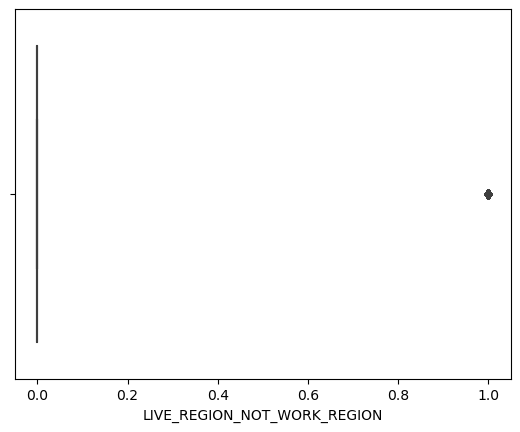

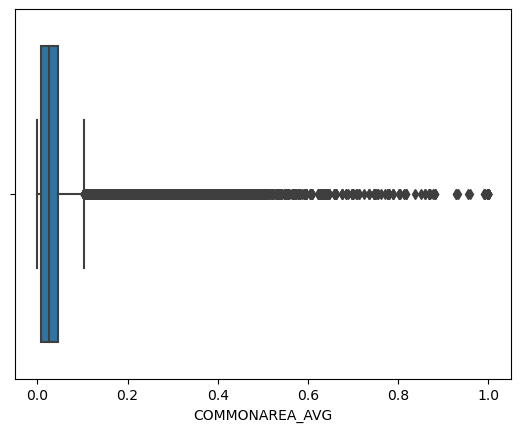

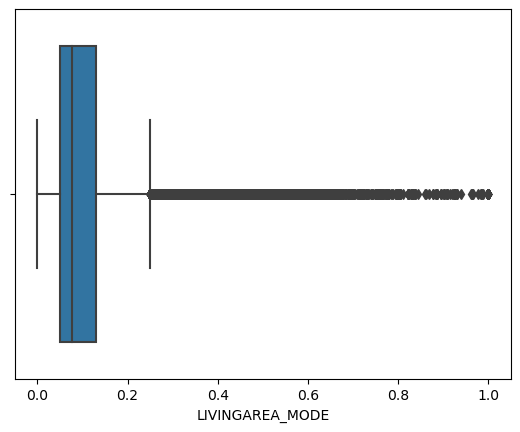

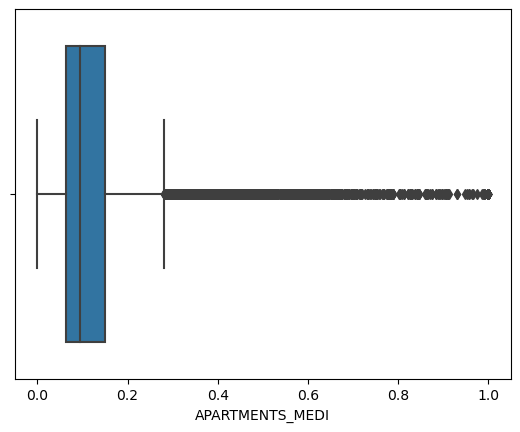

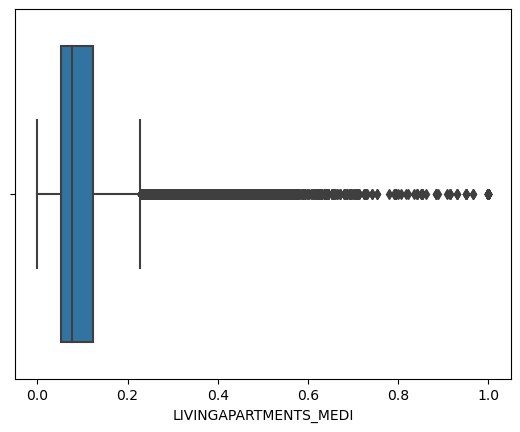

...

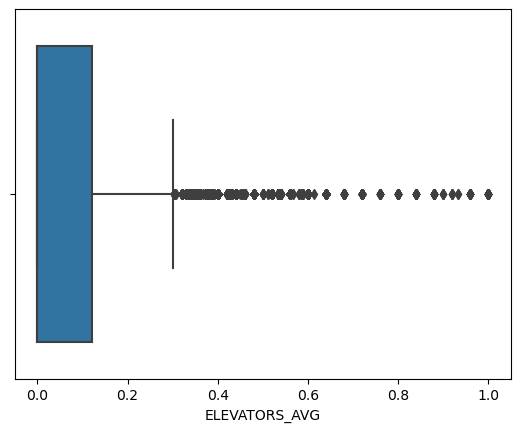

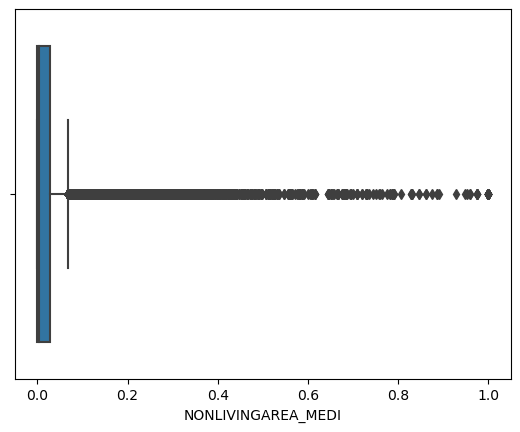

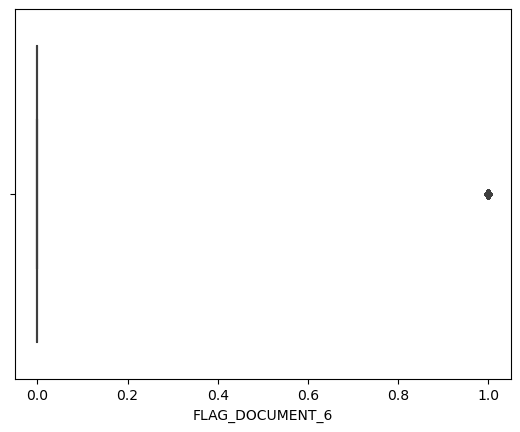

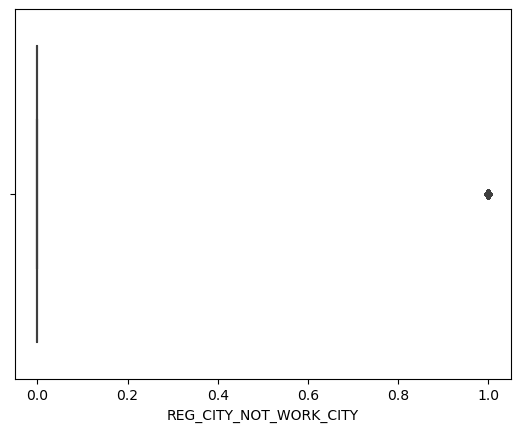

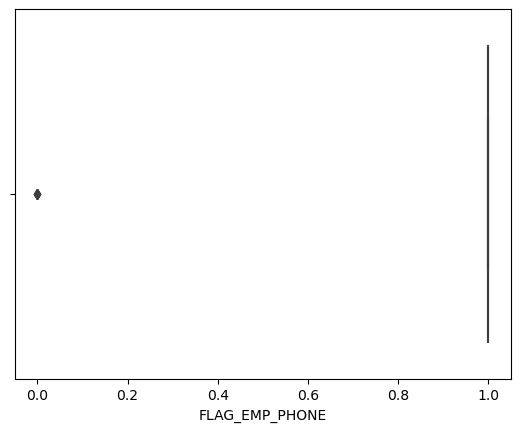

In [58]:
boxplot_columns = New_Application_data.select_dtypes(include = [float,int])
boxplot_columns = boxplot_columns.columns
for i in boxplot_columns :
    sns.boxplot(x = New_Application_data[i])
    plt.show()

#### Here I am Showing outliers of Each Parameter. Why Iam Considering this as Outliers Here Data Points Should lie in Less than (25%-(75%-25%)*1.5) or greater than (75%+(75%-25%)*1.5). So I consider that points as outliers.

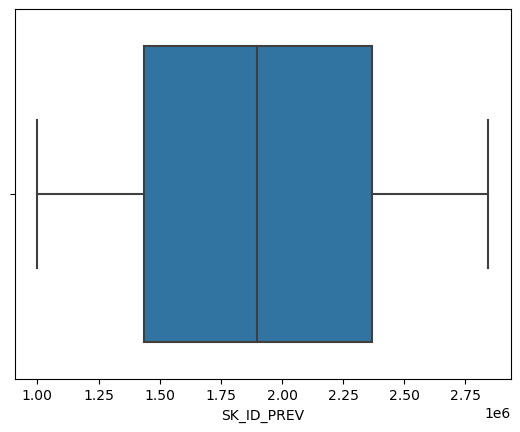

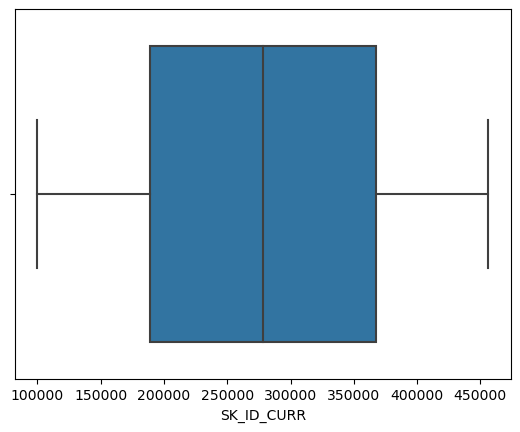

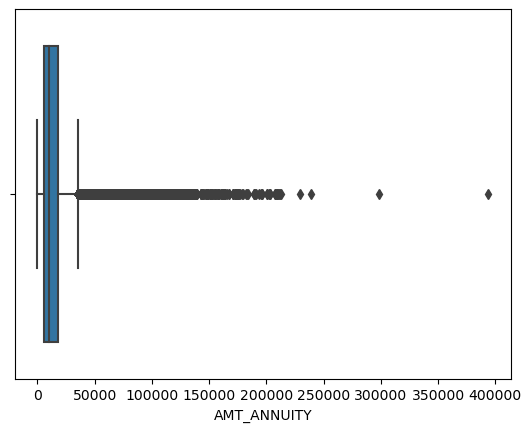

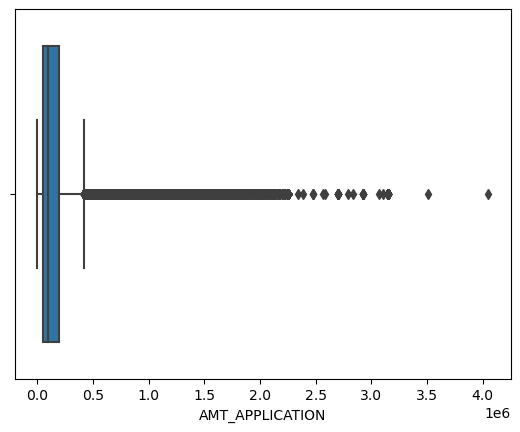

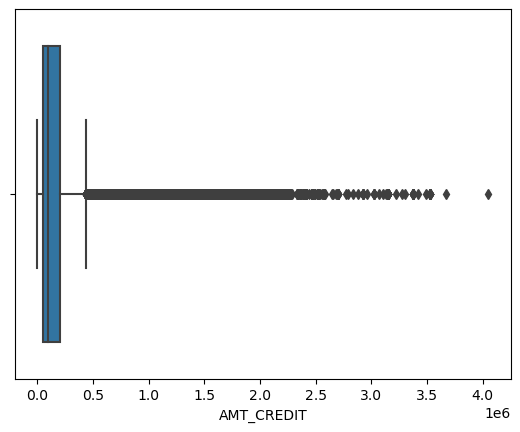

...

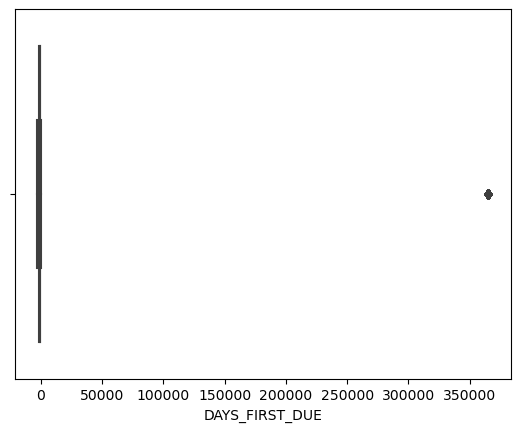

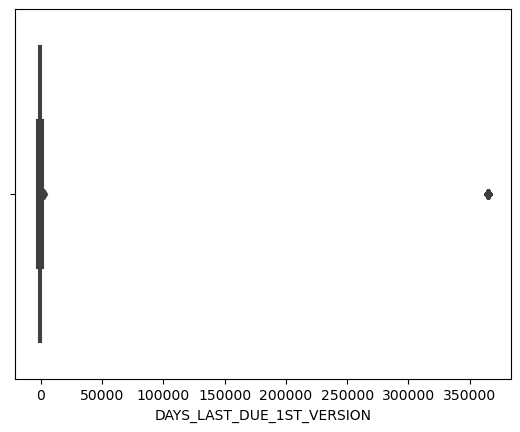

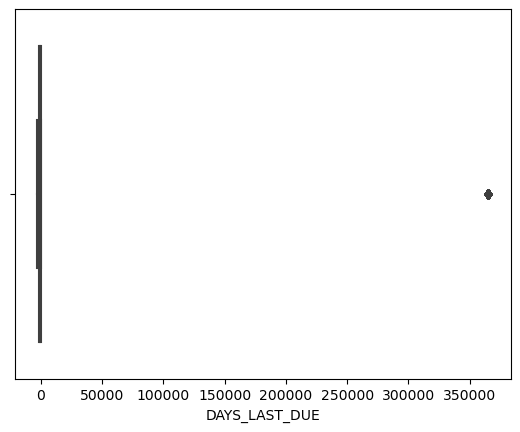

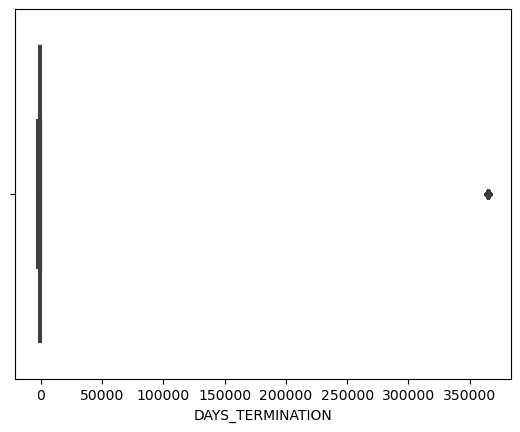

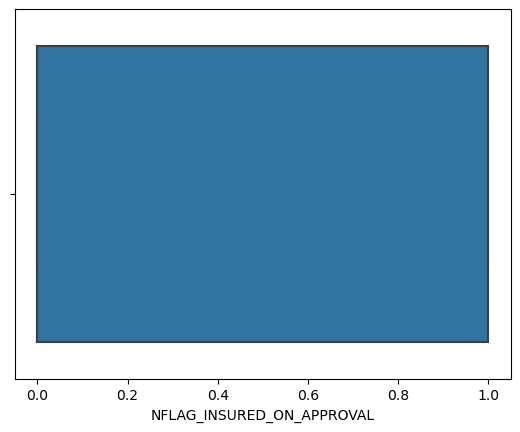

In [59]:
boxplot_columns = previous_application_data.select_dtypes(include = [float,int])
boxplot_columns = boxplot_columns.columns
for i in boxplot_columns :
    sns.boxplot(x = previous_application_data[i])
    plt.show()

In [60]:
columns = list(New_Application_data.select_dtypes(include = [float,int]).columns)
New_Application_data.describe()
for i in columns:
    Q1=New_Application_data.describe().loc["25%",i]
    Q3=New_Application_data.describe().loc["75%",i]
    IQR=Q3-Q1
    print(i,New_Application_data.loc[New_Application_data[i]<(Q1-IQR*1.5),i].count())
    c = (Q1-IQR*1.5)
    print(i,New_Application_data.loc[New_Application_data[i]>(Q3+IQR*1.5),i].count())
    b = (Q3+IQR*1.5)

LIVE_REGION_NOT_WORK_REGION 0
LIVE_REGION_NOT_WORK_REGION 3146
COMMONAREA_AVG 0
COMMONAREA_AVG 6054
LIVINGAREA_MODE 0
LIVINGAREA_MODE 6140
APARTMENTS_MEDI 0
APARTMENTS_MEDI 5219
LIVINGAPARTMENTS_MEDI 0
LIVINGAPARTMENTS_MEDI 5133
LANDAREA_MODE 0
LANDAREA_MODE 3830
LIVINGAREA_AVG 0
LIVINGAREA_AVG 5377
TARGET 0
TARGET 4966
ENTRANCES_MEDI 0
ENTRANCES_MEDI 1714
CNT_FAM_MEMBERS 0
CNT_FAM_MEMBERS 662
YEARS_BUILD_MEDI 1461
YEARS_BUILD_MEDI 0
CNT_CHILDREN 0
CNT_CHILDREN 713
DEF_30_CNT_SOCIAL_CIRCLE 0
DEF_30_CNT_SOCIAL_CIRCLE 7362
FLOORSMAX_AVG 0
FLOORSMAX_AVG 2559
YEARS_BEGINEXPLUATATION_MEDI 1412
YEARS_BEGINEXPLUATATION_MEDI 0
DEF_60_CNT_SOCIAL_CIRCLE 0
DEF_60_CNT_SOCIAL_CIRCLE 5461
YEARS_BUILD_MODE 1638
YEARS_BUILD_MODE 0
ELEVATORS_MODE 0
ELEVATORS_MODE 4586
AMT_ANNUITY 0
AMT_ANNUITY 1606
FLOORSMIN_MEDI 0
FLOORSMIN_MEDI 272
TOTALAREA_MODE 0
TOTALAREA_MODE 4655
YEARS_BUILD_AVG 1382
YEARS_BUILD_AVG 0
REGION_RATING_CLIENT 11219
REGION_RATING_CLIENT 9609
ENTRANCES_AVG 0
ENTRANCES_AVG 1714
AMT_CRE

## This is outliers count of New_Application Data

In [61]:
columns = list(previous_application_data.select_dtypes(include = [float,int]).columns)
previous_application_data.describe()
for i in columns:
    Q1=previous_application_data.describe().loc["25%",i]
    Q3=previous_application_data.describe().loc["75%",i]
    IQR=Q3-Q1
    print(i,previous_application_data.loc[previous_application_data[i]<(Q1-IQR*1.5),i].count())
    c = (Q1-IQR*1.5)
    print(i,previous_application_data.loc[previous_application_data[i]>(Q3+IQR*1.5),i].count())
    b = (Q3+IQR*1.5)

SK_ID_PREV 0
SK_ID_PREV 0
SK_ID_CURR 0
SK_ID_CURR 0
AMT_ANNUITY 0
AMT_ANNUITY 41935
AMT_APPLICATION 0
AMT_APPLICATION 70204
AMT_CREDIT 0
AMT_CREDIT 71987
AMT_DOWN_PAYMENT 0
AMT_DOWN_PAYMENT 49548
AMT_GOODS_PRICE 0
AMT_GOODS_PRICE 70204
HOUR_APPR_PROCESS_START 258
HOUR_APPR_PROCESS_START 30
NFLAG_LAST_APPL_IN_DAY 6
NFLAG_LAST_APPL_IN_DAY 0
RATE_DOWN_PAYMENT 0
RATE_DOWN_PAYMENT 30704
RATE_INTEREST_PRIMARY 16
RATE_INTEREST_PRIMARY 55
RATE_INTEREST_PRIVILEGED 46
RATE_INTEREST_PRIVILEGED 25
DAYS_DECISION 0
DAYS_DECISION 0
SELLERPLACE_AREA 0
SELLERPLACE_AREA 122161
CNT_PAYMENT 0
CNT_PAYMENT 29893
DAYS_FIRST_DRAWING 19147
DAYS_FIRST_DRAWING 0
DAYS_FIRST_DUE 0
DAYS_FIRST_DUE 22618
DAYS_LAST_DUE_1ST_VERSION 0
DAYS_LAST_DUE_1ST_VERSION 35386
DAYS_LAST_DUE 0
DAYS_LAST_DUE 123587
DAYS_TERMINATION 0
DAYS_TERMINATION 124536
NFLAG_INSURED_ON_APPROVAL 0
NFLAG_INSURED_ON_APPROVAL 0


## This is outliers count of Previous_Application Data

## Step-3 find data imbalance in New_application_data

In [62]:
data_aggregation = New_Application_data.groupby('TARGET').agg(rows = ('TARGET','size')).reset_index()

In [63]:
data_aggregation

,TARGET,rows
0,0.0,60663
1,1.0,4966


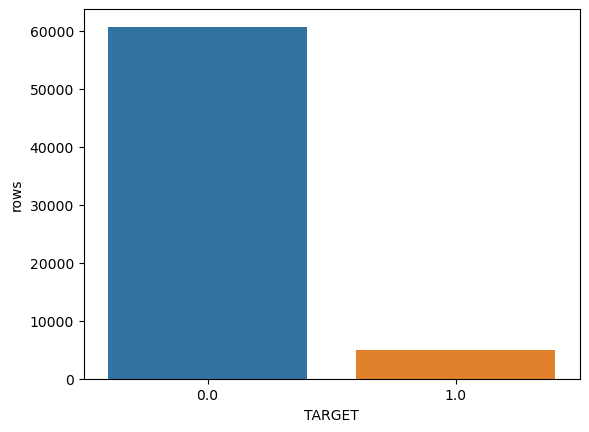

In [64]:
sns.barplot(x = 'TARGET',y = 'rows', data =data_aggregation )
plt.show()

In [65]:
imbalance =(data_aggregation['rows'][0]/(data_aggregation['rows'][1]+data_aggregation['rows'][0]))*100

In [66]:
imbalance

92.43322311782902

In [67]:
imbalance1 =(data_aggregation['rows'][1]/(data_aggregation['rows'][0]+data_aggregation['rows'][1]))*100

In [68]:
imbalance1

7.566776882170992

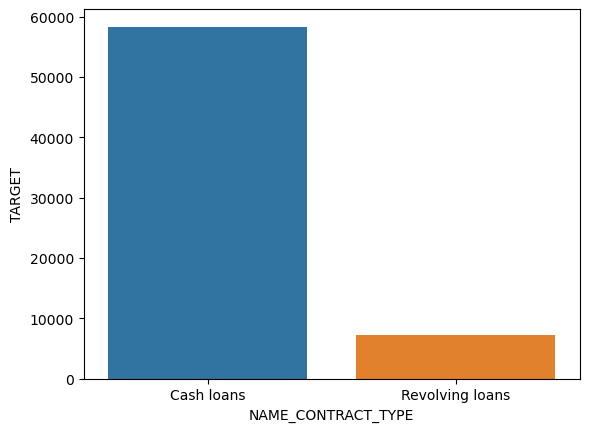

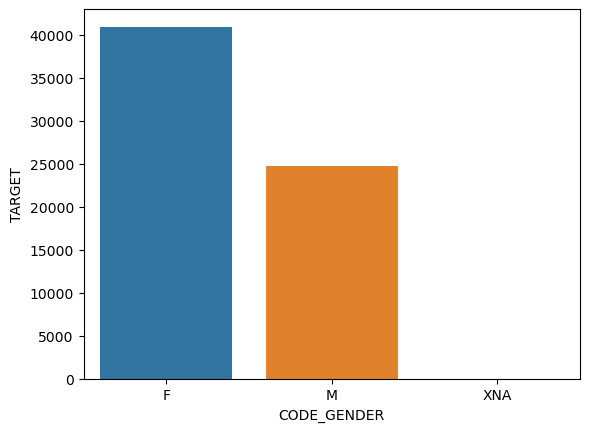

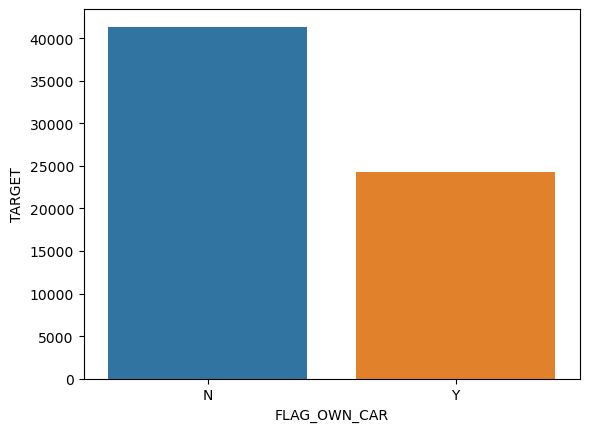

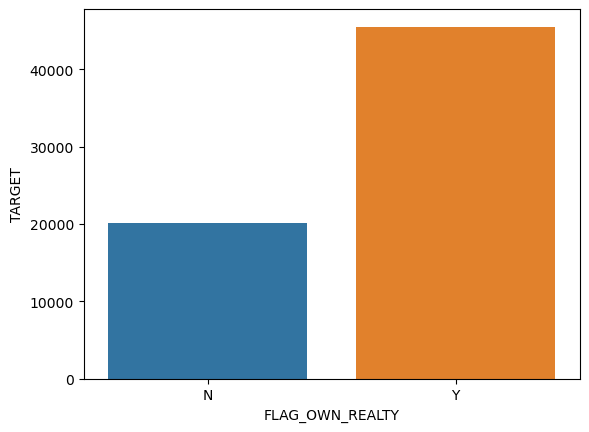

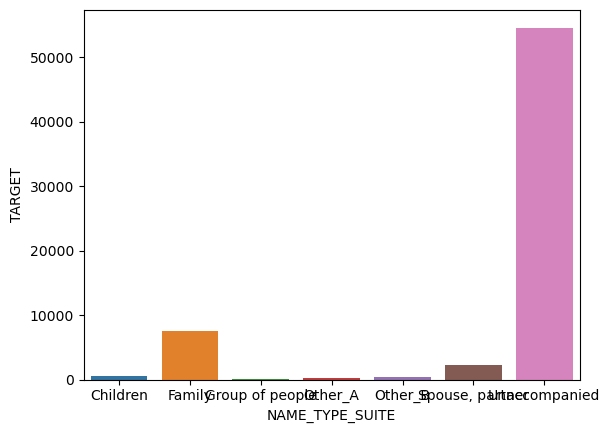

...

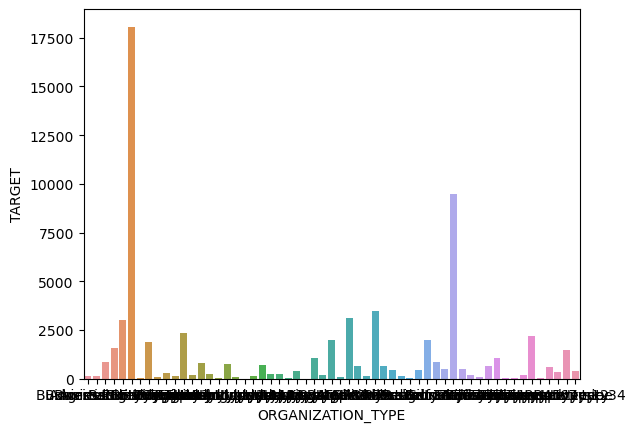

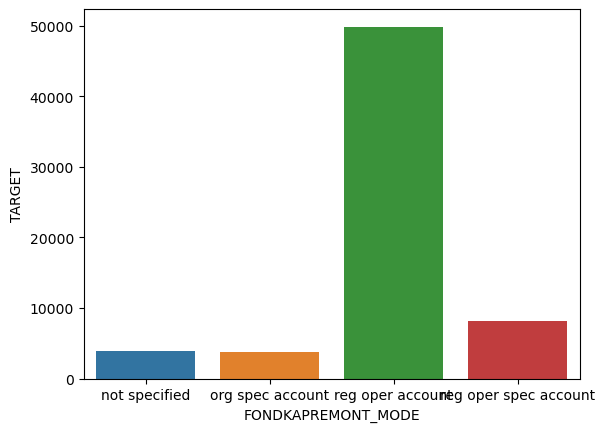

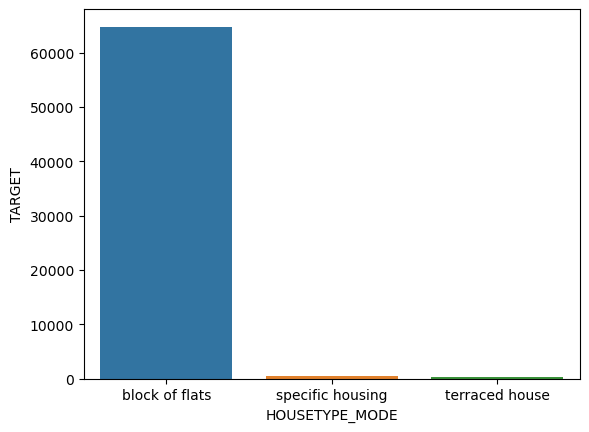

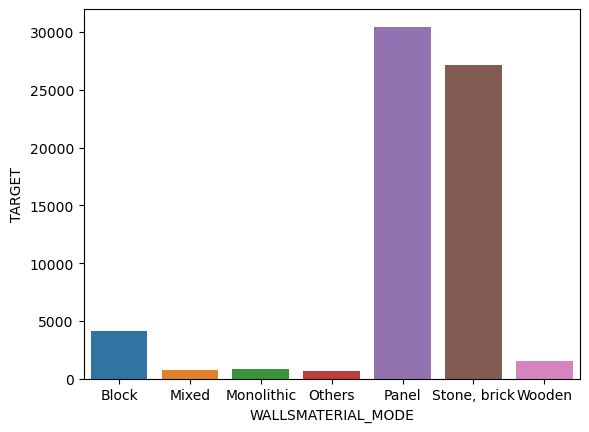

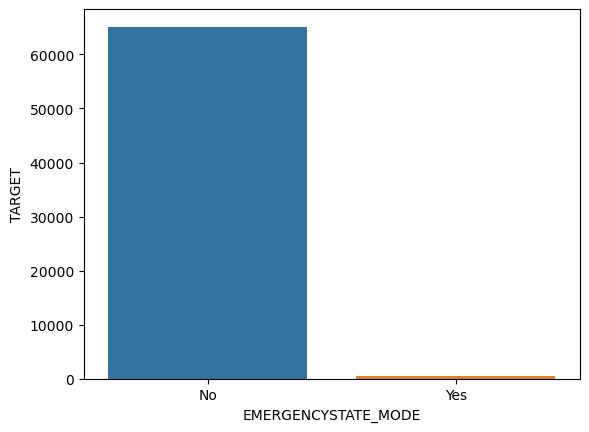

In [69]:
for i in New_Application_data.select_dtypes(exclude = [float,int]).columns:
    data_imbalance = New_Application_data.groupby(i)['TARGET'].count().reset_index()
    sns.barplot(x =i ,y = 'TARGET',data = data_imbalance)
    plt.show()

In [70]:
for i in New_Application_data.select_dtypes(exclude = [float,int]).columns:
    data_aggregation = New_Application_data.groupby(i).agg(rows = ('TARGET','size')).reset_index()
    imbalance =(data_aggregation['rows'][0]/(data_aggregation['rows'][1]+data_aggregation['rows'][0]))*100
    imbalance1 =(data_aggregation['rows'][1]/(data_aggregation['rows'][0]+data_aggregation['rows'][1]))*100
    print('Column_Name:',i,'Parameter:',data_aggregation[i][0],'is','No Difficulty in paying',str(imbalance)+'%')
    print('Column_Name:',i,'Parameter:',data_aggregation[i][1],'is','getting late and facing difficulty',str(imbalance1)+"%")

Column_Name: NAME_CONTRACT_TYPE Parameter: Cash loans is No Difficulty in paying 88.86010757439547%
Column_Name: NAME_CONTRACT_TYPE Parameter: Revolving loans is getting late and facing difficulty 11.139892425604534%
Column_Name: CODE_GENDER Parameter: F is No Difficulty in paying 62.35600658255622%
Column_Name: CODE_GENDER Parameter: M is getting late and facing difficulty 37.643993417443774%
Column_Name: FLAG_OWN_CAR Parameter: N is No Difficulty in paying 63.01330204635146%
Column_Name: FLAG_OWN_CAR Parameter: Y is getting late and facing difficulty 36.98669795364854%
Column_Name: FLAG_OWN_REALTY Parameter: N is No Difficulty in paying 30.658702707644487%
Column_Name: FLAG_OWN_REALTY Parameter: Y is getting late and facing difficulty 69.3412972923555%
Column_Name: NAME_TYPE_SUITE Parameter: Children is No Difficulty in paying 7.555993108540488%
Column_Name: NAME_TYPE_SUITE Parameter: Family is getting late and facing difficulty 92.44400689145952%
Column_Name: NAME_INCOME_TYPE Parame

In [71]:
data_aggregation = New_Application_data.groupby('TARGET')[i].count().reset_index()

In [72]:
New_Application_data.columns

Index(['LIVE_REGION_NOT_WORK_REGION', 'COMMONAREA_AVG', 'LIVINGAREA_MODE',
       'APARTMENTS_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LANDAREA_MODE',
       'LIVINGAREA_AVG', 'TARGET', 'ENTRANCES_MEDI', 'CNT_FAM_MEMBERS',
       'YEARS_BUILD_MEDI', 'CNT_CHILDREN', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MEDI',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'YEARS_BUILD_MODE', 'ELEVATORS_MODE',
       'AMT_ANNUITY', 'FLOORSMIN_MEDI', 'TOTALAREA_MODE', 'YEARS_BUILD_AVG',
       'REGION_RATING_CLIENT', 'ENTRANCES_AVG', 'AMT_CREDIT',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'LIVE_CITY_NOT_WORK_CITY',
       'NONLIVINGAREA_MODE', 'NONLIVINGAREA_AVG', 'COMMONAREA_MODE',
       'YEARS_BEGINEXPLUATATION_AVG', 'REGION_RATING_CLIENT_W_CITY',
       'ENTRANCES_MODE', 'BASEMENTAREA_AVG', 'AMT_GOODS_PRICE',
       'BASEMENTAREA_MODE', 'FLOORSMAX_MEDI', 'LIVINGAREA_MEDI',
       'LANDAREA_MEDI', 'DAYS_BIRTH', 'LIVINGAPARTMENTS_AVG',
       'BASEMENTAREA_MEDI', 'LANDAREA_AVG', 'FLOORSMIN_

### According to Each Parametet it is Imbalanced Data Above result shows each %
### Target 0 Customers is 92.43% is there in Total Data  
### Target 1 Customers is 7.57% is there in Total Data.
### Less Customers are facing Difficulty yo pay or getting alte to Pay

## Previous Data

In [73]:
previous_application_data.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [74]:
New_Data_Taget = New_Application_data[["SK_ID_CURR",'TARGET']]

In [75]:
previous_application_data.shape

(638335, 37)

In [76]:
previous_application_data = pd.merge(previous_application_data,New_Data_Taget, on ="SK_ID_CURR",how = 'left' )

In [77]:
previous_application_data.shape

(638335, 38)

In [78]:
columns = set(previous_application_data.select_dtypes(exclude = [float,int]).columns)-set(['FLAG_LAST_APPL_PER_CONTRACT','NAME_CONTRACT_STATUS'])

In [79]:
previous_application_data.select_dtypes(exclude = [float,int]).columns

Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [80]:
for i in columns:
    data_aggregation = previous_application_data.groupby(i).agg(rows = ('TARGET','size')).reset_index()
    imbalance =(data_aggregation['rows'][0]/(data_aggregation['rows'][1]+data_aggregation['rows'][0]))*100
    imbalance1 =(data_aggregation['rows'][1]/(data_aggregation['rows'][0]+data_aggregation['rows'][1]))*100
    print('Column_Name:',i,'Parameter:',data_aggregation[i][0],'is','No Difficulty in paying',str(imbalance)+'%')
    print('Column_Name:',i,'Parameter:',data_aggregation[i][1],'is','getting late and facing difficulty',str(imbalance1)+"%")

Column_Name: NAME_CONTRACT_TYPE Parameter: Cash loans is No Difficulty in paying 32.40165648638474%
Column_Name: NAME_CONTRACT_TYPE Parameter: Consumer loans is getting late and facing difficulty 67.59834351361526%
Column_Name: CHANNEL_TYPE Parameter: AP+ (Cash loan) is No Difficulty in paying 99.88377241531991%
Column_Name: CHANNEL_TYPE Parameter: Car dealer is getting late and facing difficulty 0.11622758468009742%
Column_Name: NAME_SELLER_INDUSTRY Parameter: Auto technology is No Difficulty in paying 13.82900086238758%
Column_Name: NAME_SELLER_INDUSTRY Parameter: Clothing is getting late and facing difficulty 86.17099913761241%
Column_Name: PRODUCT_COMBINATION Parameter: Card Street is No Difficulty in paying 47.401899807757545%
Column_Name: PRODUCT_COMBINATION Parameter: Card X-Sell is getting late and facing difficulty 52.59810019224245%
Column_Name: NAME_GOODS_CATEGORY Parameter: Additional Service is No Difficulty in paying 0.05866613247098888%
Column_Name: NAME_GOODS_CATEGORY P

In [81]:
data_aggregation = previous_application_data.groupby('TARGET').agg(rows = ('TARGET','size')).reset_index()
imbalance =(data_aggregation['rows'][0]/(data_aggregation['rows'][1]+data_aggregation['rows'][0]))*100
imbalance1 =(data_aggregation['rows'][1]/(data_aggregation['rows'][1]+data_aggregation['rows'][0]))*100

In [82]:
print('Target 0 :',imbalance)
print('Target 1 :',imbalance1)
data_aggregation

Target 0 : 92.91000553082777
Target 1 : 7.08999446917222


,TARGET,rows
0,0.0,105831
1,1.0,8076


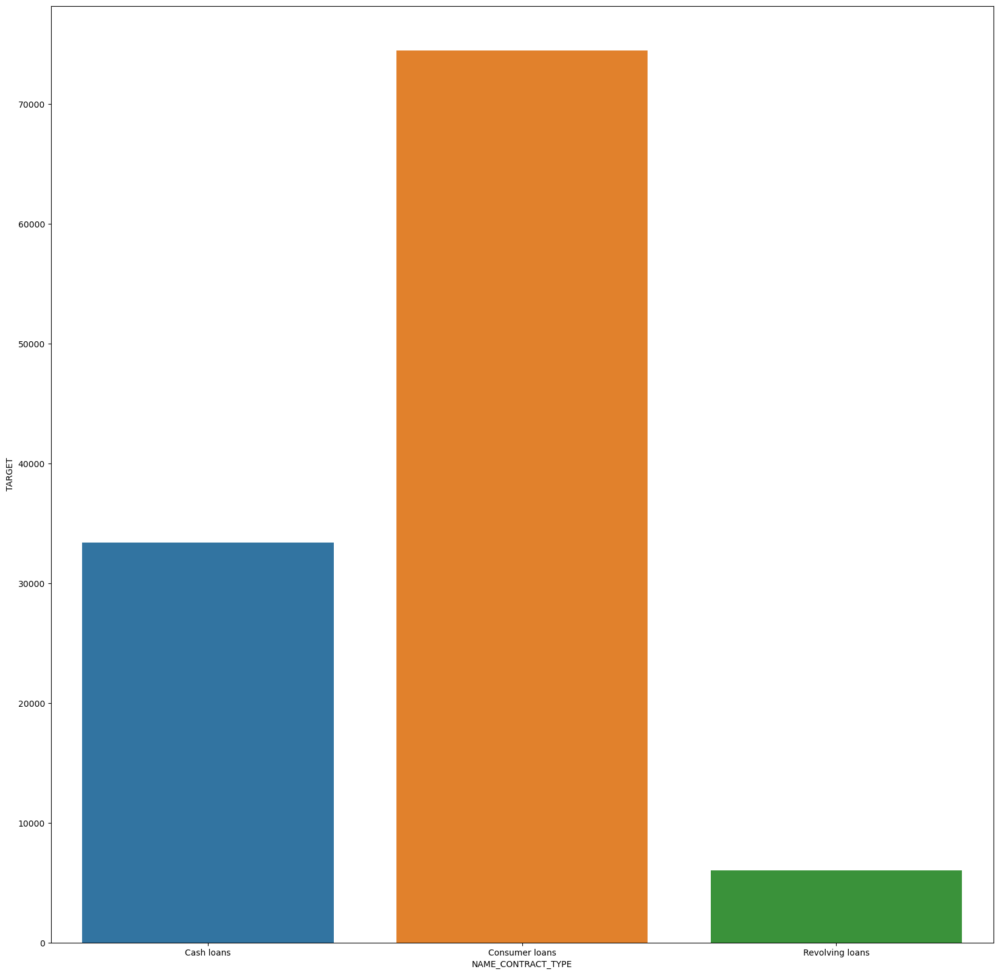

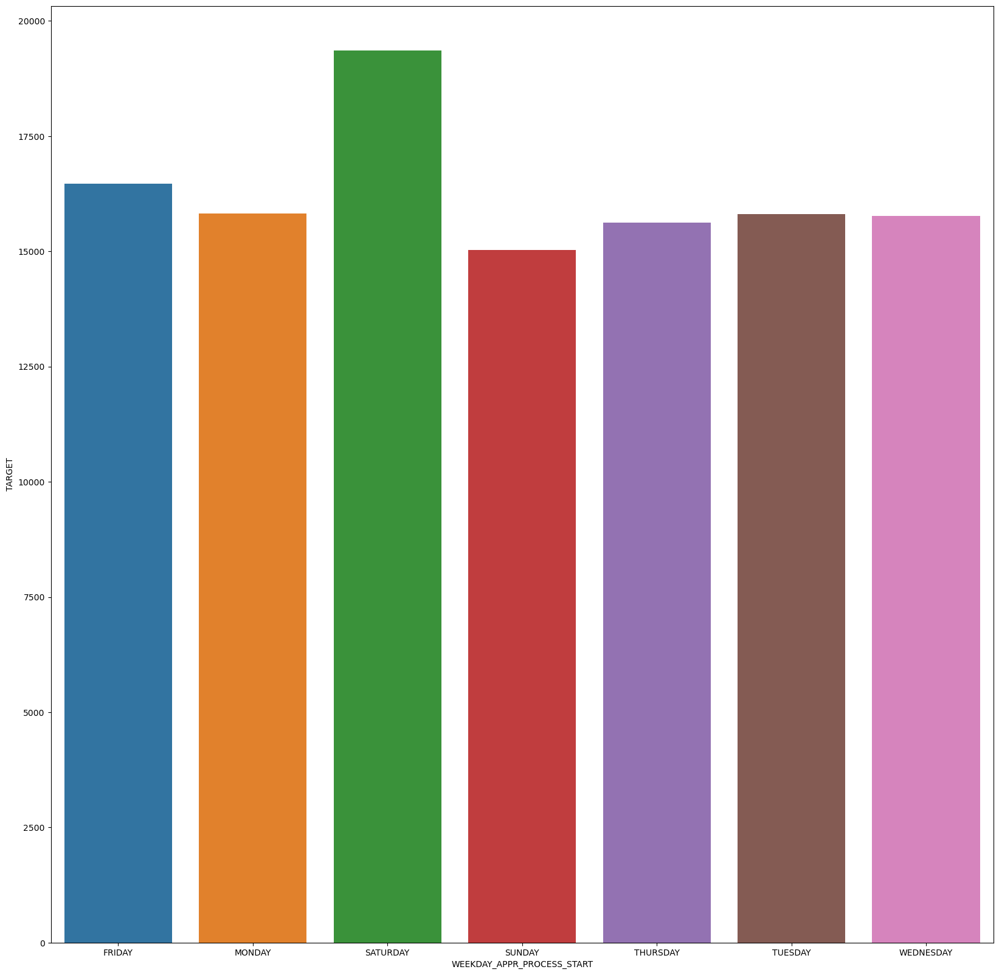

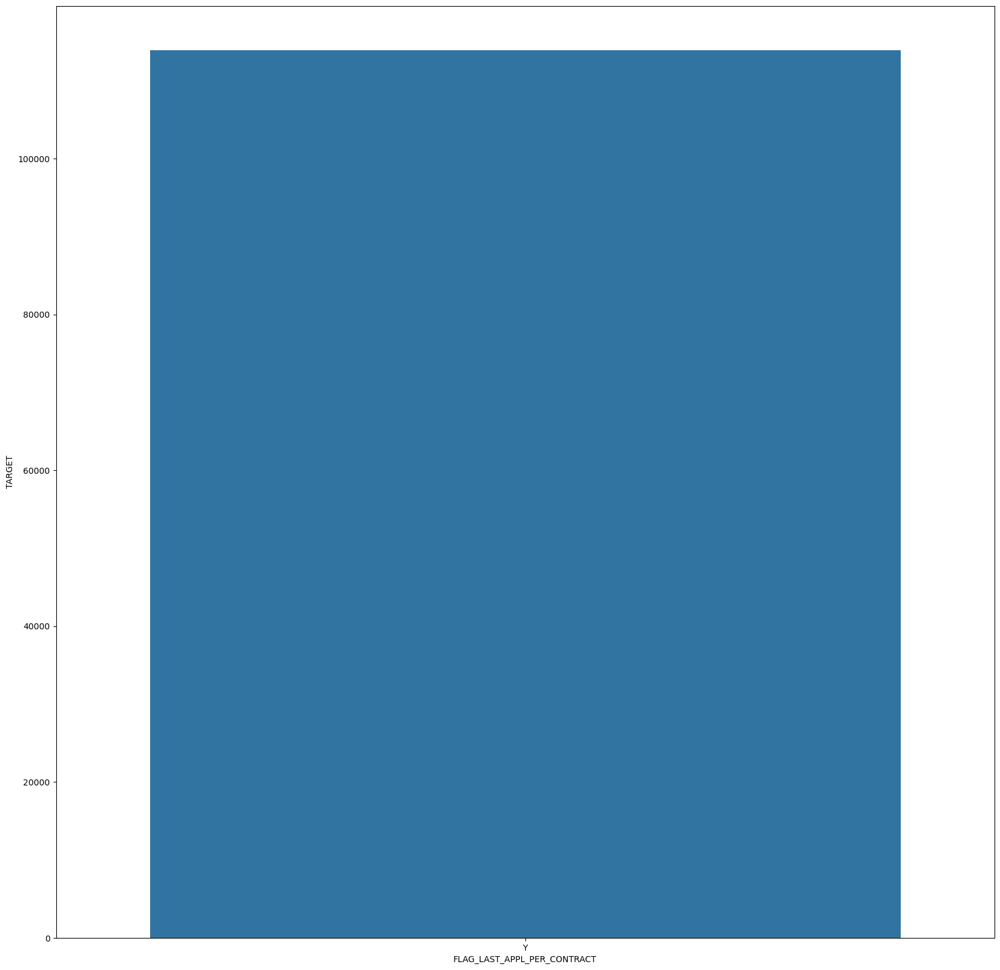

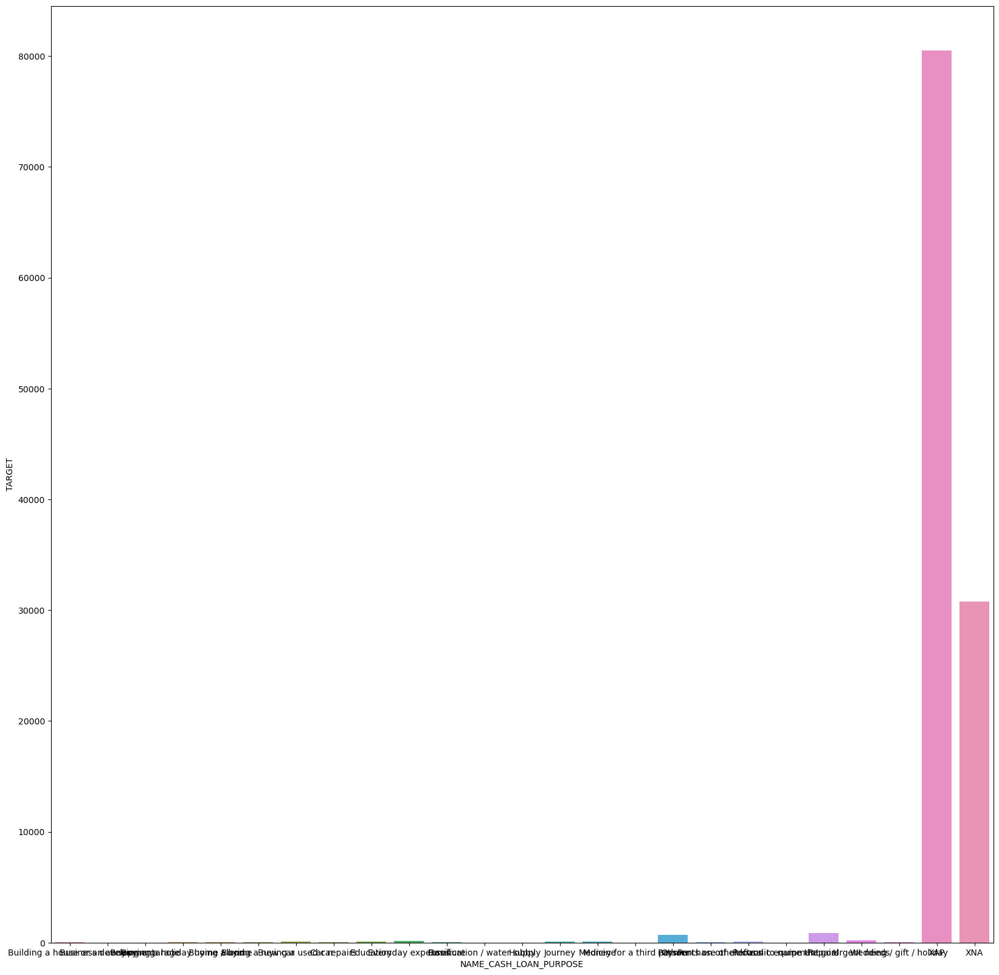

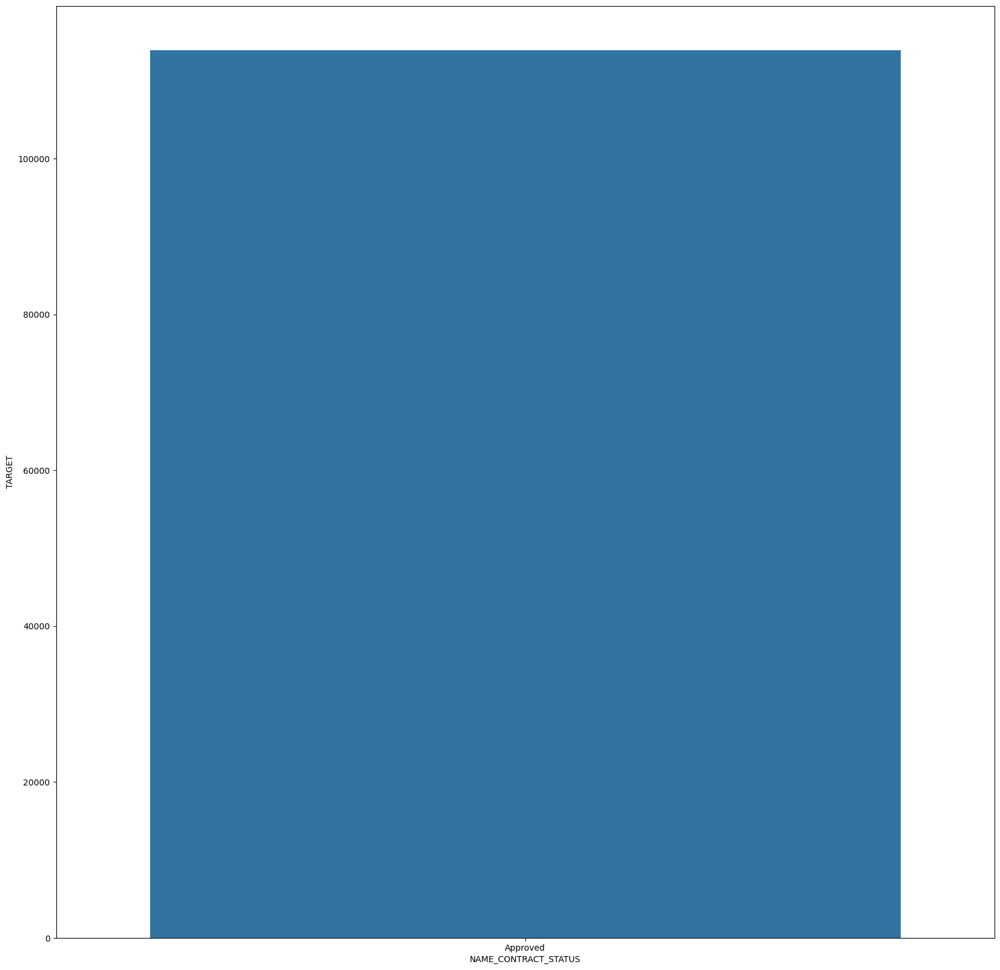

...

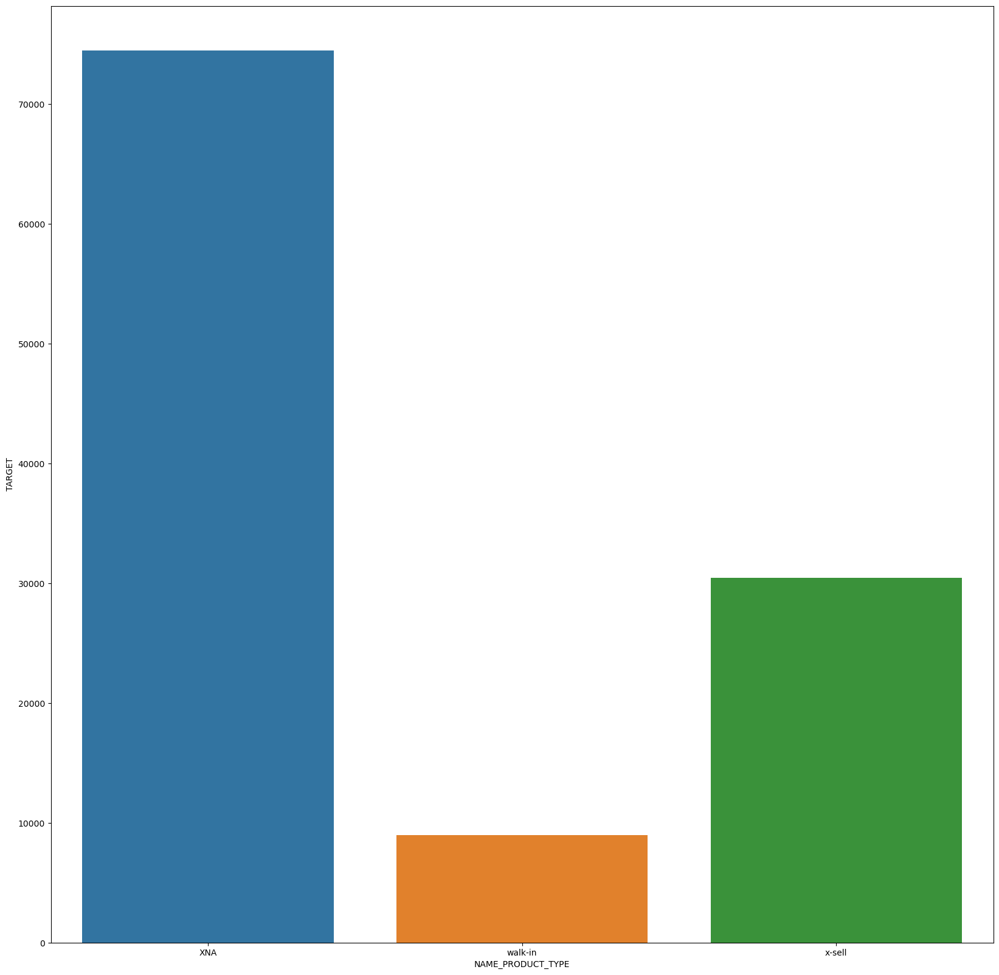

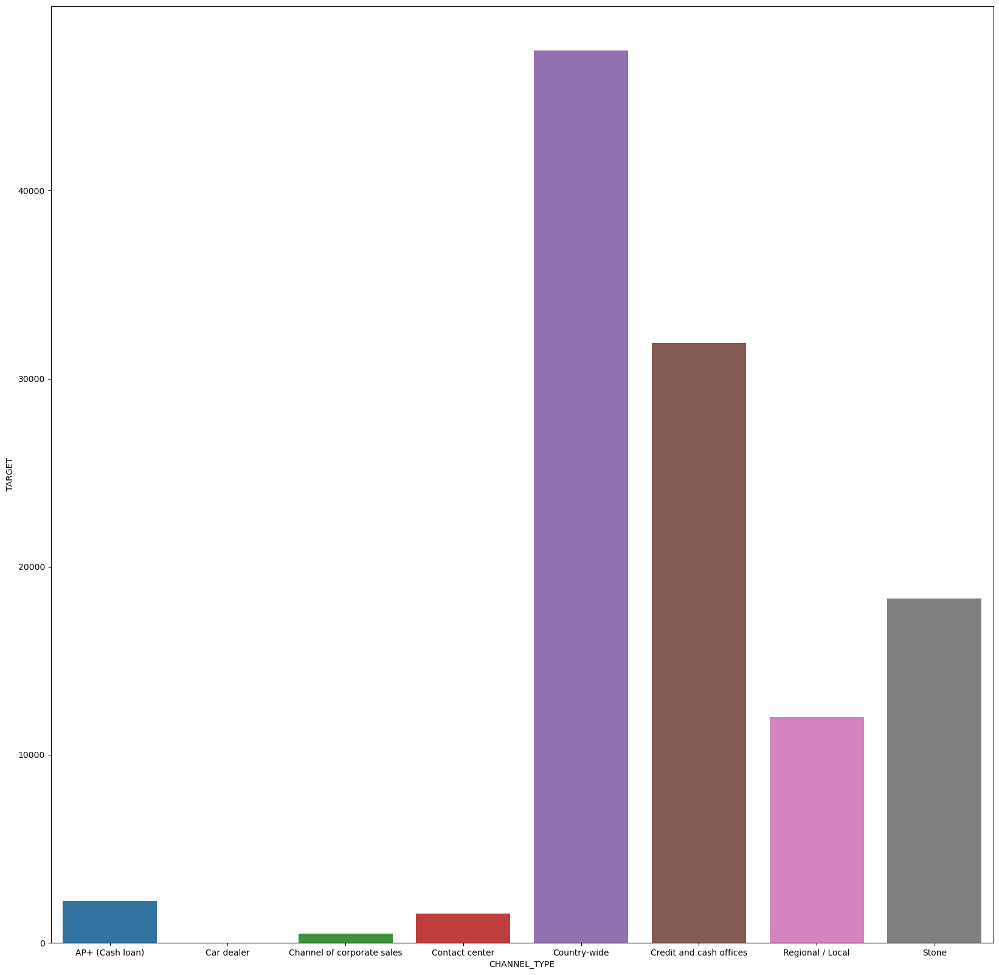

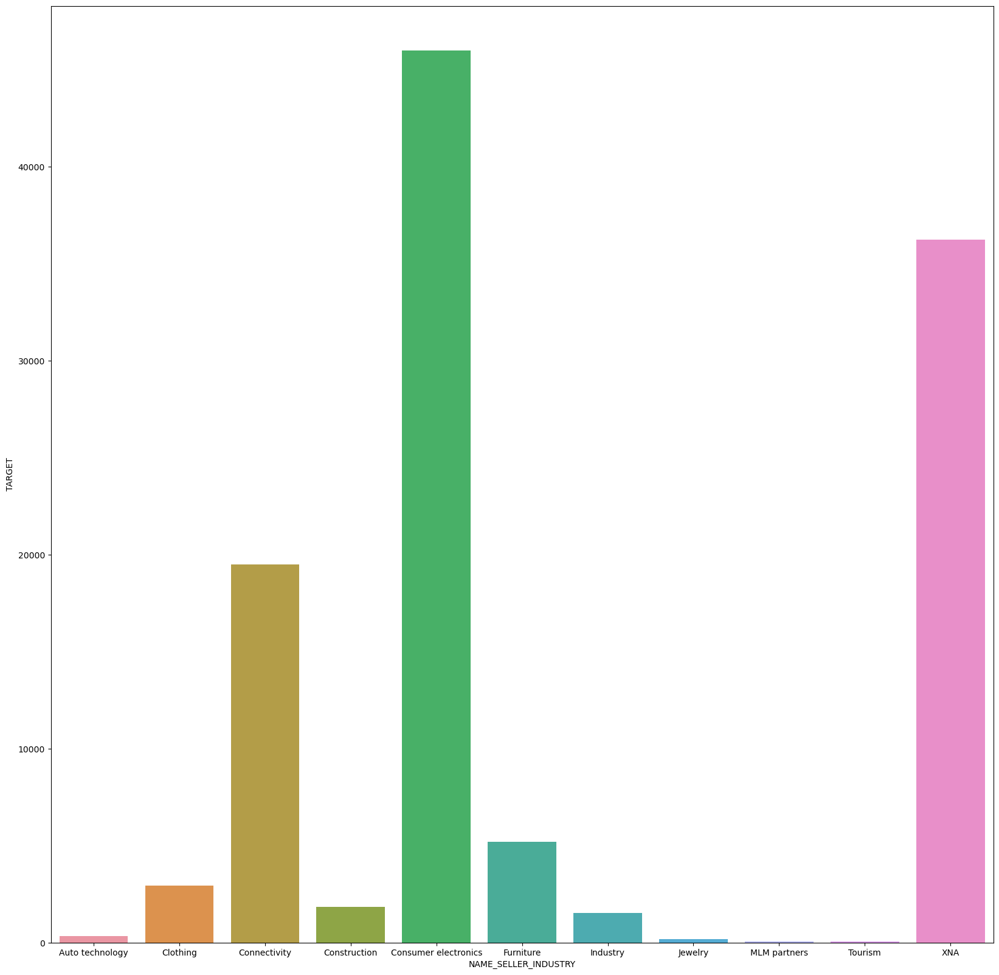

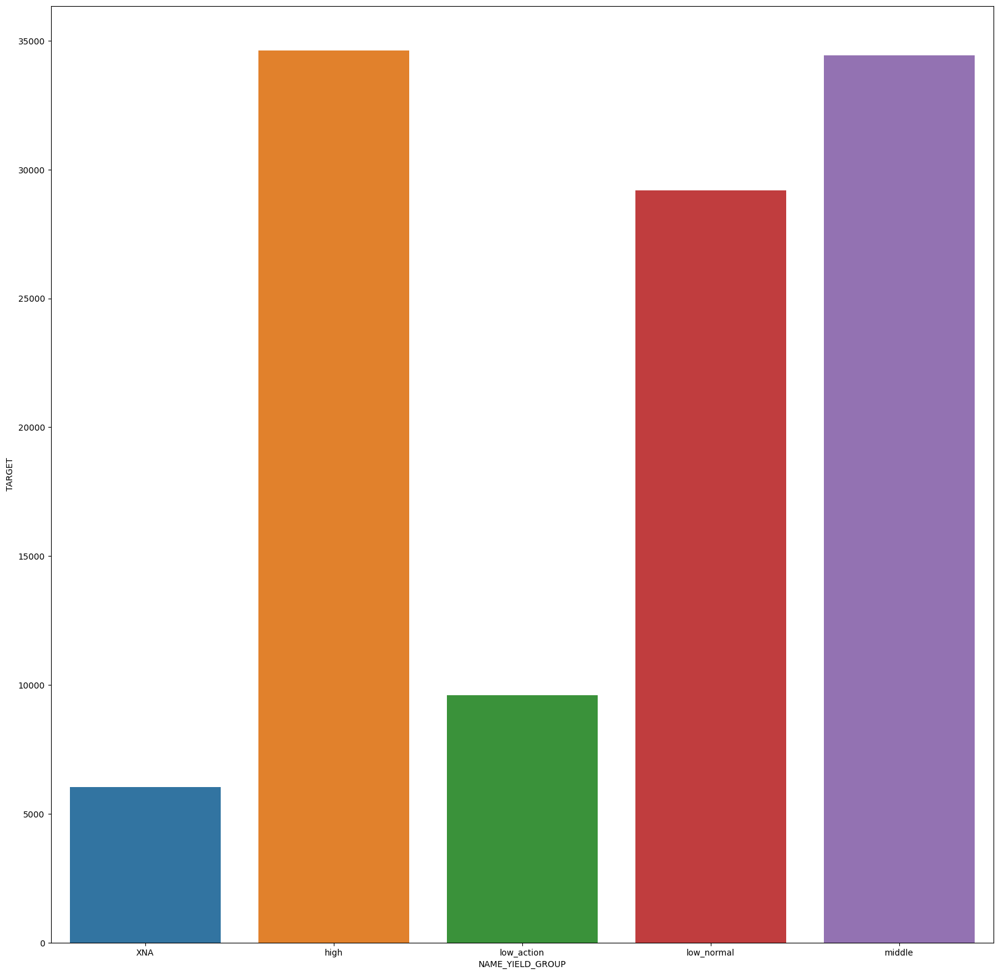

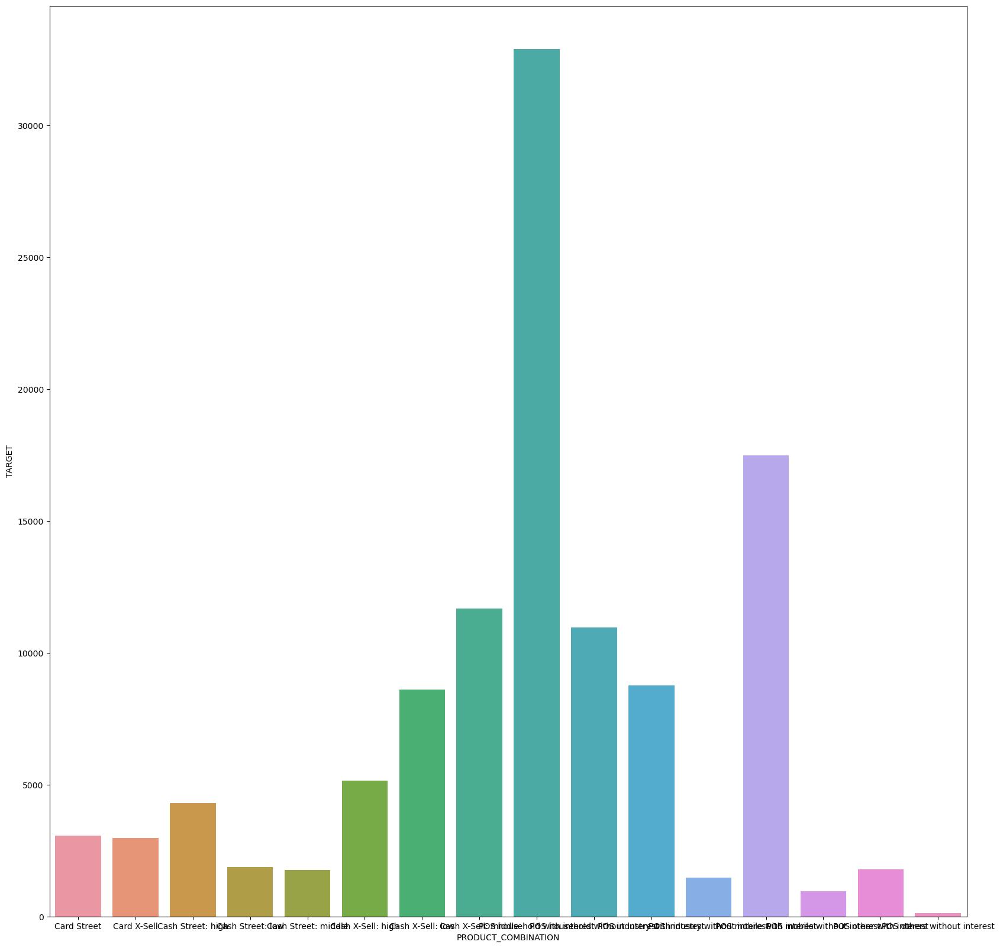

In [83]:
for i in previous_application_data.select_dtypes(exclude = [float,int]).columns:
    data_imbalance = previous_application_data.groupby(i)['TARGET'].count().reset_index()
    plt.figure(figsize = (20,20))
    sns.barplot(x =i ,y = 'TARGET',data = data_imbalance)
    plt.show()

### According to Each Parametet it is Imbalanced Data Above result shows each %
### Target 0 Customers is 92.91% is there in Total Data  
### Target 1 Customers is 7.09% is there in Total Data.
### Less Customers are facing Difficulty yo pay or getting late to Pay

## Step-4 Univariate,Segmented Univariate, Bivariate Analysis

### Univariate Analysis

In [84]:
previous_application_data.drop(['TARGET'],axis = 1,inplace = True)

In [85]:
Total_Data = pd.merge(New_Application_data,previous_application_data,on = "SK_ID_CURR",how = 'left')

In [86]:
Total_Data.shape

(129631, 116)

In [87]:
x = []
y = []
for i in Total_Data.columns.to_list():
    if i.endswith('_x'):x.append(i)
    if i.endswith('_y'):y.append(i)
        

In [88]:
x

['AMT_ANNUITY_x',
 'AMT_CREDIT_x',
 'AMT_GOODS_PRICE_x',
 'NAME_CONTRACT_TYPE_x',
 'NAME_TYPE_SUITE_x',
 'WEEKDAY_APPR_PROCESS_START_x']

## Box Plot

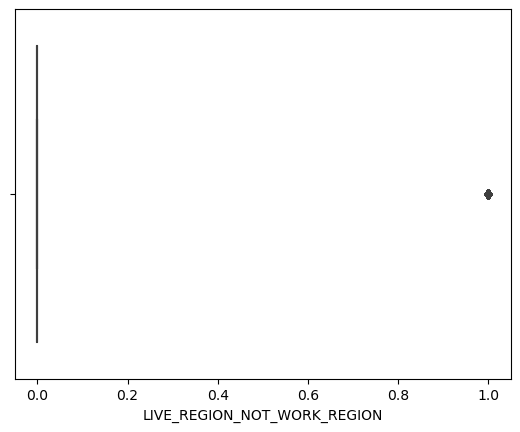

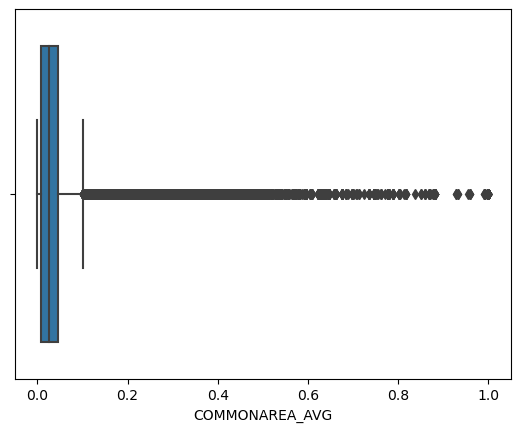

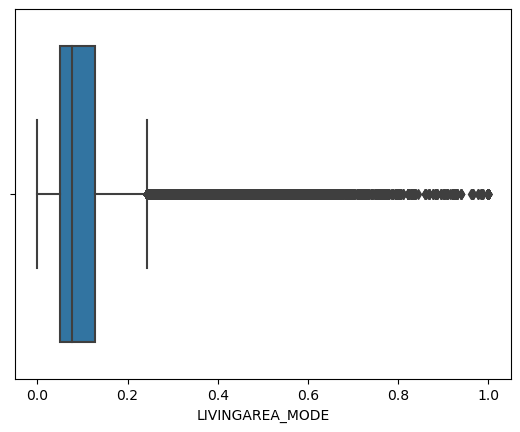

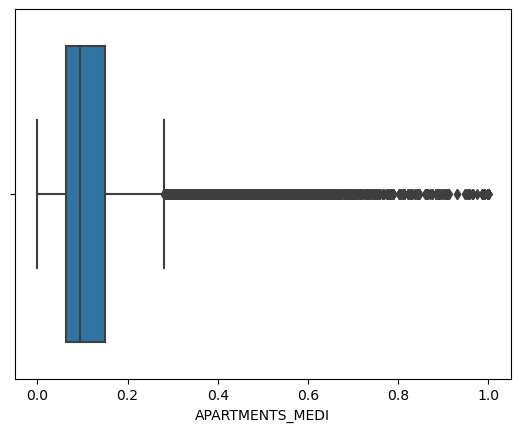

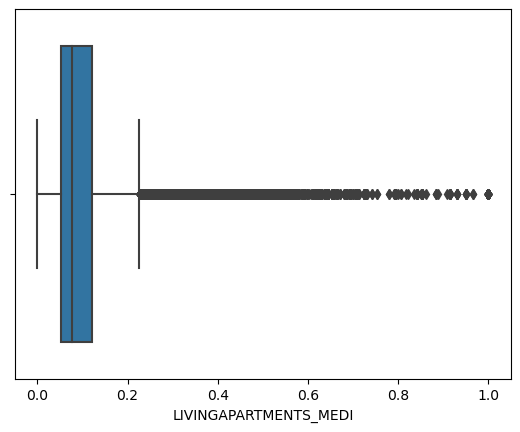

...

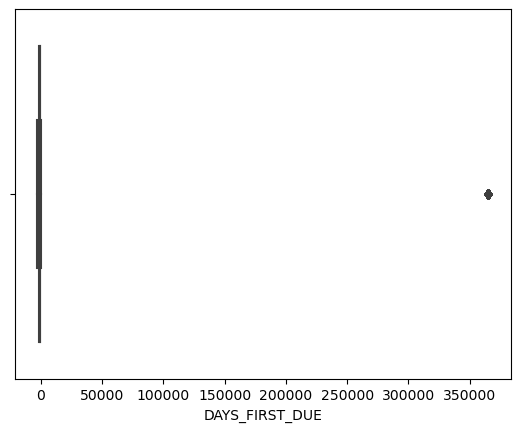

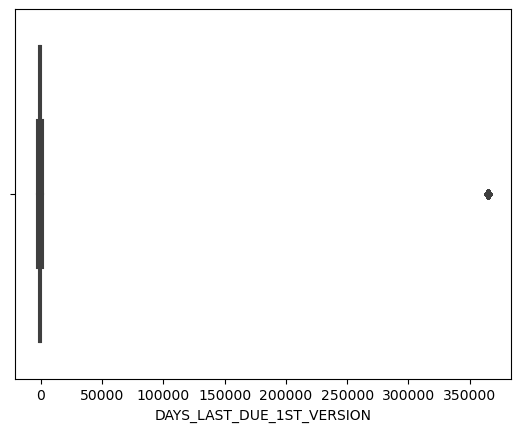

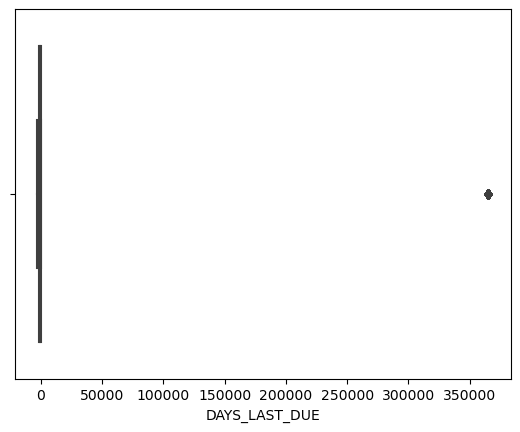

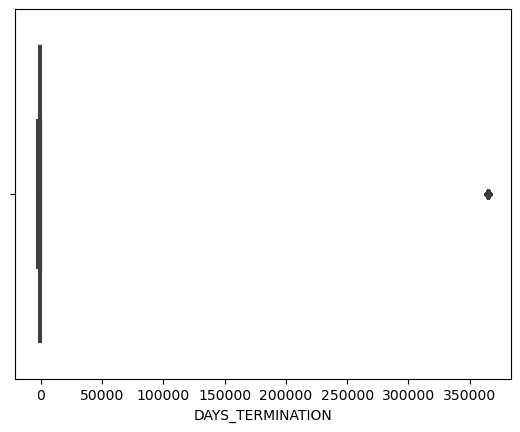

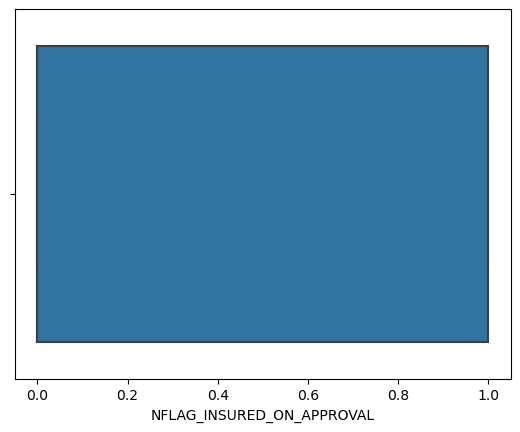

In [112]:
for i in Total_Data.select_dtypes(include = (float,int)).columns:
    sns.boxplot(x = Total_Data[i])
    plt.show()

## Count plot for Categorical Variables

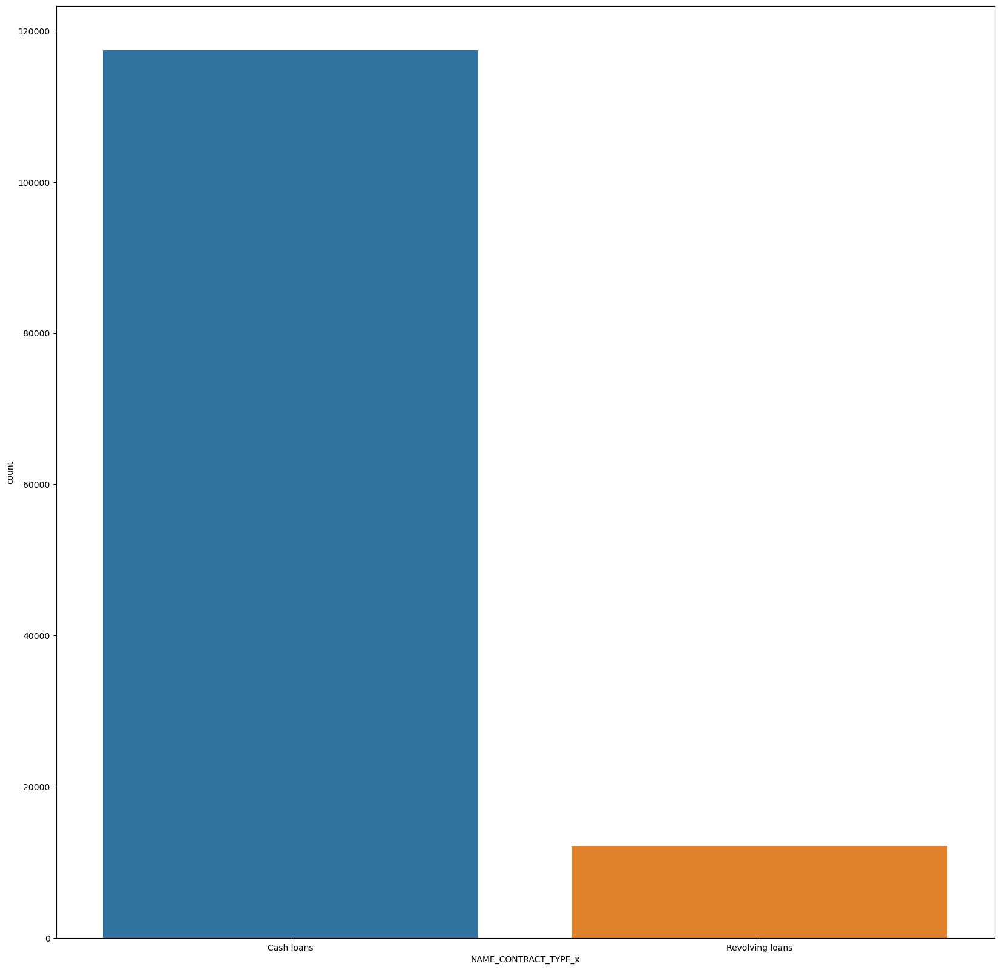

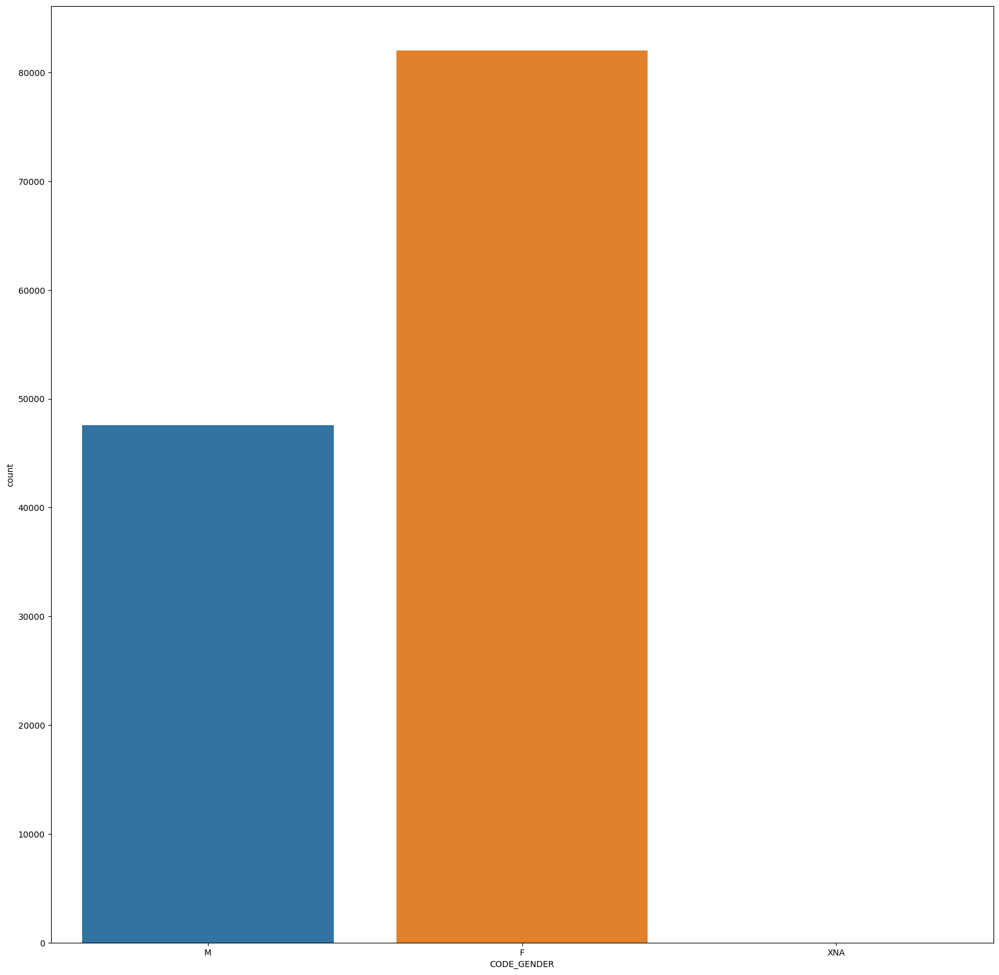

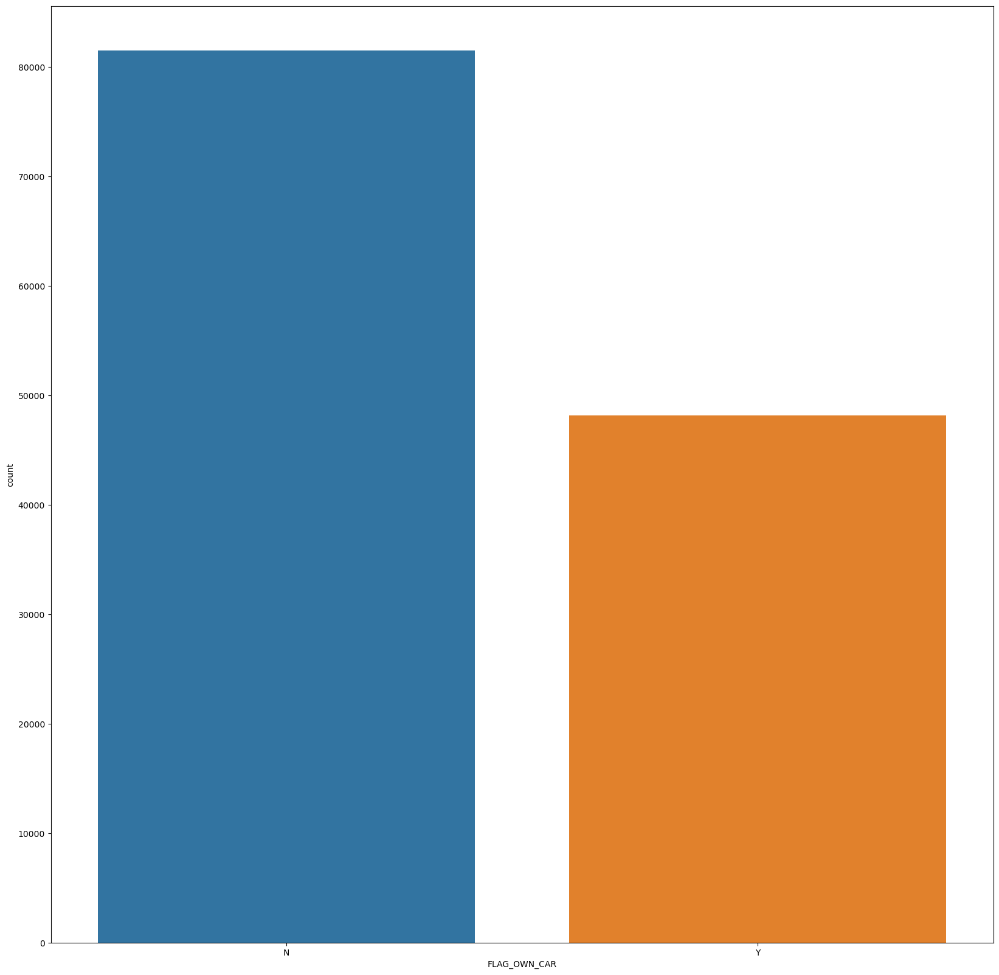

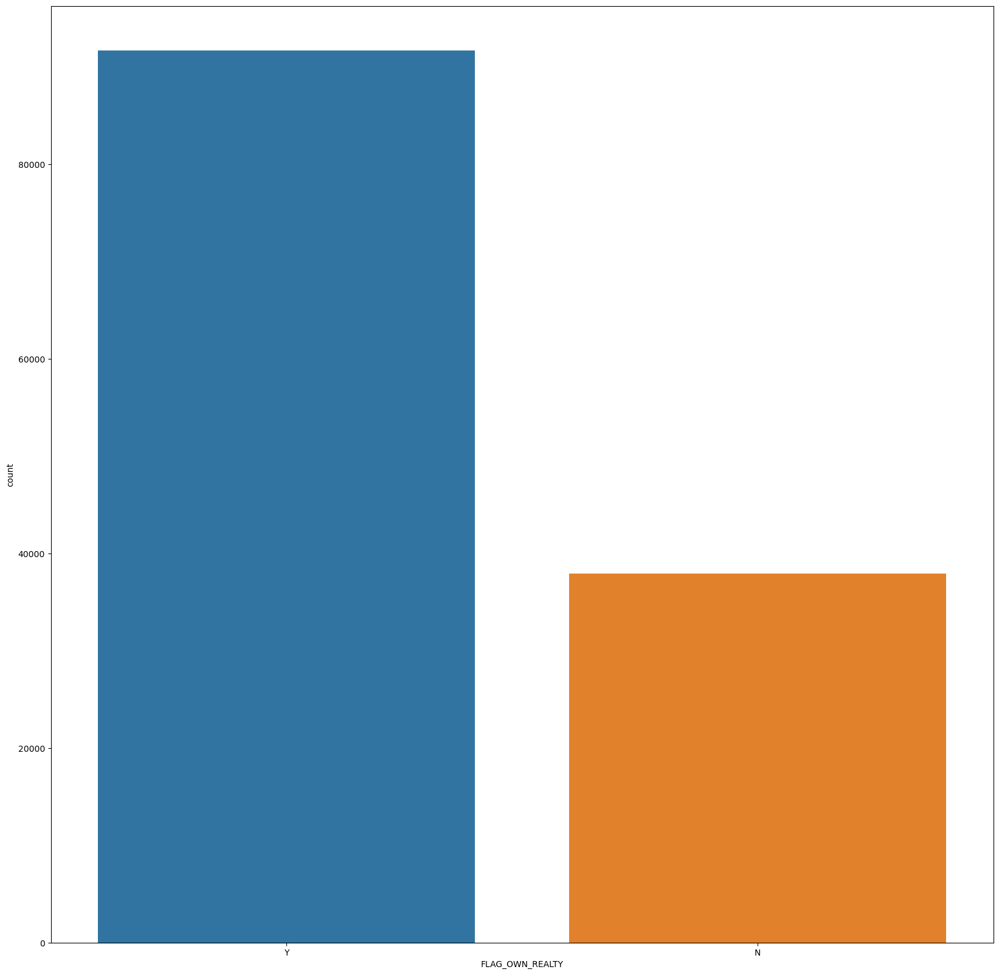

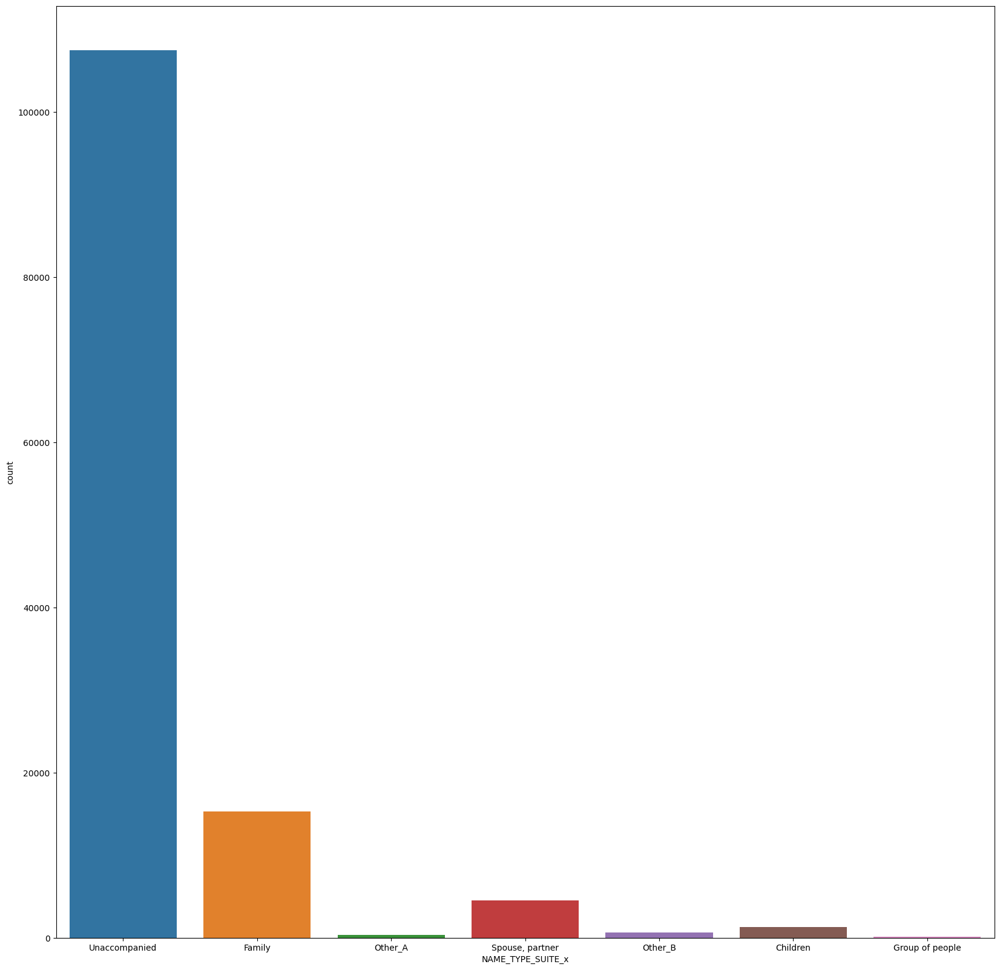

...

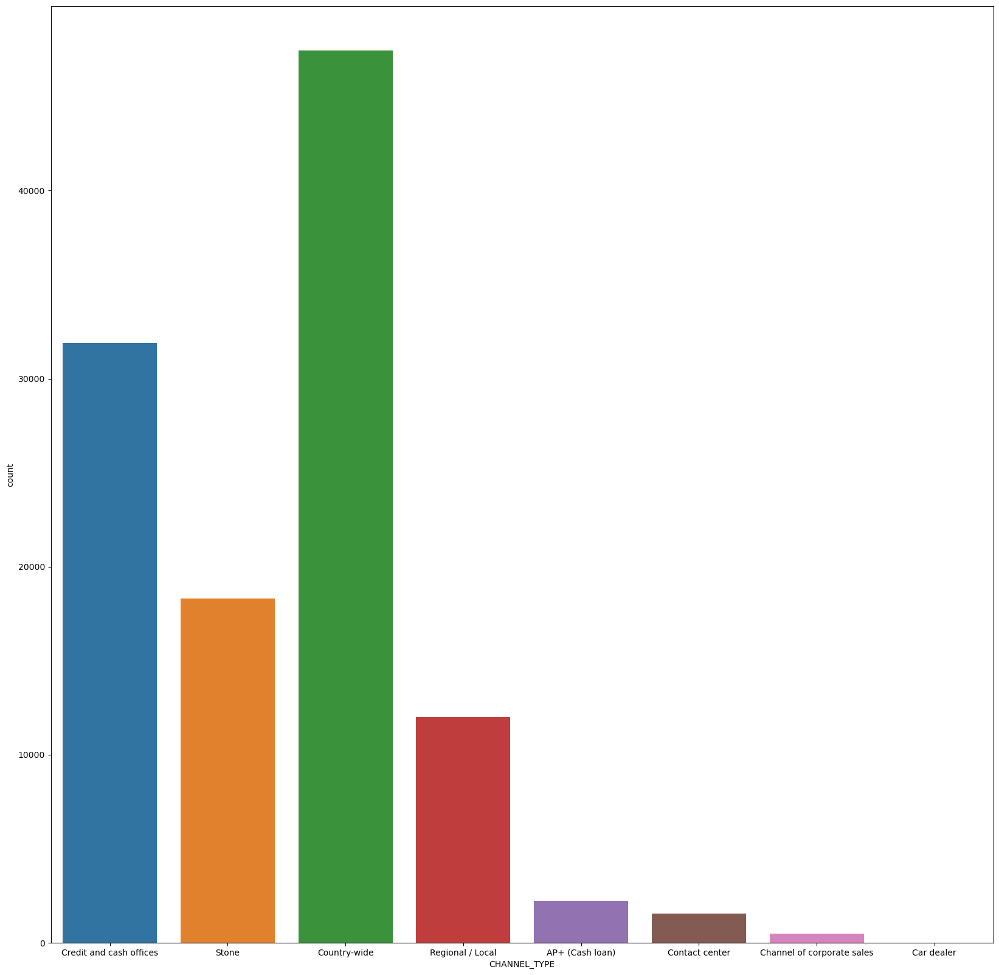

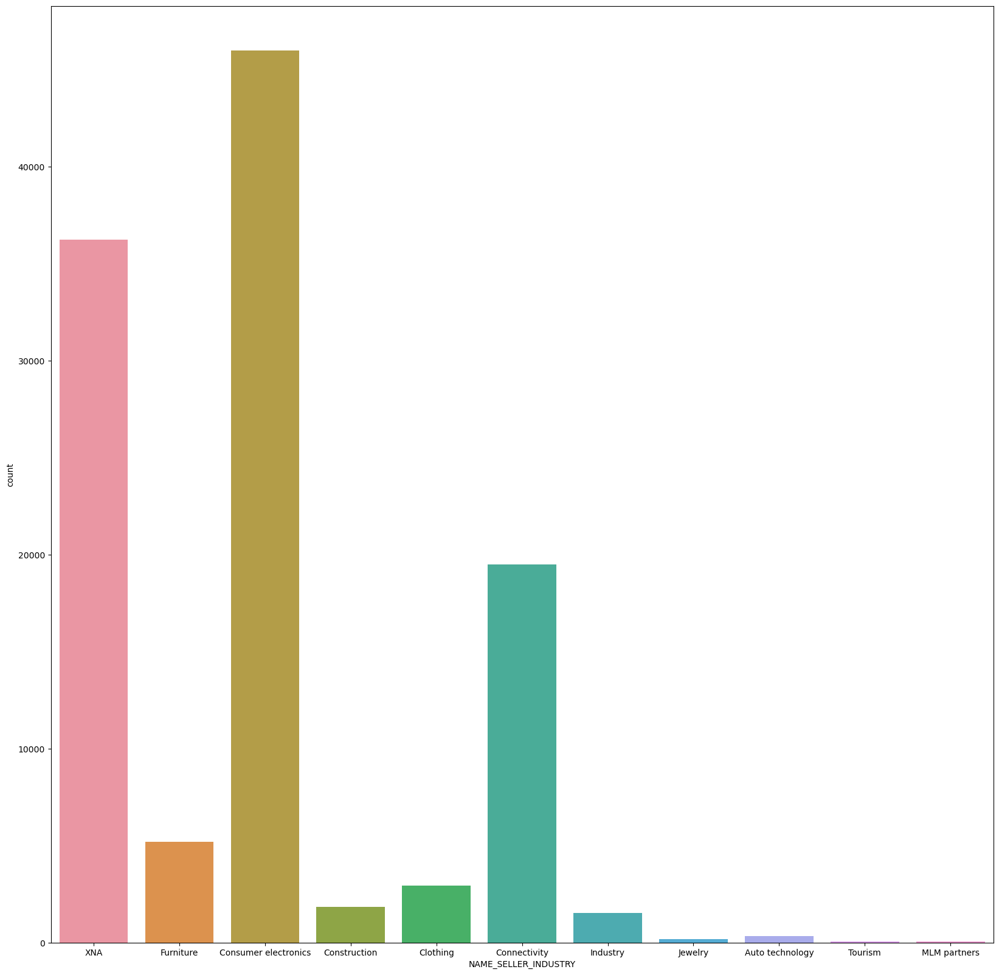

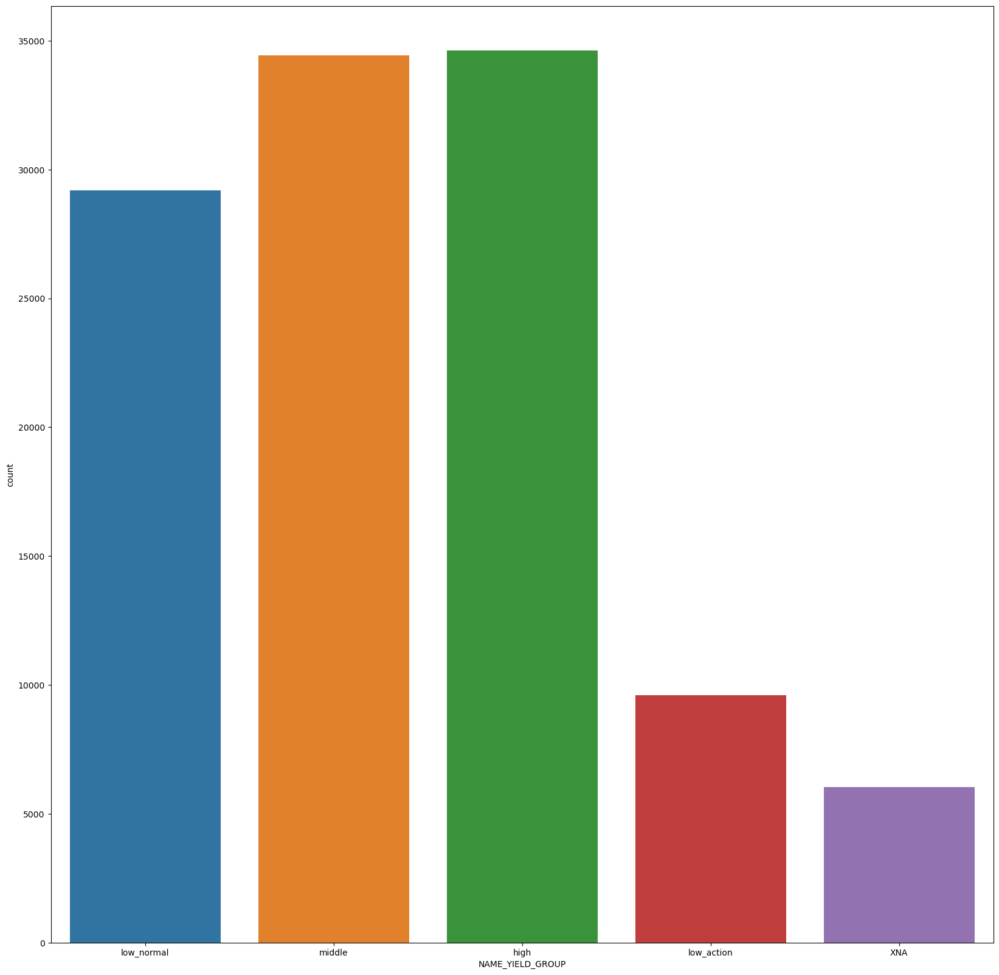

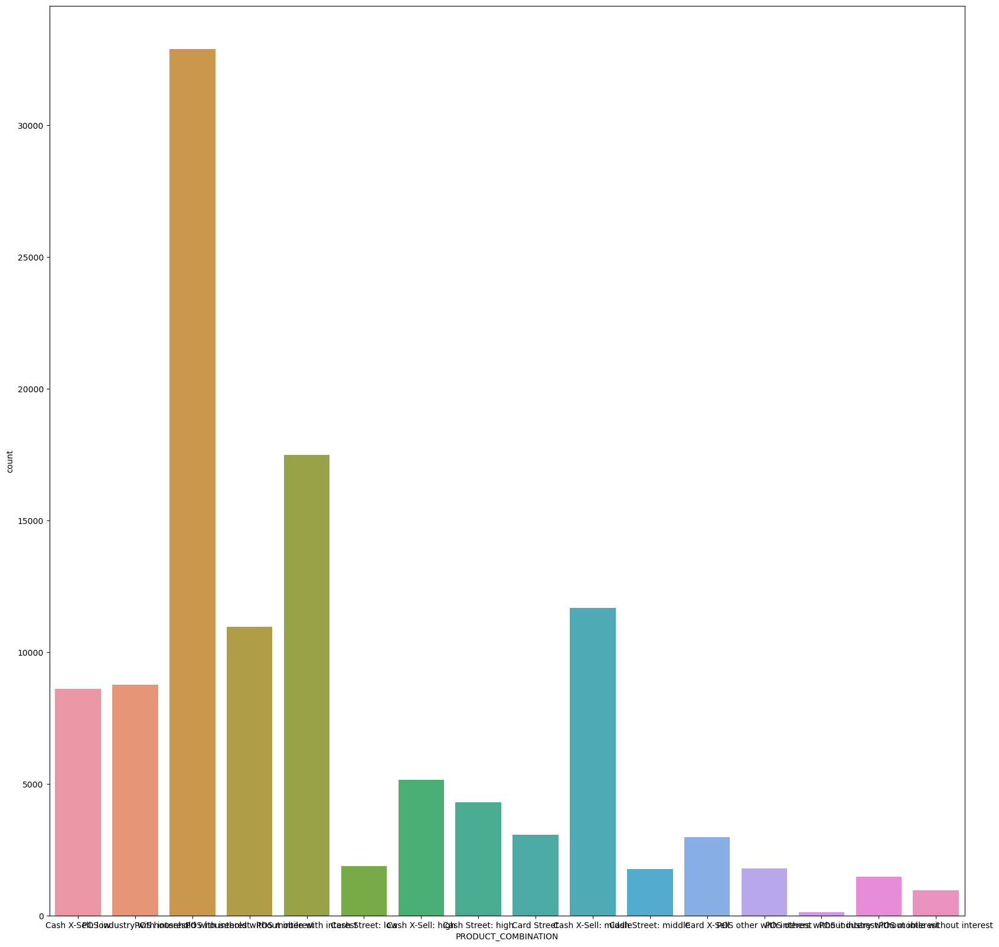

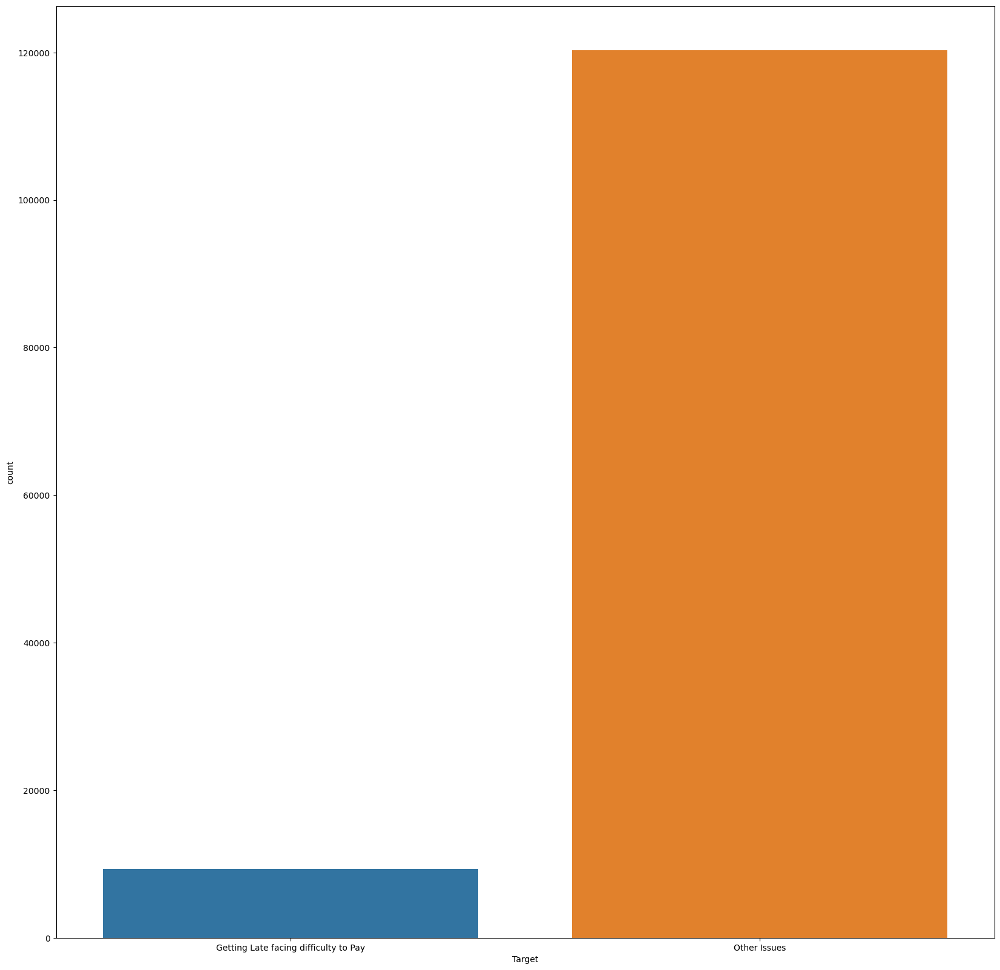

In [113]:
for i in Total_Data.select_dtypes(exclude = (float,int)).columns:
    plt.figure(figsize = (20,20))
    sns.countplot(x = Total_Data[i])
    plt.show()

## Histogram plot for finding How distribution is present

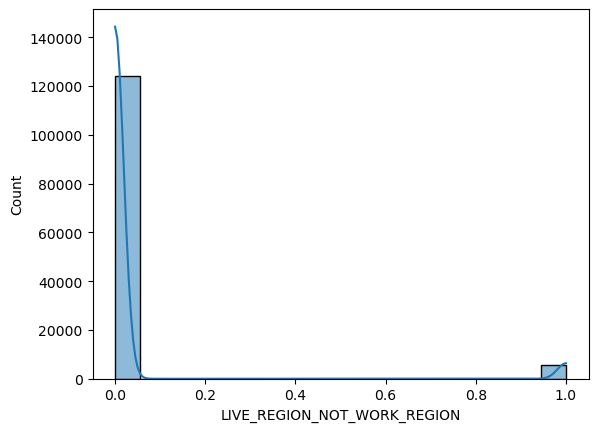

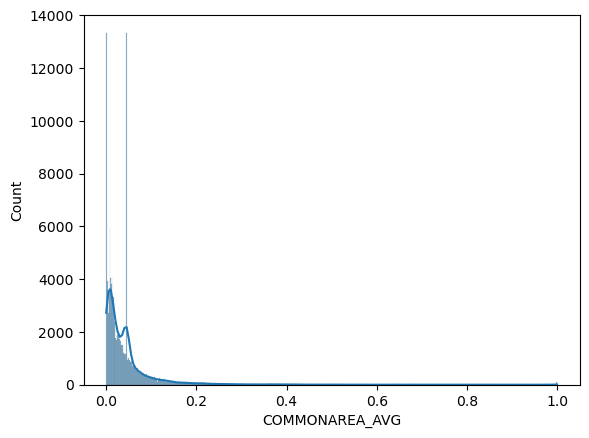

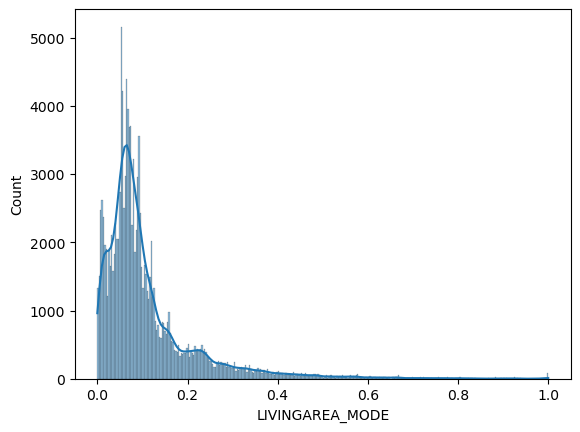

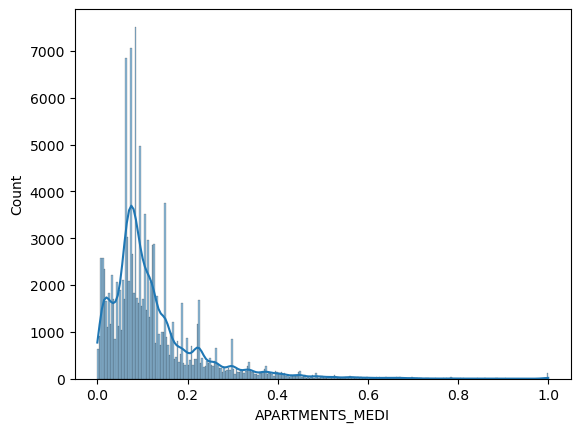

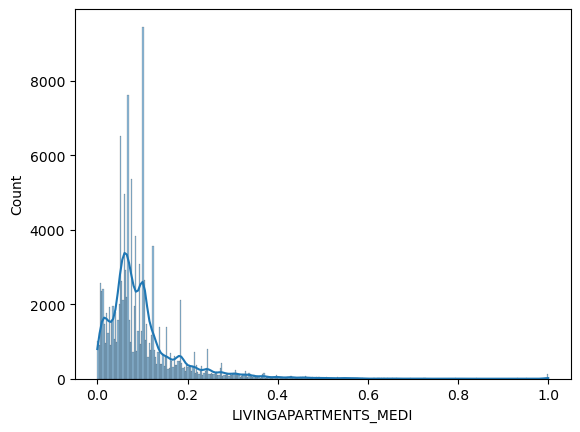

...

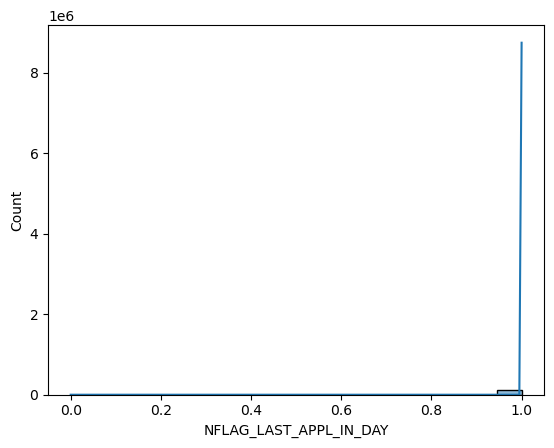

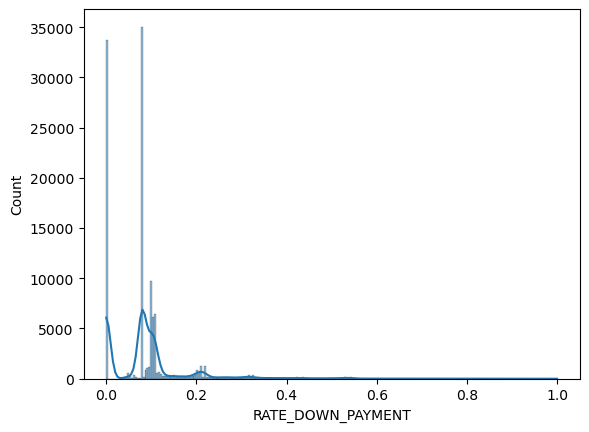

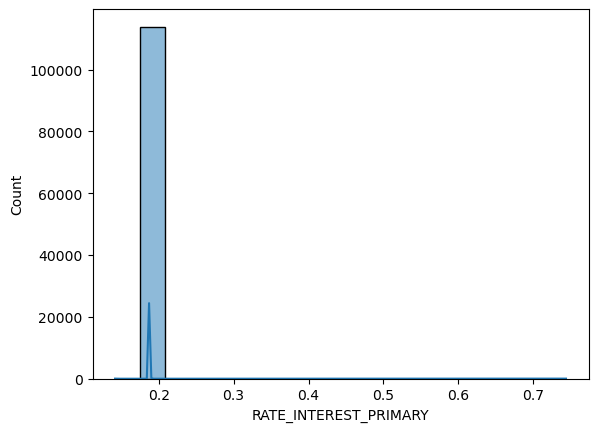

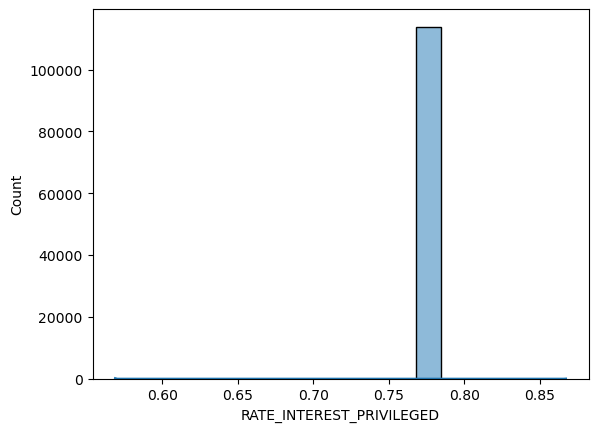

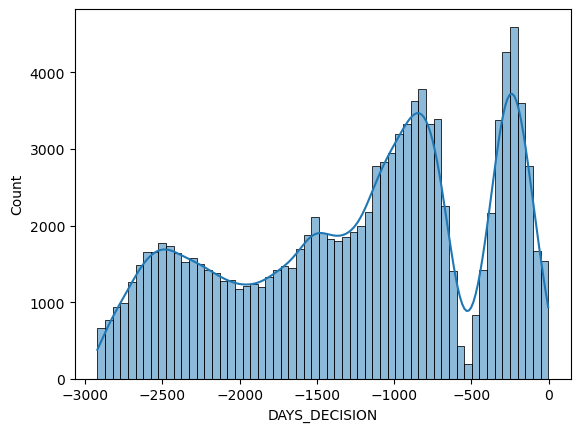

KeyboardInterrupt: 

In [114]:
for i in Total_Data.select_dtypes(include = (float,int)).columns:
    sns.histplot(x = Total_Data[i],kde = True)
    plt.show()

## Segment Univariate Analysis

<Figure size 2000x2000 with 0 Axes>

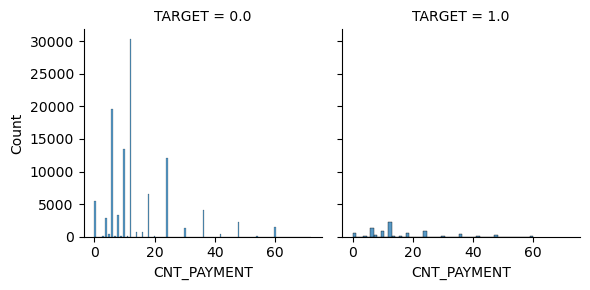

<Figure size 2000x2000 with 0 Axes>

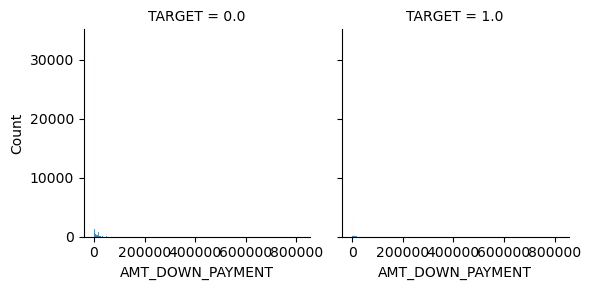

<Figure size 2000x2000 with 0 Axes>

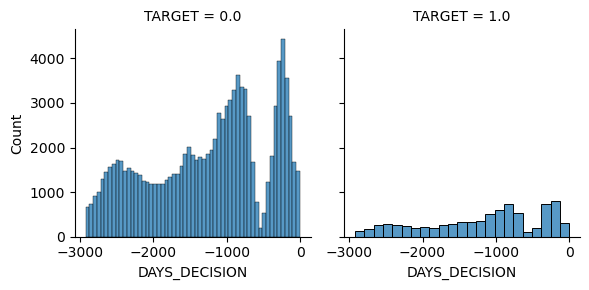

<Figure size 2000x2000 with 0 Axes>

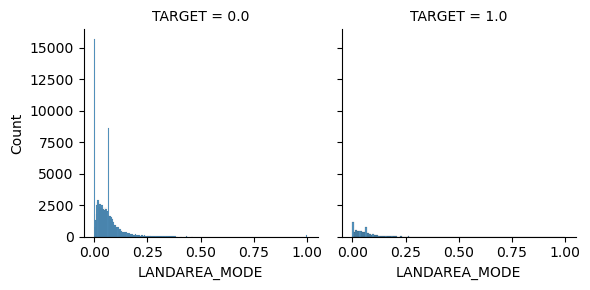

<Figure size 2000x2000 with 0 Axes>

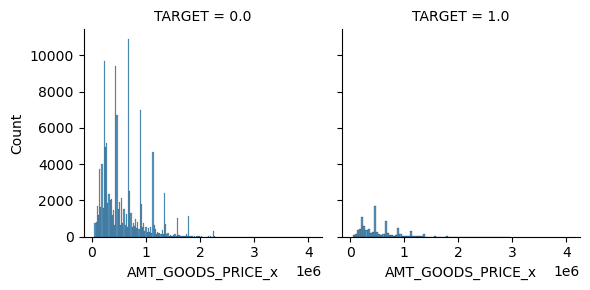

<Figure size 2000x2000 with 0 Axes>

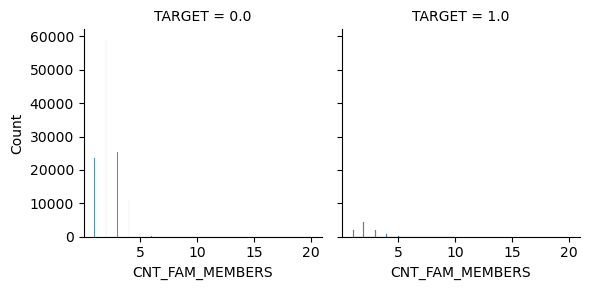

<Figure size 2000x2000 with 0 Axes>

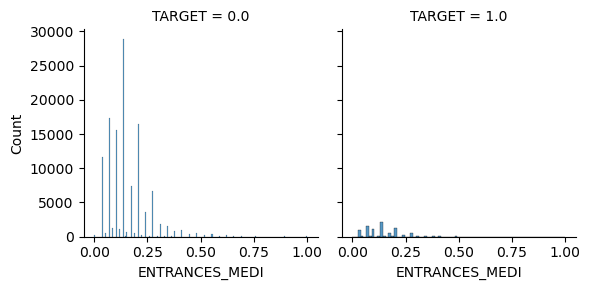

<Figure size 2000x2000 with 0 Axes>

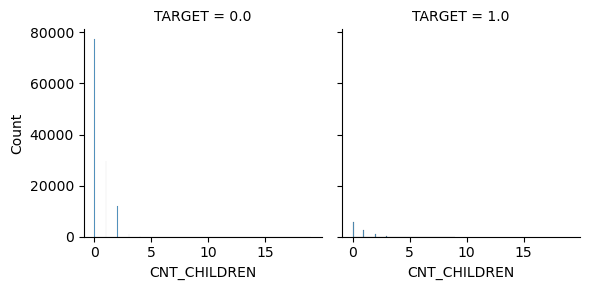

<Figure size 2000x2000 with 0 Axes>

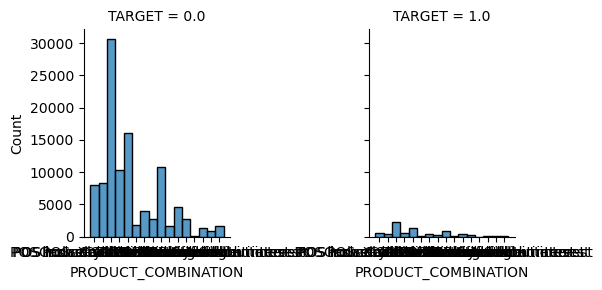

<Figure size 2000x2000 with 0 Axes>

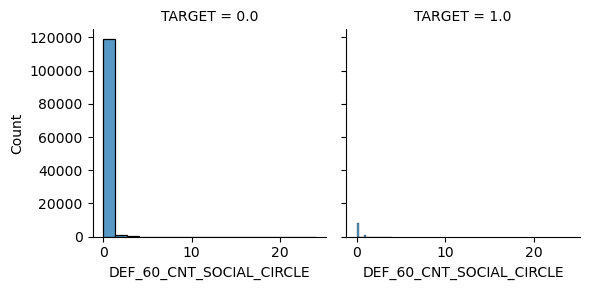

<Figure size 2000x2000 with 0 Axes>

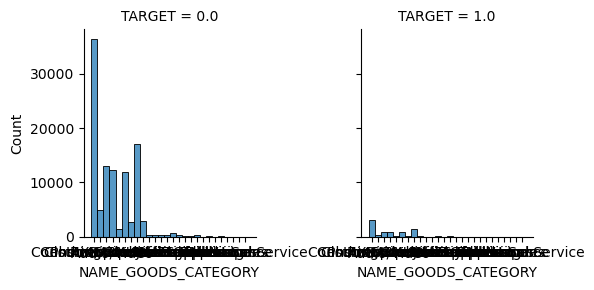

<Figure size 2000x2000 with 0 Axes>

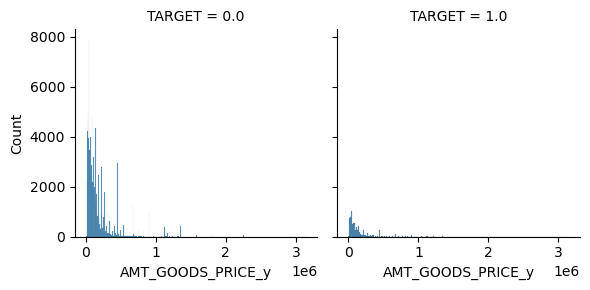

<Figure size 2000x2000 with 0 Axes>

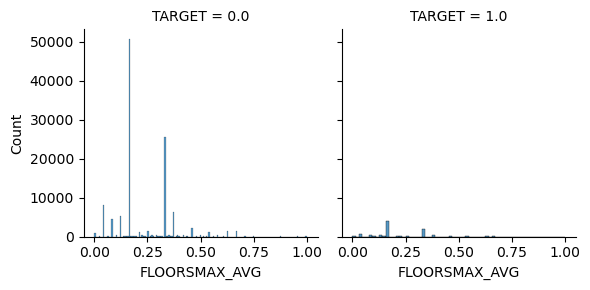

<Figure size 2000x2000 with 0 Axes>

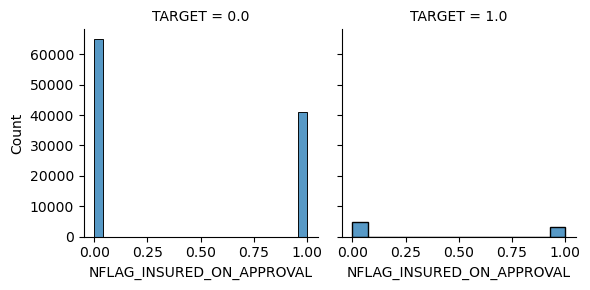

<Figure size 2000x2000 with 0 Axes>

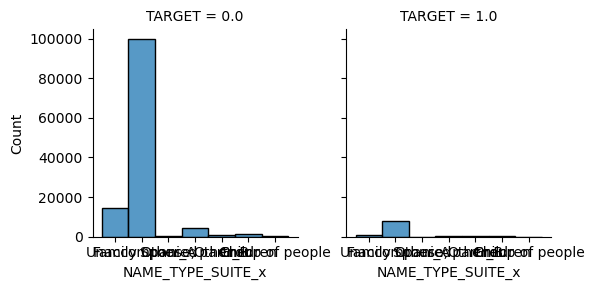

<Figure size 2000x2000 with 0 Axes>

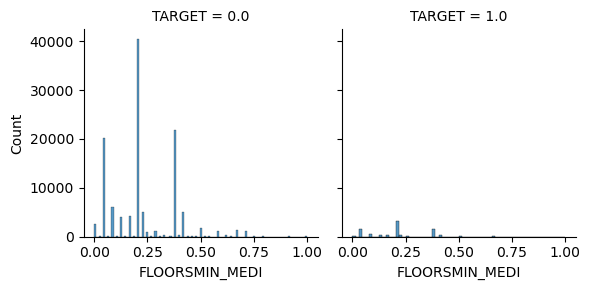

<Figure size 2000x2000 with 0 Axes>

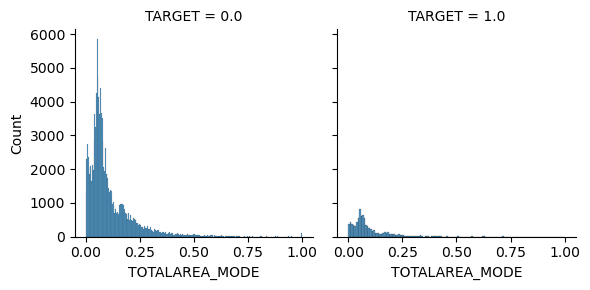

<Figure size 2000x2000 with 0 Axes>

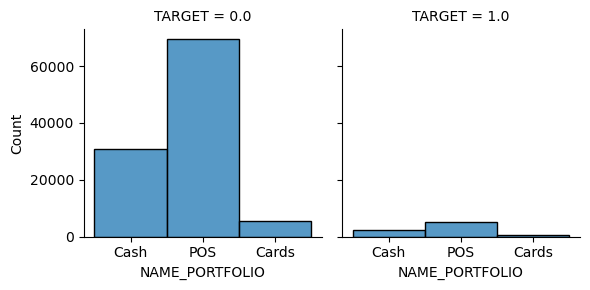

<Figure size 2000x2000 with 0 Axes>

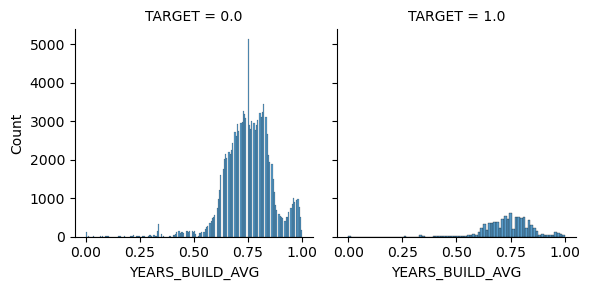

<Figure size 2000x2000 with 0 Axes>

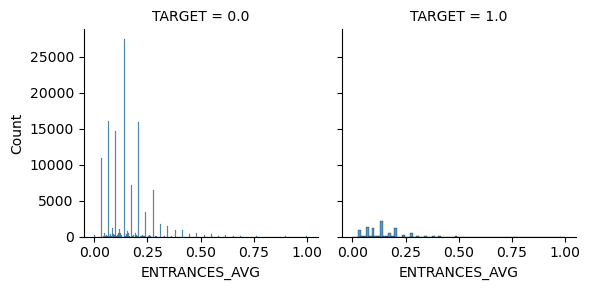

<Figure size 2000x2000 with 0 Axes>

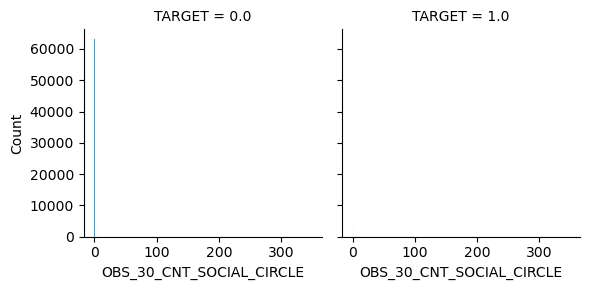

<Figure size 2000x2000 with 0 Axes>

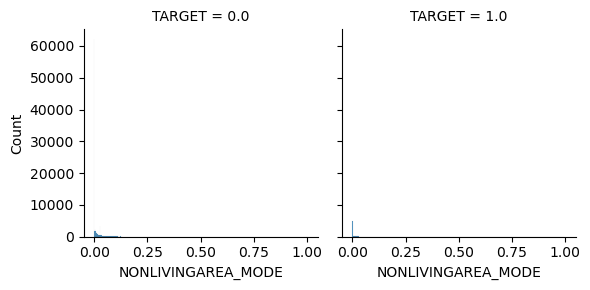

<Figure size 2000x2000 with 0 Axes>

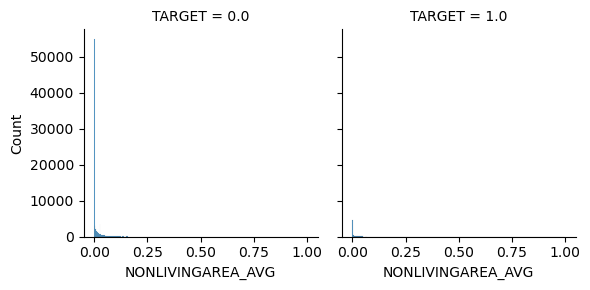

<Figure size 2000x2000 with 0 Axes>

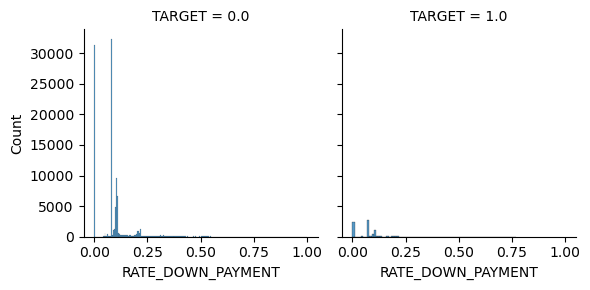

<Figure size 2000x2000 with 0 Axes>

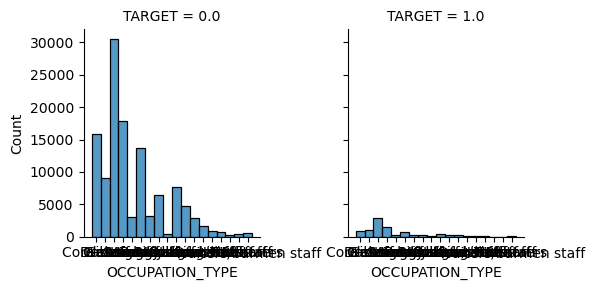

<Figure size 2000x2000 with 0 Axes>

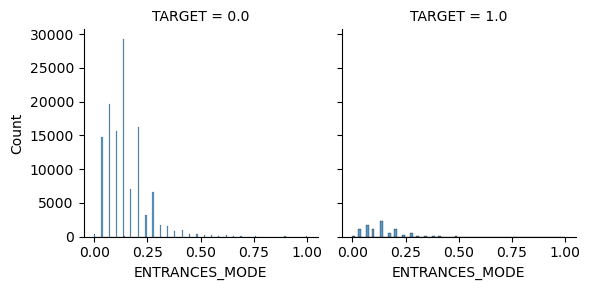

<Figure size 2000x2000 with 0 Axes>

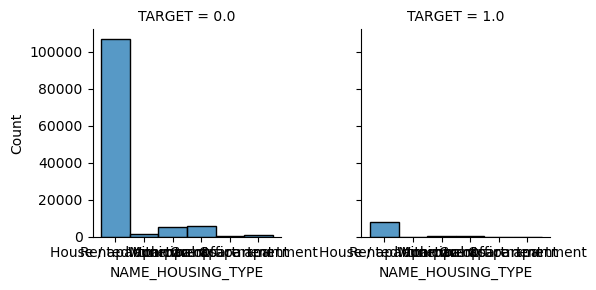

<Figure size 2000x2000 with 0 Axes>

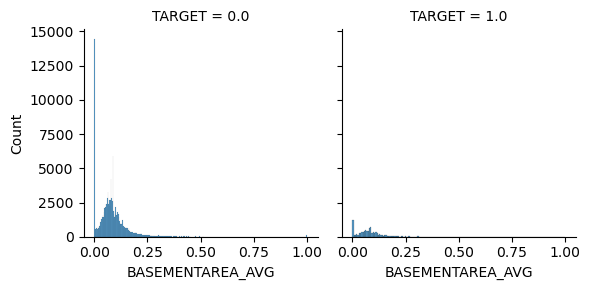

<Figure size 2000x2000 with 0 Axes>

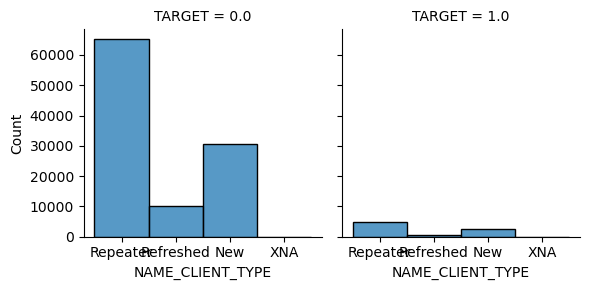

<Figure size 2000x2000 with 0 Axes>

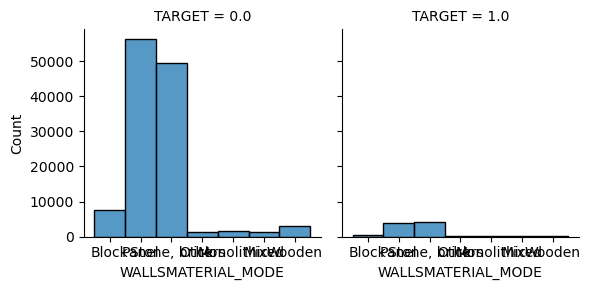

<Figure size 2000x2000 with 0 Axes>

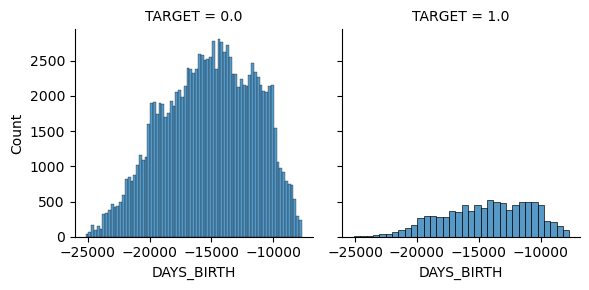

<Figure size 2000x2000 with 0 Axes>

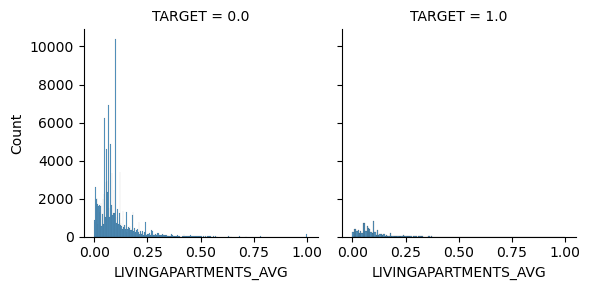

<Figure size 2000x2000 with 0 Axes>

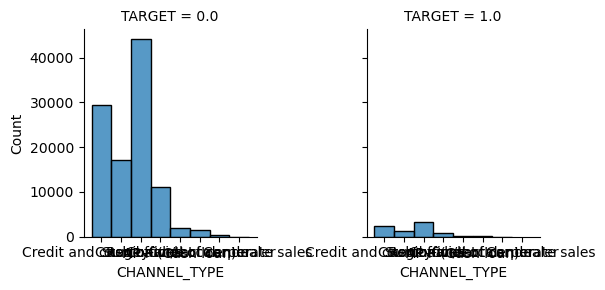

<Figure size 2000x2000 with 0 Axes>

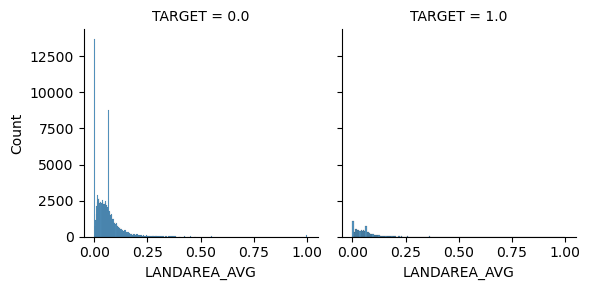

<Figure size 2000x2000 with 0 Axes>

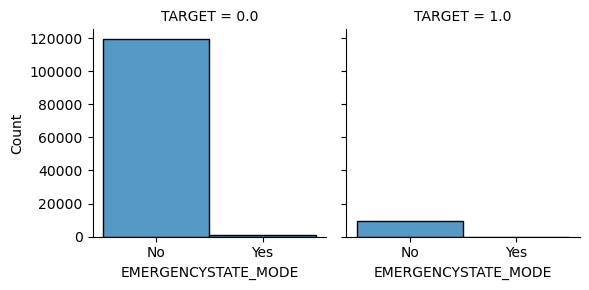

<Figure size 2000x2000 with 0 Axes>

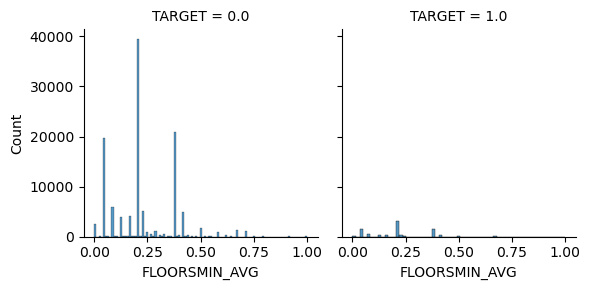

<Figure size 2000x2000 with 0 Axes>

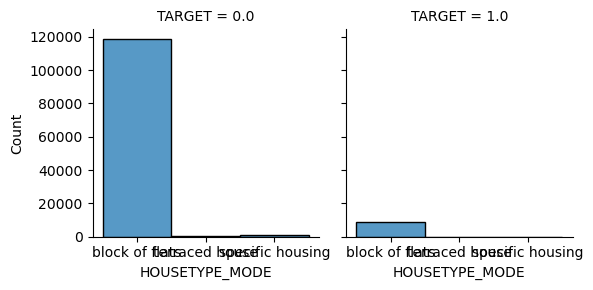

<Figure size 2000x2000 with 0 Axes>

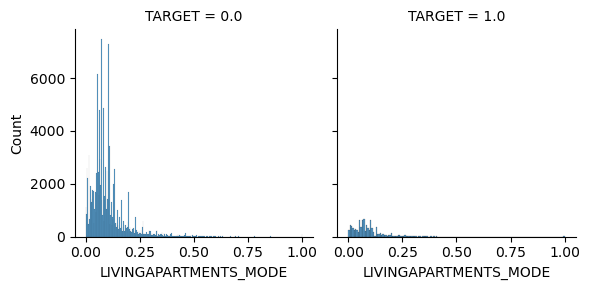

<Figure size 2000x2000 with 0 Axes>

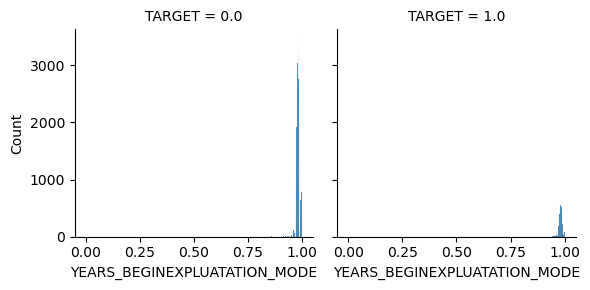

<Figure size 2000x2000 with 0 Axes>

KeyboardInterrupt: 

In [115]:
for i in set(Total_Data.columns)-set('TARGET'):
    plt.figure(figsize = (20,20))
    k = sns.FacetGrid(data=Total_Data, col='TARGET')
    k.map(sns.histplot, i)
    plt.show()

## Bivariate Analysis

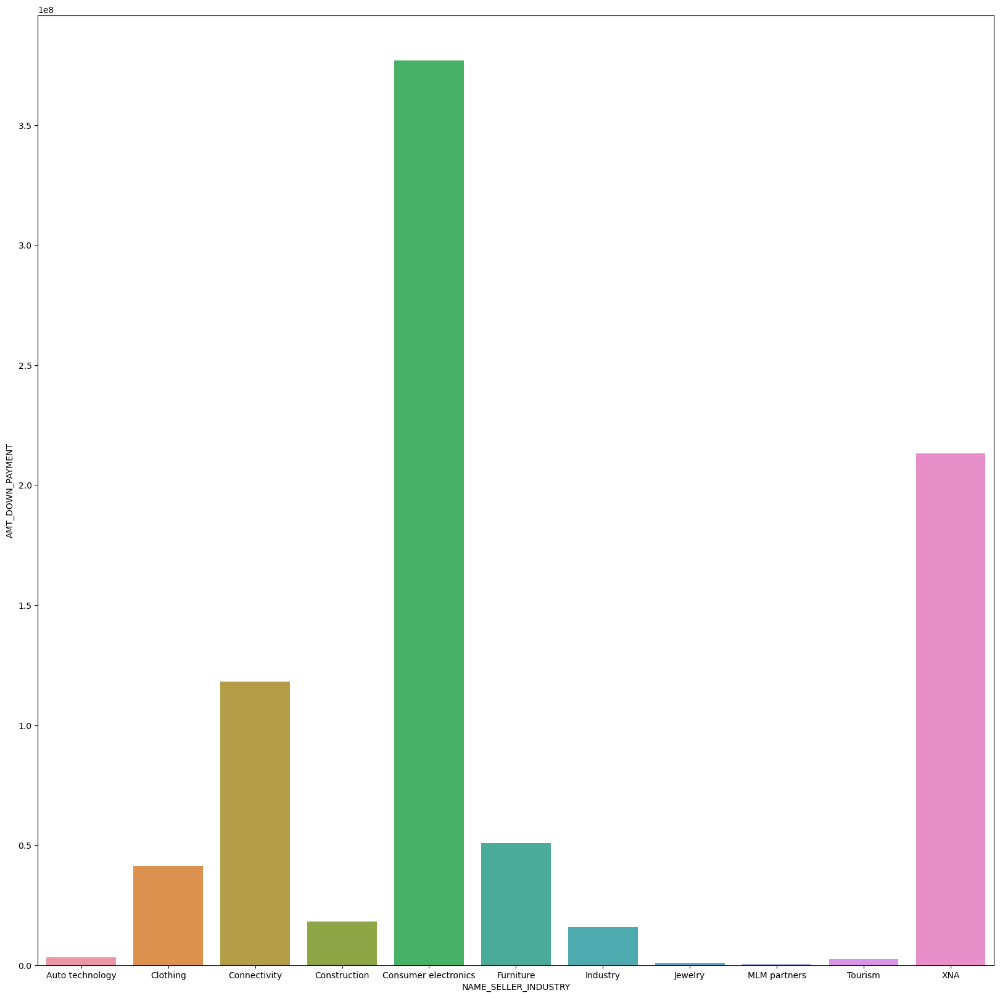

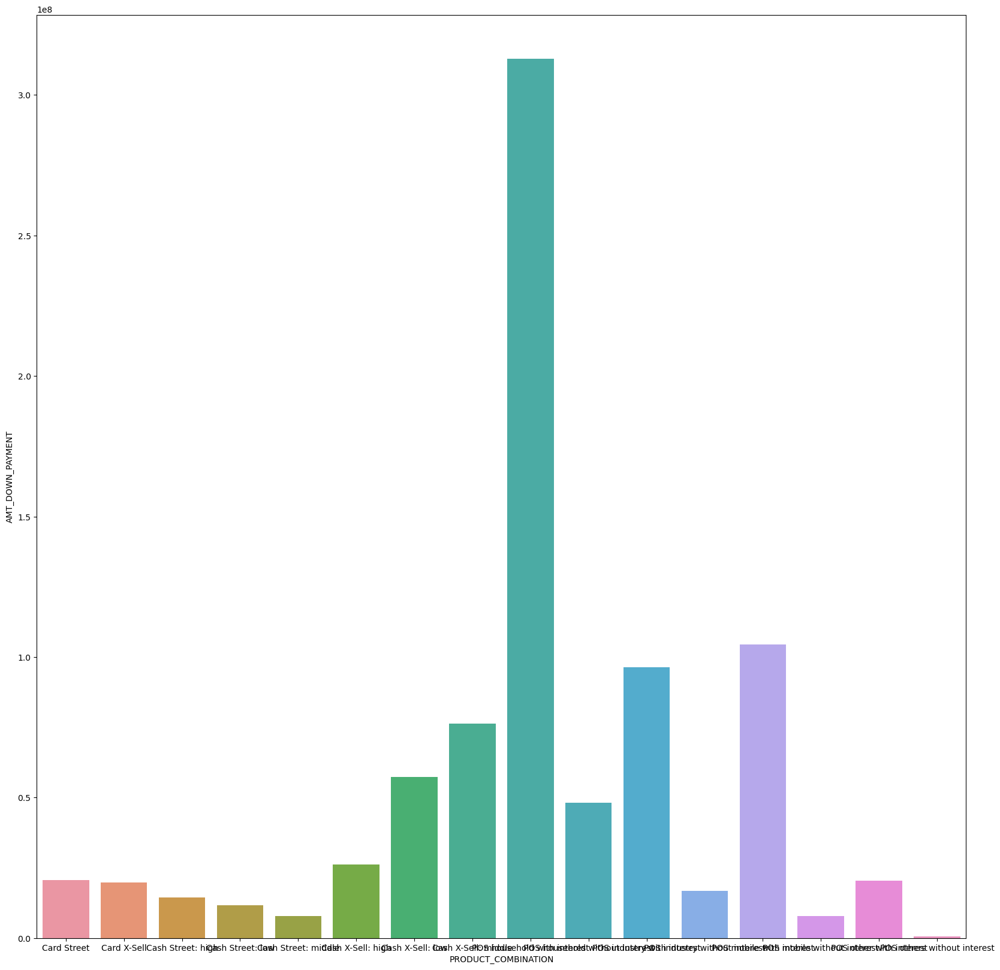

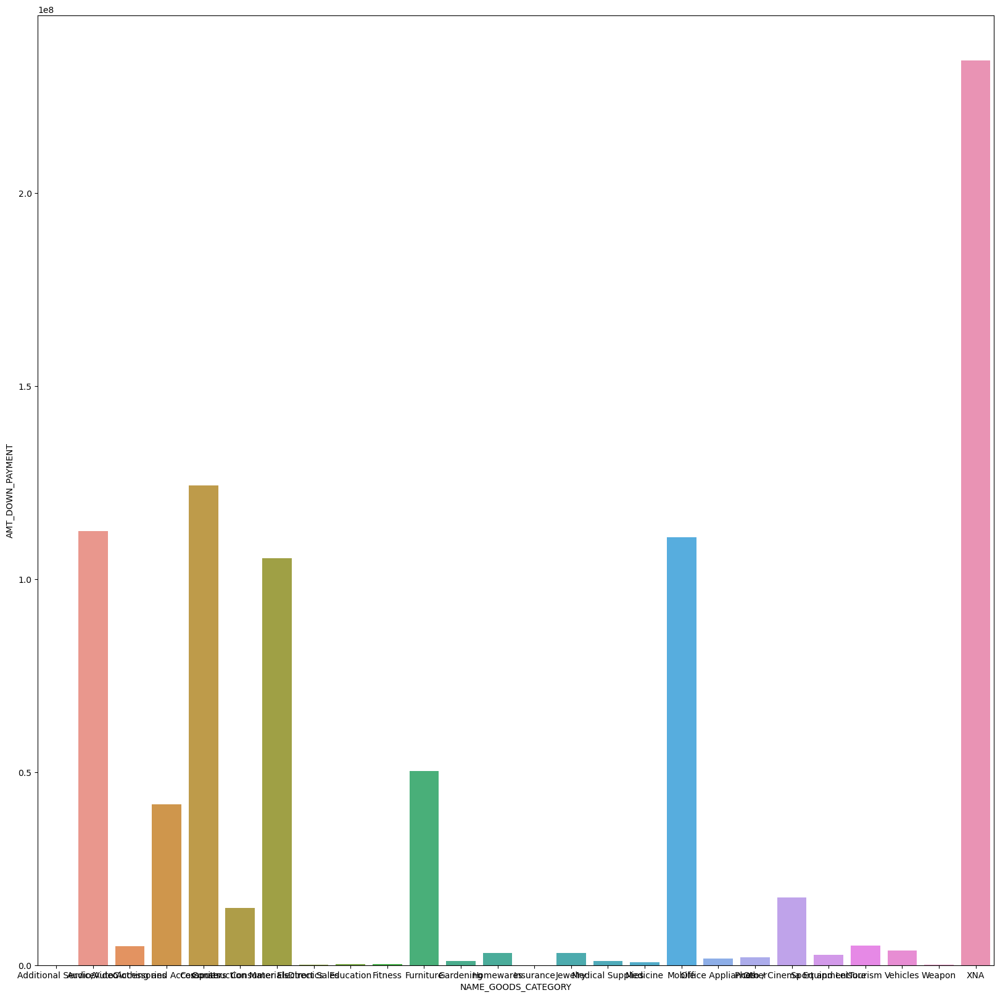

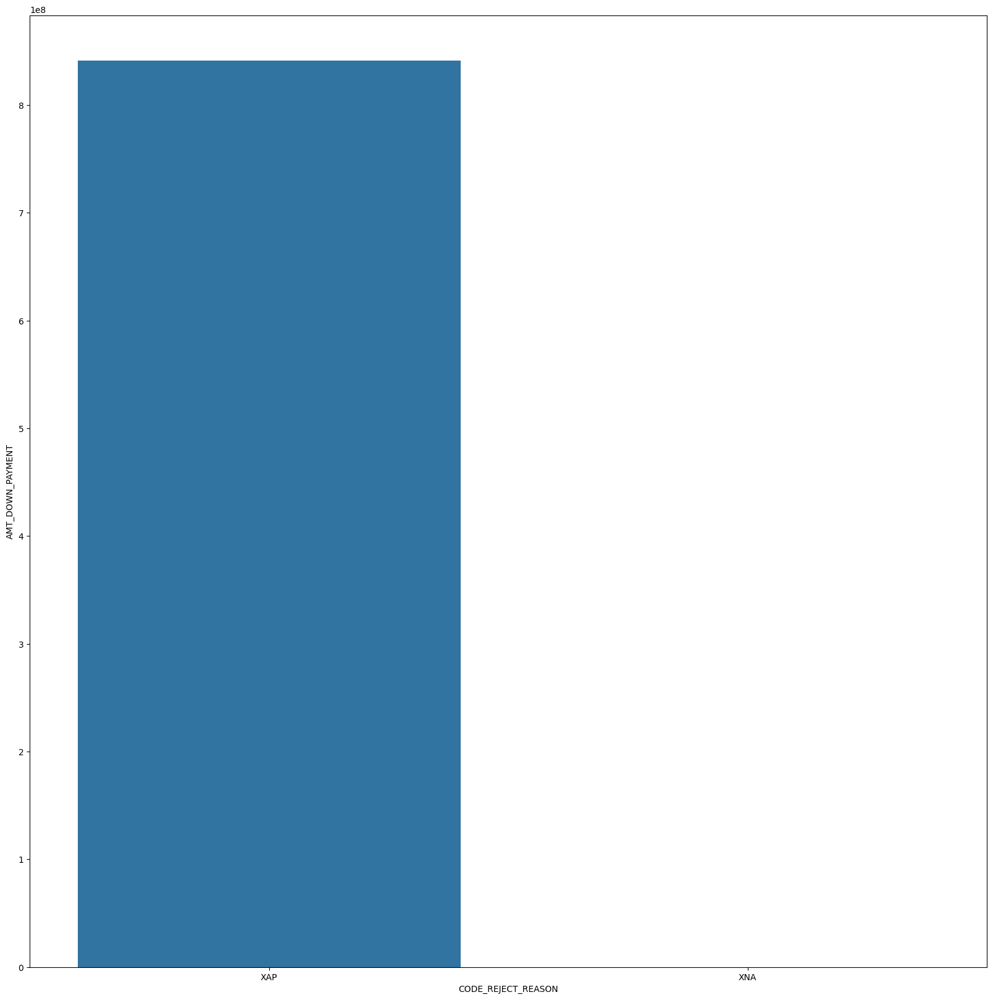

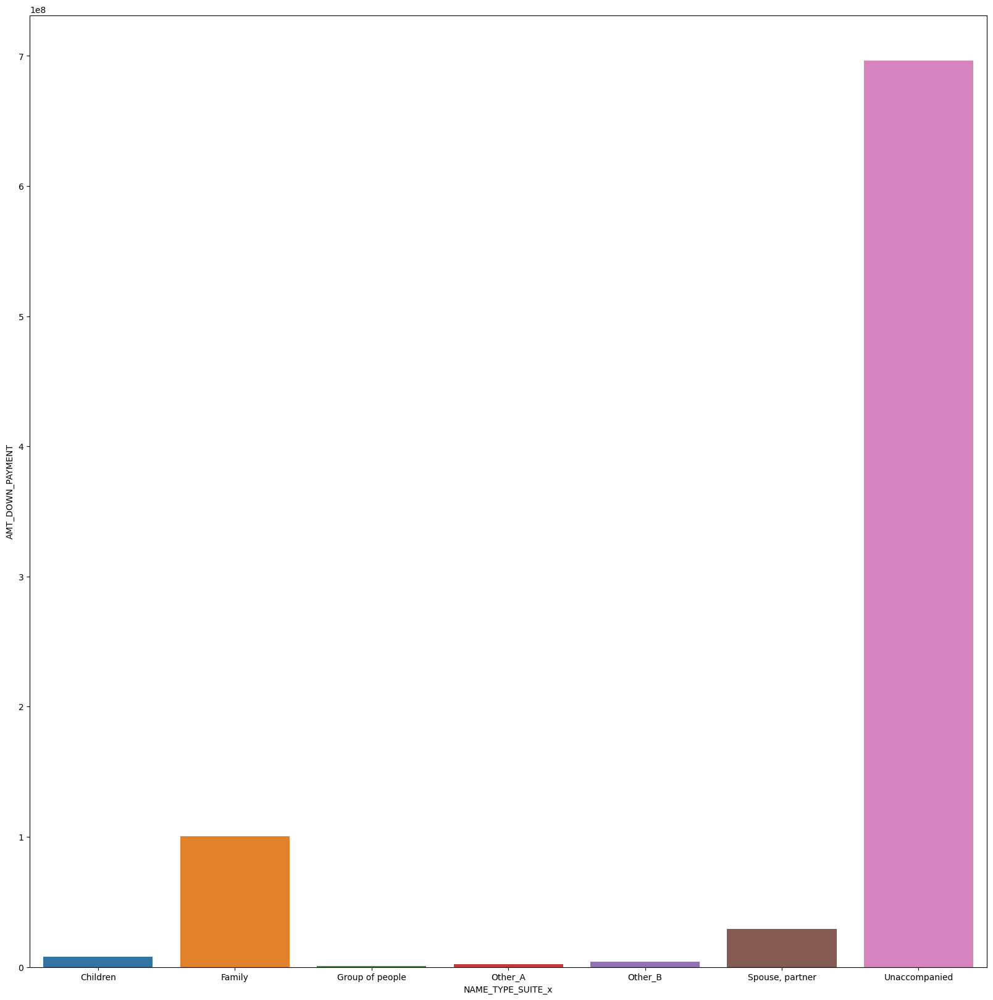

...

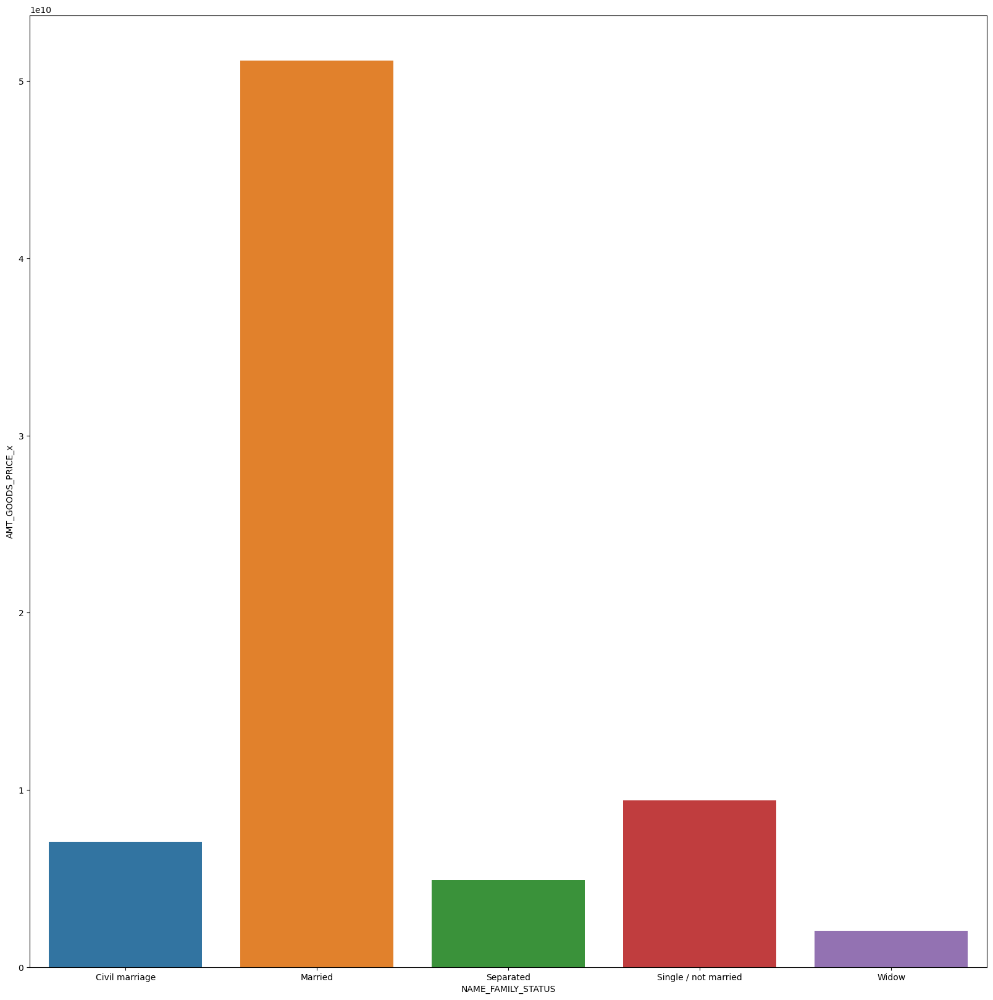

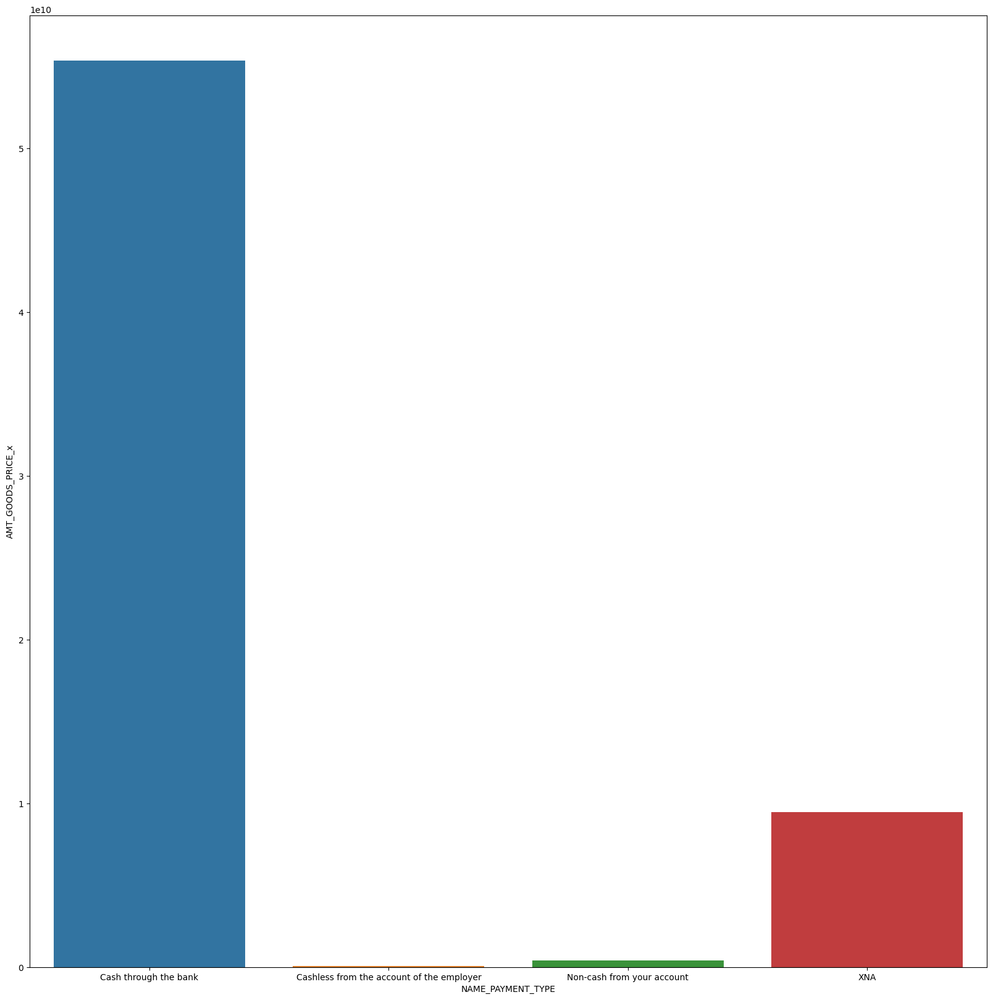

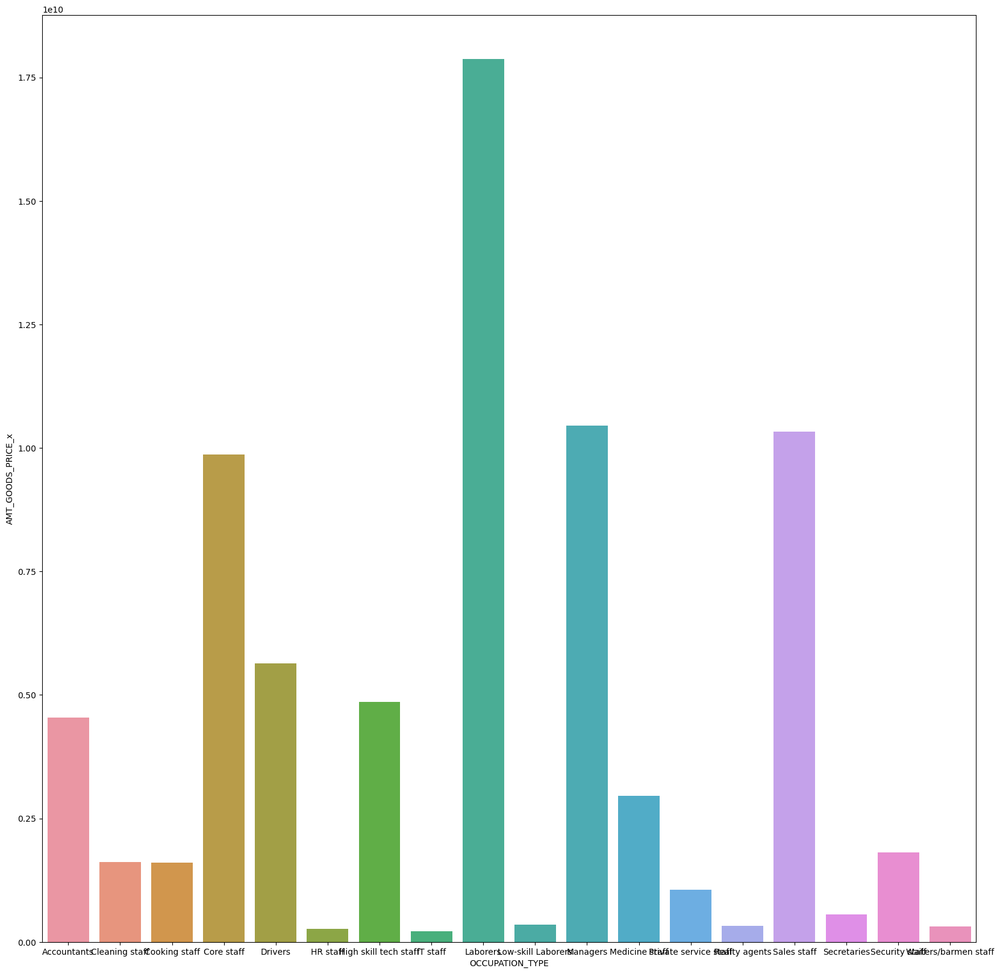

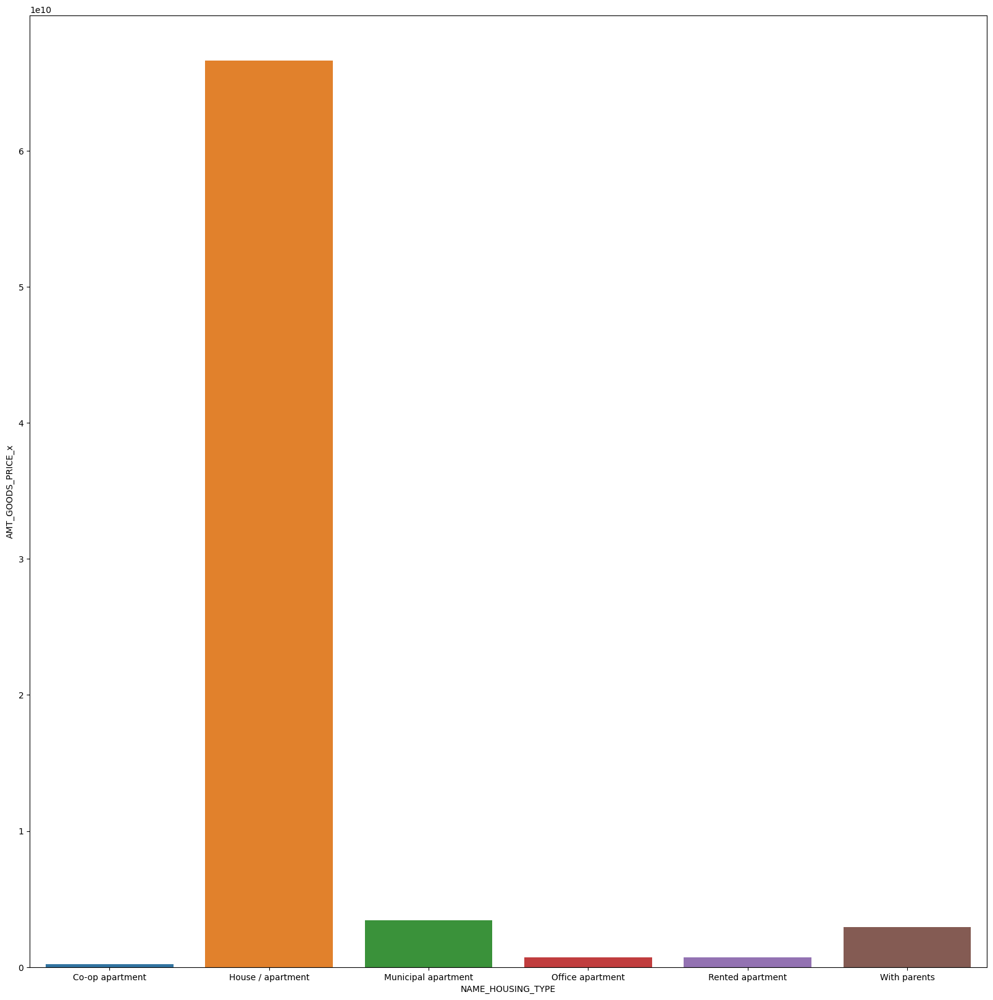

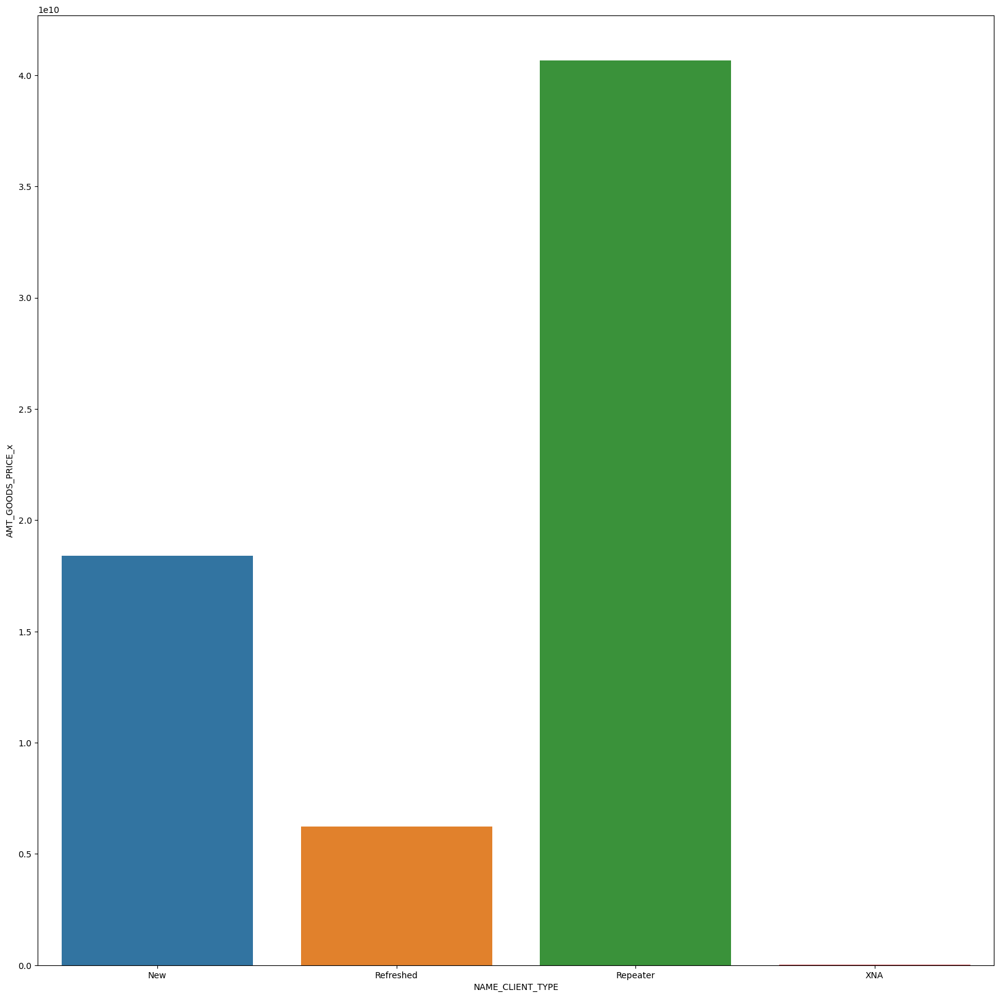

KeyboardInterrupt: 

In [94]:
for i in set(Total_Data.select_dtypes(include = (float,int)).columns):
    for j in set(Total_Data.select_dtypes(exclude = (float,int)).columns):
        data1 = Total_Data.groupby(j)[i].sum().reset_index()
        plt.figure(figsize = (20,20))
        sns.barplot(x = j,y = i,data =data1 )
        plt.show()

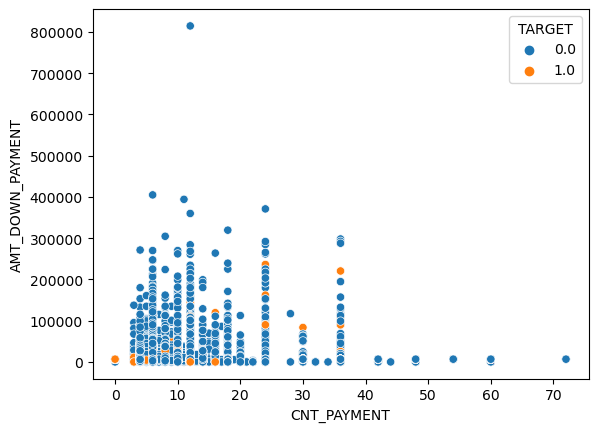

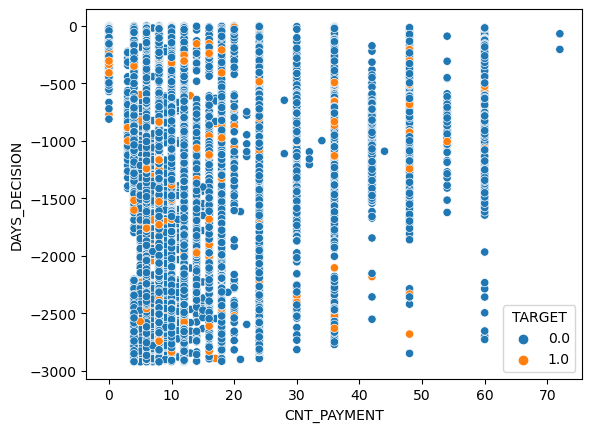

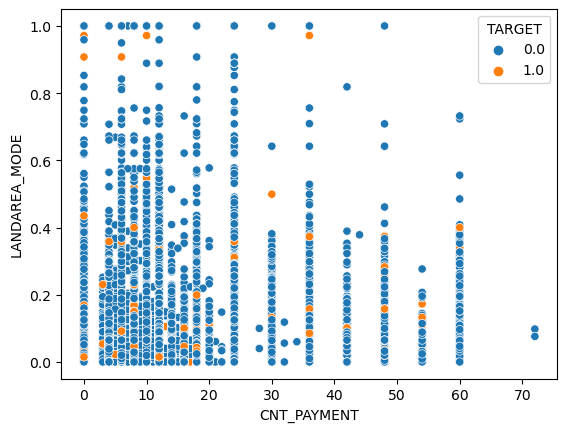

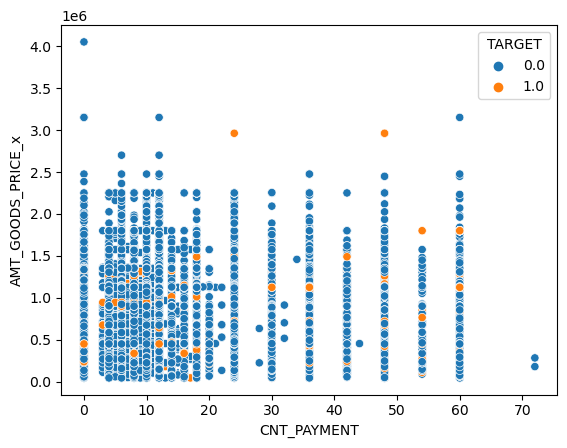

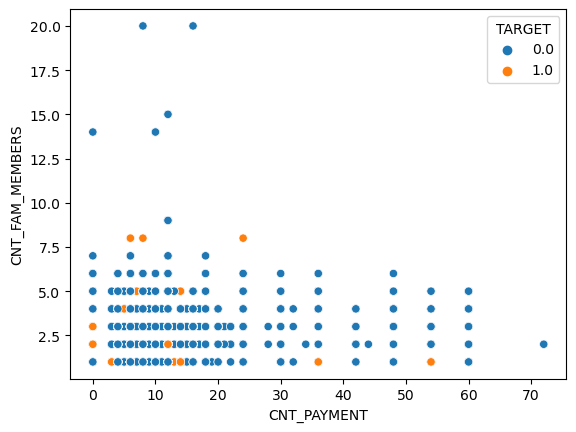

...

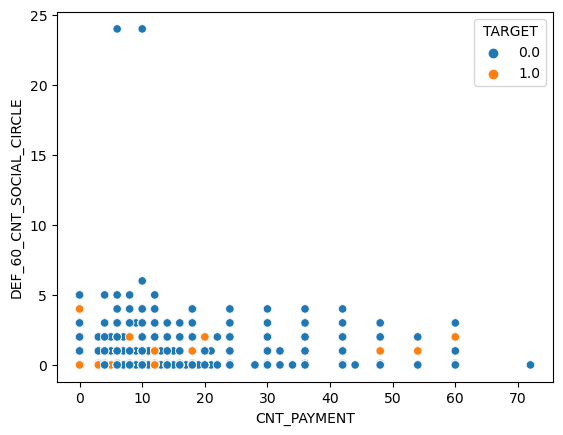

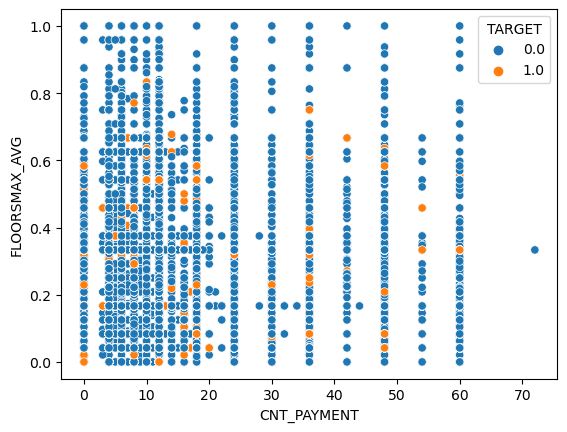

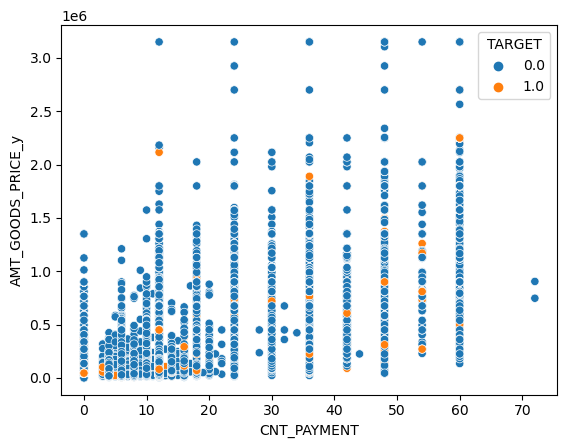

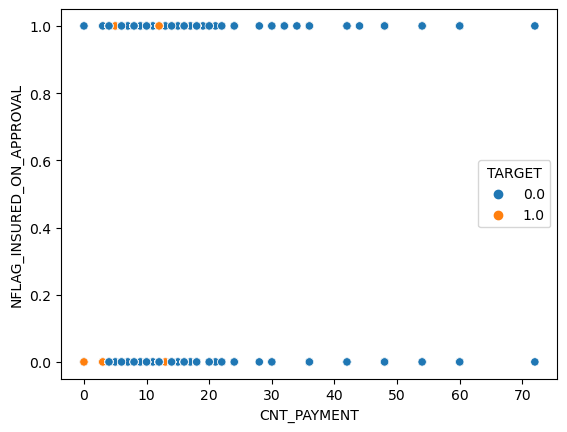

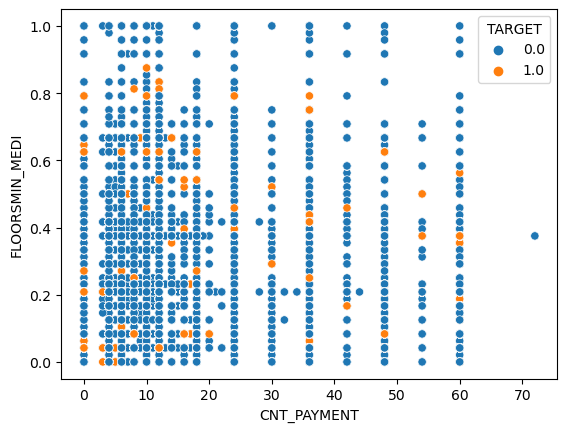

KeyboardInterrupt: 

In [109]:
for i in set(Total_Data.select_dtypes(include = (float,int)).columns)-set('TARGET'):
    for j in set(Total_Data.select_dtypes(include = (float,int)).columns)-set('TARGET'):
        if i != j:
            sns.scatterplot(x = i,y = j,hue = 'TARGET',data =Total_Data)
            plt.show()

## Step-5 - Finding Top 5 Correlation with Target Variable

In [96]:
Top_Variables = []
Top_Values = []
for i in set(Total_Data.select_dtypes(include = (float,int)).columns)-set('TARGET'):
    print(i,Total_Data[i].corr(Total_Data['TARGET'],method = 'pearson'))
    Top_Variables.append(i)
    Top_Values.append(Total_Data[i].corr(Total_Data['TARGET'],method = 'pearson'))
        

CNT_PAYMENT 0.019591752547034012
AMT_DOWN_PAYMENT -0.02422695092295027
DAYS_DECISION 0.02063985517105654
LANDAREA_MODE -0.010420629000085013
AMT_GOODS_PRICE_x -0.03862887199907357
CNT_FAM_MEMBERS -0.004069040685339673
ENTRANCES_MEDI -0.014987497020351672
CNT_CHILDREN 0.0060159407443587465
DEF_60_CNT_SOCIAL_CIRCLE 0.03263265340805673
FLOORSMAX_AVG -0.0397957560561074
AMT_GOODS_PRICE_y -0.011897688474415954
NFLAG_INSURED_ON_APPROVAL 0.009145809350175262
FLOORSMIN_MEDI -0.034815447961996815
TOTALAREA_MODE -0.02689741494043105
YEARS_BUILD_AVG -0.0247338509386042
ENTRANCES_AVG -0.015333079428185507
OBS_30_CNT_SOCIAL_CIRCLE 0.014431005444729453
NONLIVINGAREA_MODE -0.01109266029248618
NONLIVINGAREA_AVG -0.011674284655422897
RATE_DOWN_PAYMENT -0.017993892246439873
ENTRANCES_MODE -0.014087539747837075
BASEMENTAREA_AVG -0.016614432685924895
DAYS_BIRTH 0.056079021810455314
LIVINGAPARTMENTS_AVG -0.023890871822560566
LANDAREA_AVG -0.010752561435635053
FLOORSMIN_AVG -0.034998216981659724
LIVINGAPART

In [97]:
my_dict = dict(zip(Top_Variables,Top_Values))
sorted_dict = {k: v for k, v in sorted(my_dict.items(), key=lambda item: item[1], reverse=True)}


In [98]:
sorted_dict

{'TARGET': 0.9999999999999998,
 'DAYS_EMPLOYED': 0.06255529645782781,
 'REGION_RATING_CLIENT_W_CITY': 0.0570937743407961,
 'DAYS_BIRTH': 0.056079021810455314,
 'REGION_RATING_CLIENT': 0.05282116598569049,
 'DEF_30_CNT_SOCIAL_CIRCLE': 0.03589010452930863,
 'DEF_60_CNT_SOCIAL_CIRCLE': 0.03263265340805673,
 'DAYS_LAST_DUE_1ST_VERSION': 0.02432363144939272,
 'REG_CITY_NOT_WORK_CITY': 0.023510238004957416,
 'DAYS_DECISION': 0.02063985517105654,
 'CNT_PAYMENT': 0.019591752547034012,
 'LIVE_CITY_NOT_WORK_CITY': 0.017364967575895732,
 'DAYS_TERMINATION': 0.017313162823810065,
 'DAYS_LAST_DUE': 0.016704366985027558,
 'OBS_30_CNT_SOCIAL_CIRCLE': 0.014431005444729453,
 'OBS_60_CNT_SOCIAL_CIRCLE': 0.014253710871129274,
 'NFLAG_INSURED_ON_APPROVAL': 0.009145809350175262,
 'CNT_CHILDREN': 0.0060159407443587465,
 'RATE_INTEREST_PRIMARY': 0.002006447377171473,
 'FLAG_EMP_PHONE': 0.0015458317585546571,
 'NFLAG_LAST_APPL_IN_DAY': 0.0008184994740091052,
 'SK_ID_PREV': -0.0006794504485358502,
 'SELLERPLAC

In [99]:
Target = []
for i in Total_Data['TARGET']:
    if i ==0:Target.append('Other Issues')
    elif i ==1:Target.append('Getting Late facing difficulty to Pay')
    else:
        pass

In [100]:
Total_Data['Target']=Target

In [101]:
Top_Variables = []
Top_Values = []
for i in set(Total_Data.select_dtypes(exclude = (float,int)).columns)-set('Target'):
    cross_tab = pd.crosstab(Total_Data[i], Total_Data['Target'])
    chi2, p, dof, expected = sp.stats.chi2_contingency(cross_tab)
    print("Chi-square statistic:", chi2)
    print("p-value:", p)
    Top_Variables.append(i)
    Top_Values.append(p)
        

Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 276.23166215603663
p-value: 4.756432303023019e-50
Chi-square statistic: 158.68465203448642
p-value: 2.0754120713642264e-21
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 138.2729383193681
p-value: 9.42785611150394e-31
Chi-square statistic: 80.50511498232416
p-value: 3.3001706614651884e-18
Chi-square statistic: 184.96357002721717
p-value: 6.403215062773606e-39
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 129616.00961022216
p-value: 0.0
Chi-square statistic: 42.02915828223994
p-value: 3.955368835042582e-09
Chi-square statistic: 736.1519916784046
p-value: 1.790107042069559e-145
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 56.87966074126391
p-value: 2.726469347320153e-12
Chi-square statistic: 69.25530749073482
p-value

In [102]:
my_dict = dict(zip(Top_Variables,Top_Values))
sorted_dict = {k: v for k, v in sorted(my_dict.items(), key=lambda item: item[1], reverse=False)}

In [103]:
sorted_dict

{'Target': 0.0,
 'OCCUPATION_TYPE': 1.790107042069559e-145,
 'NAME_EDUCATION_TYPE': 1.520662575604912e-105,
 'ORGANIZATION_TYPE': 7.434113652948711e-73,
 'NAME_INCOME_TYPE': 5.602593981942963e-55,
 'PRODUCT_COMBINATION': 4.756432303023019e-50,
 'NAME_CONTRACT_TYPE_x': 1.2957787671473614e-40,
 'NAME_YIELD_GROUP': 6.403215062773606e-39,
 'NAME_FAMILY_STATUS': 2.880703727207134e-37,
 'CODE_GENDER': 9.42785611150394e-31,
 'NAME_PRODUCT_TYPE': 3.4888301073617625e-23,
 'NAME_GOODS_CATEGORY': 2.0754120713642264e-21,
 'NAME_HOUSING_TYPE': 2.9646916671245007e-21,
 'FLAG_OWN_CAR': 2.9791334856967343e-21,
 'NAME_SELLER_INDUSTRY': 7.202720815360072e-21,
 'NAME_PORTFOLIO': 3.3001706614651884e-18,
 'NAME_CONTRACT_TYPE_y': 3.300170661465212e-18,
 'WALLSMATERIAL_MODE': 5.811490300193046e-13,
 'NAME_CLIENT_TYPE': 2.726469347320153e-12,
 'CHANNEL_TYPE': 4.0835788795093024e-12,
 'NAME_PAYMENT_TYPE': 3.955368835042582e-09,
 'WEEKDAY_APPR_PROCESS_START_x': 6.473101178526269e-07,
 'HOUSETYPE_MODE': 2.526719

## 'DAYS_EMPLOYED': 0.06255529645782781,
## 'REGION_RATING_CLIENT_W_CITY': 0.0570937743407961,
## 'DAYS_BIRTH': 0.056079021810455314,
## 'REGION_RATING_CLIENT': 0.05282116598569049,
## 'DEF_30_CNT_SOCIAL_CIRCLE': 0.03589010452930863
## 'TARGET': 0.9999999999999998   are Top correlation with Target in continuous Variables
## 'OCCUPATION_TYPE': 1.790107042069559e-145,
## 'NAME_EDUCATION_TYPE': 1.520662575604912e-105,
## 'ORGANIZATION_TYPE': 7.434113652948711e-73,
## 'NAME_INCOME_TYPE': 5.602593981942963e-55,
##  'PRODUCT_COMBINATION': 4.756432303023019e-50    are Top correlation with Target in Categorical Variables


In [104]:
Top_Variables = []
Top_Values = []
for i in set(Total_Data.select_dtypes(exclude = (float,int)).columns):
    for j in set(Total_Data.select_dtypes(exclude = (float,int)).columns):
        if i!=j:
            cross_tab = pd.crosstab(Total_Data[i], Total_Data['Target'])
            chi2, p, dof, expected = sp.stats.chi2_contingency(cross_tab)
            print("Chi-square statistic:", chi2)
            print("p-value:", p)
            Top_Variables.append(i+'with'+j)
            Top_Values.append(p)
        

Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360072e-21
Chi-square statistic: 119.24415749394328
p-value: 7.202720815360

Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic: 19.51772745787069
p-value: 0.003373012411008643
Chi-square statistic

Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207134e-37
Chi-square statistic: 177.26668237800934
p-value: 2.880703727207

Chi-square statistic: 736.1519916784046
p-value: 1.790107042069559e-145
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.9646916671245007e-21
Chi-square statistic: 105.93095157838313
p-value: 2.

Chi-square statistic: 67.81258741570119
p-value: 4.0835788795093024e-12
Chi-square statistic: 67.81258741570119
p-value: 4.0835788795093024e-12
Chi-square statistic: 67.81258741570119
p-value: 4.0835788795093024e-12
Chi-square statistic: 67.81258741570119
p-value: 4.0835788795093024e-12
Chi-square statistic: 67.81258741570119
p-value: 4.0835788795093024e-12
Chi-square statistic: 67.81258741570119
p-value: 4.0835788795093024e-12
Chi-square statistic: 67.81258741570119
p-value: 4.0835788795093024e-12
Chi-square statistic: 67.81258741570119
p-value: 4.0835788795093024e-12
Chi-square statistic: 1.2528197763433162
p-value: 0.2630145979034678
Chi-square statistic: 1.2528197763433162
p-value: 0.2630145979034678
Chi-square statistic: 1.2528197763433162
p-value: 0.2630145979034678
Chi-square statistic: 1.2528197763433162
p-value: 0.2630145979034678
Chi-square statistic: 1.2528197763433162
p-value: 0.2630145979034678
Chi-square statistic: 1.2528197763433162
p-value: 0.2630145979034678
Chi-square

Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 1.1667319678309465
p-value: 0.28007375202260865
Chi-square statistic: 178.0438912184265
p-value: 1.2957787671473614e-40
Chi-square statistic: 178.0438912184265
p-value: 1.2957787671473614e-40
Chi-square statistic: 178.0438912184265
p-value: 1.2957787671473614e-40
Chi-square sta

Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3.4888301073617625e-23
Chi-square statistic: 103.41978134327081
p-value: 3

Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 45.403858963501705
p-value: 0.0023577367117765414
Chi-square statistic: 45.403858963501705
p-value: 0.0023577367117765414
Chi-square statistic: 45.403858963501

Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 0.0
p-value: 1.0
Chi-square statistic: 501.60934125685975
p-value: 7.434113652948711e-73
Chi-square statistic: 501.60934125685975
p-value: 7.434113652948711e-73
Chi-square statistic: 501.60934125685975
p-value: 7.434113652948711e-73
Chi-square statistic: 501.60934125685975
p-value: 7.434113652948711e-73
Chi-square statistic: 501.60934125685975
p-value: 7.434113652948711e-73
Chi-square stati

In [105]:
Top_Variables

['NAME_SELLER_INDUSTRYwithPRODUCT_COMBINATION',
 'NAME_SELLER_INDUSTRYwithNAME_GOODS_CATEGORY',
 'NAME_SELLER_INDUSTRYwithCODE_REJECT_REASON',
 'NAME_SELLER_INDUSTRYwithNAME_TYPE_SUITE_x',
 'NAME_SELLER_INDUSTRYwithCODE_GENDER',
 'NAME_SELLER_INDUSTRYwithNAME_PORTFOLIO',
 'NAME_SELLER_INDUSTRYwithNAME_YIELD_GROUP',
 'NAME_SELLER_INDUSTRYwithNAME_FAMILY_STATUS',
 'NAME_SELLER_INDUSTRYwithTarget',
 'NAME_SELLER_INDUSTRYwithNAME_PAYMENT_TYPE',
 'NAME_SELLER_INDUSTRYwithOCCUPATION_TYPE',
 'NAME_SELLER_INDUSTRYwithNAME_HOUSING_TYPE',
 'NAME_SELLER_INDUSTRYwithNAME_CLIENT_TYPE',
 'NAME_SELLER_INDUSTRYwithWALLSMATERIAL_MODE',
 'NAME_SELLER_INDUSTRYwithCHANNEL_TYPE',
 'NAME_SELLER_INDUSTRYwithEMERGENCYSTATE_MODE',
 'NAME_SELLER_INDUSTRYwithNAME_CONTRACT_TYPE_y',
 'NAME_SELLER_INDUSTRYwithHOUSETYPE_MODE',
 'NAME_SELLER_INDUSTRYwithFLAG_OWN_REALTY',
 'NAME_SELLER_INDUSTRYwithNAME_CONTRACT_TYPE_x',
 'NAME_SELLER_INDUSTRYwithNAME_TYPE_SUITE_y',
 'NAME_SELLER_INDUSTRYwithWEEKDAY_APPR_PROCESS_START_

In [106]:
my_dict = dict(zip(Top_Variables,Top_Values))
sorted_dict = {k: v for k, v in sorted(my_dict.items(), key=lambda item: item[1], reverse=False)}

In [107]:
sorted_dict

{'TargetwithNAME_SELLER_INDUSTRY': 0.0,
 'TargetwithPRODUCT_COMBINATION': 0.0,
 'TargetwithNAME_GOODS_CATEGORY': 0.0,
 'TargetwithCODE_REJECT_REASON': 0.0,
 'TargetwithNAME_TYPE_SUITE_x': 0.0,
 'TargetwithCODE_GENDER': 0.0,
 'TargetwithNAME_PORTFOLIO': 0.0,
 'TargetwithNAME_YIELD_GROUP': 0.0,
 'TargetwithNAME_FAMILY_STATUS': 0.0,
 'TargetwithNAME_PAYMENT_TYPE': 0.0,
 'TargetwithOCCUPATION_TYPE': 0.0,
 'TargetwithNAME_HOUSING_TYPE': 0.0,
 'TargetwithNAME_CLIENT_TYPE': 0.0,
 'TargetwithWALLSMATERIAL_MODE': 0.0,
 'TargetwithCHANNEL_TYPE': 0.0,
 'TargetwithEMERGENCYSTATE_MODE': 0.0,
 'TargetwithNAME_CONTRACT_TYPE_y': 0.0,
 'TargetwithHOUSETYPE_MODE': 0.0,
 'TargetwithFLAG_OWN_REALTY': 0.0,
 'TargetwithNAME_CONTRACT_TYPE_x': 0.0,
 'TargetwithNAME_TYPE_SUITE_y': 0.0,
 'TargetwithWEEKDAY_APPR_PROCESS_START_x': 0.0,
 'TargetwithNAME_PRODUCT_TYPE': 0.0,
 'TargetwithNAME_INCOME_TYPE': 0.0,
 'TargetwithNAME_EDUCATION_TYPE': 0.0,
 'TargetwithWEEKDAY_APPR_PROCESS_START_y': 0.0,
 'TargetwithFLAG_LAS

In [108]:
Total_Data['NAME_FAMILY_STATUS'].unique()

array(['Single / not married', 'Married', 'Widow', 'Civil marriage',
       'Separated'], dtype=object)

## 'OCCUPATION_TYPE with NAME_HOUSING_TYPE'
## 'OCCUPATION_TYPE  with NAME_FAMILY_STATUS'
## 'OCCUPATION_TYPE with NAME_INCOME_TYPE'
## 'NAME_EDUCATION_TYPEwithORGANIZATION_TYPE'   are the top correlations with each other in categorical